# Calculate the Binary LGE hit or miss ratios
Between LGE Segments and Segments defined by Circle or Tarique

## Column: 'Tarique abnormal'

bullsplot used here
tarique, bullsplot, motion curves
11 - mid inferolateral 

first: quality check: single segments only is very rare, two segments are better/more often that means more plausible. Not just the septum is affected. If all segments are affected, tracking may be wrong. 
second: based on experience, 11 and 12 AHA are mostly affected. Check also on circumferential and radial strain values, are they low? Bullseye plot is used for help.

## Column: 'Strain diff' 

Bezieht sich auf die orginal column: 'Segment from strain if different'

- tarique says this is difference between D and F
- tarique says this column is not helpful
- tarique says this columns relates to if different from LGE

He also said that this column shows the additional segments when he applies the Strain thresholding



# Define some helper functions (moved to the python module "Evaluate")

In [1]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

%matplotlib inline
%reload_ext autoreload
%autoreload 2
import ipywidgets
from ipywidgets import interact, interact_manual
import ipywidgets as widgets
import os
import pandas as pd
import numpy as np
np.random.seed(42)
import matplotlib.pyplot as plt
import seaborn as sb
from ProjectRoot import change_wd_to_project_root
change_wd_to_project_root()
from src.utils.Evaluation import create_df_peak, get_pvals_uncorrected, get_pvals_corrected, cross_validate_f1, create_grid_search, ttest_per_keyframe, plot_strain_per_time, plot_report

search for root_dir and set working directory
Working directory set to: /mnt/ssd/git/dynamic-cmr-models


# Read the dmd dataframe with all timesteps

In [2]:
from ipyfilechooser import FileChooser
# /mnt/ssd/git/dynamic-cmr-models/exp/p2p/dmd/v4/ablation/
# /mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/ablation/

import os
path_chooser = FileChooser(os.path.join(os.getcwd(),'/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/circulation/'), '')
# integrate 25 healthy control patients
load_controls_checkbox = widgets.Checkbox(
    value=False,
    description='load controls',
    disabled=False,
    indent=False
)
display(path_chooser, load_controls_checkbox)
@interact_manual
def load_strain_values():
    global df_strain_comp, df_strain_p2p, load_controls
    
    #/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/register_backwards_compose_v2/img1_msk0_reg0_01_v2
    #df_strain_comp = pd.read_csv('/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/register_backwards_compose_v2/img1_msk0_reg0_01_v2/df_DMD_time_ed2p.csv')
    #df_strain_p2p = pd.read_csv('/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/dmd/v4/register_backwards_compose_v2/img1_msk0_reg0_01_v2/df_DMD_time_p2p.csv')
    df_strain_comp = pd.read_csv(os.path.join(path_chooser.selected, 'df_DMD_time_ed2p.csv'))
    df_strain_p2p = pd.read_csv(os.path.join(path_chooser.selected,'df_DMD_time_p2p.csv'))
    df_strain_comp['dmd'] = 1
    df_strain_p2p['dmd'] = 1

    
    if load_controls_checkbox.value:
        try: # integration of the controls, if requested/given
            df_strain_comp_c = pd.read_csv(os.path.join(path_chooser.selected, 'controls','df_DMD_time_ed2p.csv'))
            df_strain_p2p_c = pd.read_csv(os.path.join(path_chooser.selected,'controls','df_DMD_time_p2p.csv'))
            print('concat some controls!', df_strain_comp.shape)
            df_strain_comp_c['dmd'] = 0
            df_strain_p2p_c['dmd'] = 0
            df_strain_comp_c.sort_values(by=['pat', 'aha'], inplace=True)
            df_strain_p2p_c.sort_values(by=['pat', 'aha'], inplace=True)

            df_strain_comp = pd.concat([df_strain_comp, df_strain_comp_c], axis=0)
            df_strain_p2p = pd.concat([df_strain_p2p, df_strain_p2p_c], axis=0) 
            print('found some controls!', df_strain_comp.shape)
        except Exception as e:
            print('load controls failed with: {}'.format(str(e)))

    df_strain_comp.sort_values(by=['pat', 'aha'], inplace=True)
    df_strain_p2p.sort_values(by=['pat', 'aha'], inplace=True)
    print(df_strain_comp[df_strain_comp.isna().any(axis=1)])
    print(df_strain_p2p[df_strain_p2p.isna().any(axis=1)])

    df_strain_comp = df_strain_comp.fillna(df_strain_comp.mean())
    df_strain_p2p = df_strain_p2p.fillna(df_strain_p2p.mean())

    print('shape y == number of patients: ', len(df_strain_p2p.pat.unique()))
    print(df_strain_comp.shape)
    print(df_strain_p2p.shape)
    #df_strain_comp.head()
    # we need to make sure that we differentate lge pos/neg on a patient level on all segments, not only on the segments of interest
    print(df_strain_comp.describe())
    print(df_strain_p2p.describe())

FileChooser(path='/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/circulation', filename='', title='HTM…

Checkbox(value=False, description='load controls', indent=False)

interactive(children=(Button(description='Run Interact', style=ButtonStyle()), Output()), _dom_classes=('widge…

# Merge with Metadata

In [127]:
df_strain_comp['PID'] = df_strain_comp.pat.apply(lambda x: x.split('_')[0].split('-')[1].lower())
df_strain_p2p['PID'] = df_strain_p2p.pat.apply(lambda x: x.split('_')[0].split('-')[1].lower())
df_strain_comp.head()

meta = pd.read_csv('/mnt/ssd2/data/tof/metadata/cleaned_merged.csv')
meta['PID'] = meta.PID.str.lower()
meta.head()


,PID,Outcome y/n,Nr._Unnamed: 0_level_1_Nr.,Nr._Unnamed: 1_level_1_mnppid,History_Gender_geschlecht,History_Age at enrollment (years)_age,History_Age at palliation (years)_alter_palliation,History_Age at corrective surgery (years)_Alter_correctOP,History_Weight at corrective surgery in kg_opweight,History_Birth weight in grams_gebgewicht,...,Echocardiography_Redo surgeries before visit 1_RE Dos vor V1,Echocardiography_PVR / redo surgery_PK Ersatz/ Redos,Echocardiography_redo after V1_RE OP nach V1,Echocardiography_PVR_PK Ersatz,"Echocardiography_Age at corrective surgery: up to 1 year of age, 1 to 2 years of age, 2 to 5 years of age, 5 to 12 years of age, or No Data_punkt_a_Altercorrect_OP_c","Echocardiography_Palliation yes or no: keine = none, eine = 1, mehrere = more than 1_punkt_c_palliation","Echocardiography_Patch yes or no: kein = none, trans patch = transannular patch, trans patch mit pulmo = transannular patch with MPA patch_punkt_d_patch",Echocardiography_Reoperation yes or no_punkt_e_reop,"Echocardiography_Main diagnosis: normal Fallot = plain TOF, komplizierter Fallot = complex TOF, Pulmonalatresie = pulmonary atresia_punkt_f_HD",Echocardiography_Results: Op gut = good surgical result_punkt_h_Ergebn
0,tet48v2z,1,348.0,3204.0,1.0,14.0,NaN,0.0,6.0,NaN,...,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,0.0,2.0
1,0hqqw4zn,1,17.0,245.0,2.0,18.0,NaN,1.0,NaN,2890.0,...,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,2.0
2,2cw0g1a5,1,187.0,970.0,2.0,37.0,NaN,7.0,NaN,NaN,...,0.0,0.0,1.0,0.0,3.0,0.0,NaN,1.0,0.0,NaN
3,2whfp73x,1,352.0,3250.0,1.0,13.0,0.0,3.0,12.0,NaN,...,0.0,0.0,0.0,0.0,2.0,1.0,2.0,0.0,1.0,2.0
4,3e90836w,1,115.0,459.0,2.0,16.0,0.0,1.0,10.9,2070.0,...,1.0,1.0,0.0,0.0,1.0,1.0,2.0,0.0,0.0,2.0


In [128]:
df_strain_p2p = pd.merge(left=meta, right=df_strain_p2p, how='inner', left_on='PID', right_on='PID')
print('patients merged: ',len(df_strain_p2p.PID.unique()))
df_strain_p2p['lge'] = df_strain_p2p['Outcome y/n']
y = (df_strain_p2p.sort_values(['pat']).groupby('pat')['lge'].sum()>0).values
print(y.sum())
print((y==False).sum())

df_strain_comp = pd.merge(left=meta, right=df_strain_comp, how='inner', left_on='PID', right_on='PID')
print('patients merged: ',len(df_strain_comp.PID.unique()))
df_strain_comp['lge'] = df_strain_comp['Outcome y/n']
y = (df_strain_comp.sort_values(['pat']).groupby('pat')['lge'].sum()>0).values
print(y.sum())
print((y==False).sum())

patients merged:  265
20
245
patients merged:  265
20
245


In [129]:
path_chooser.selected

'/mnt/ssd/git/dynamic-cmr-models/exp/p2p/circulation/gcn/no_resample_16_128_p2p/nospatial_img05_flow01_msk1/ssimssim_grad_dice/2024-01-29_11_48/gcn_f0_z8/'

In [130]:
# load also the indicator strain files
df_strain_indicator_comp = pd.read_csv(os.path.join(path_chooser.selected.replace('gcn_','indicator_'), 'df_DMD_time_ed2p.csv'))
df_strain_indicator_p2p = pd.read_csv(os.path.join(path_chooser.selected.replace('gcn_','indicator_'),'df_DMD_time_p2p.csv'))

In [131]:
df_strain_indicator_comp['pat'] = df_strain_indicator_comp.pat.str.replace('__4d','')
df_strain_indicator_p2p['pat'] = df_strain_indicator_p2p.pat.str.replace('__4d','')

In [132]:
prefixs, ids, dates, suffix = zip(*[p.split('_') for p in df_strain_indicator_comp.pat])
df_strain_indicator_comp['patient'] = ['{}-{}'.format(pre, id_) for pre, id_ in zip(prefixs, ids)]
df_strain_indicator_comp['dates'] = dates
prefixs, ids, dates, suffix = zip(*[p.split('_') for p in df_strain_indicator_p2p.pat])
df_strain_indicator_p2p['patient'] = ['{}-{}'.format(pre, id_) for pre, id_ in zip(prefixs, ids)]
df_strain_indicator_p2p['dates'] = dates

In [133]:
meta_ind = pd.read_excel('/mnt/ssd2/data/indicator/metadata/merged_2022_10_patients448.xlsx')
meta_ind = meta_ind.loc[:, ~meta_ind.columns.str.contains('^Unnamed')]
meta_ind['patient'] = meta_ind.SUBJID.str.lower()
meta_ind

,SUBJID,COLLECTDT,FOLLOWDT,GENDER,DIAGNOSIS,SUPRTACH,ATRFLUT,ATRFIB,NonsustainedVT,VENTFIB,...,RVESV,RVMASS,LVEDV,LVESV,LVMASS,PR,id,year,filename,patient
0,CHB-001,2018-06-25,2018-05-28,2,2,0,0,0,0,0,...,83.0,40.0,-9.0,-9.0,-9.0,21,CHB-001,2007,/mnt/ssd2/tof_boston/export_merged/CHB_001_200...,chb-001
1,CHB-007,2018-06-25,2018-03-28,2,1,0,0,0,0,0,...,102.0,53.0,136.0,46.0,89.0,45,CHB-007,0,/mnt/ssd2/tof_boston/export_merged/CHB_007_000...,chb-007
2,CHB-011,2017-06-27,2015-05-06,2,2,0,0,0,1,0,...,68.0,51.0,189.0,65.0,102.0,-9,CHB-011,2006,/mnt/ssd2/tof_boston/export_merged/CHB_011_200...,chb-011
3,CHB-014,2017-06-27,2016-12-07,2,2,0,0,0,0,0,...,45.0,45.0,-9.0,-9.0,-9.0,33,CHB-014,2007,/mnt/ssd2/tof_boston/export_merged/CHB_014_200...,chb-014
4,CHB-016,2017-06-27,2017-02-21,1,1,0,0,0,0,0,...,94.6,37.3,144.4,75.6,84.7,9,CHB-016,2006,/mnt/ssd2/tof_boston/export_merged/CHB_016_200...,chb-016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
434,CHB-843,2017-12-09,2017-02-15,2,1,0,0,0,0,0,...,96.0,41.0,117.0,43.0,66.0,54,CHB-843,2014,/mnt/ssd2/tof_boston/export_merged/CHB_843_201...,chb-843
435,CHB-844,2017-12-09,2017-12-20,1,1,0,0,0,0,0,...,195.6,72.2,162.8,80.1,112.6,51,CHB-844,2014,/mnt/ssd2/tof_boston/export_merged/CHB_844_201...,chb-844
436,CHB-845,2017-12-10,2017-09-06,1,1,0,0,0,0,0,...,154.0,71.5,183.0,92.5,104.1,54,CHB-845,2015,/mnt/ssd2/tof_boston/export_merged/CHB_845_201...,chb-845
437,CHB-849,2019-04-24,2016-05-05,1,1,0,0,0,0,0,...,226.6,57.0,192.5,84.8,126.2,47,CHB-849,2015,/mnt/ssd2/tof_boston/export_merged/CHB_849_201...,chb-849


In [134]:
temp = meta_ind.drop_duplicates(ignore_index=True, subset='patient')
df_strain_indicator_comp_m = pd.merge(left=df_strain_indicator_comp, right=temp, how='left', left_on='patient', right_on='patient')
df_strain_indicator_p2p_m = pd.merge(left=df_strain_indicator_p2p, right=temp, how='left', left_on='patient', right_on='patient')
df_strain_indicator_comp_m.shape

(35120, 44)

In [135]:
df_strain_indicator_p2p_m.columns

Index(['pat', 'aha', 'phase', 'our_rs', 'our_cs', 'soa', 'lge', 'patient',
       'dates', 'SUBJID', 'COLLECTDT', 'FOLLOWDT', 'GENDER', 'DIAGNOSIS',
       'SUPRTACH', 'ATRFLUT', 'ATRFIB', 'NonsustainedVT', 'VENTFIB',
       'SustainedVT', 'ICDDISVT', 'SUDCARDEATH', 'DECEASE', 'DECEASEDT',
       'Composite: Death/sustained VT/VF (M,N,P,Q,W)', 'FORMDT', 'ECGDT',
       'QRSDURTN', 'QTC', 'HOLTER', 'COMPDT', 'CMRIDT', 'HT', 'WT', 'RVEDV',
       'RVESV', 'RVMASS', 'LVEDV', 'LVESV', 'LVMASS', 'PR', 'id', 'year',
       'filename'],
      dtype='object')

In [136]:
# gcn 265*16*5 = 21200
# indicator 439*16*5 = 35120
df_strain_indicator_comp_m['lge'] = df_strain_indicator_comp_m['Composite: Death/sustained VT/VF (M,N,P,Q,W)']
df_strain_indicator_p2p_m['lge'] = df_strain_indicator_p2p_m['Composite: Death/sustained VT/VF (M,N,P,Q,W)']

In [137]:
y = (df_strain_indicator_comp_m.sort_values(['pat']).groupby('pat')['lge'].sum()>0).values
print(y.sum())
print((y==False).sum())

36
403


In [138]:
df_strain_comp['data'] = 0
df_strain_p2p['data'] = 0
df_strain_indicator_comp_m['data'] = 1
df_strain_indicator_p2p_m['data'] = 1

df_strain_comp = pd.concat([df_strain_comp, df_strain_indicator_comp_m], join='outer')
df_strain_p2p = pd.concat([df_strain_p2p, df_strain_indicator_p2p_m], join='outer')

In [139]:
df_strain_comp['patient'] = df_strain_comp['pat']
df_strain_p2p['patient'] = df_strain_p2p['pat']

df_strain_comp.drop(columns='soa', inplace=True, errors='ignore')
df_strain_p2p.drop(columns='soa', inplace=True, errors='ignore')

In [125]:
df_strain_comp.sort_values(by=['pat', 'aha'], inplace=True)
df_strain_p2p.sort_values(by=['pat', 'aha'], inplace=True)
print(df_strain_comp[df_strain_comp.isna().any(axis=1)])
print(df_strain_p2p[df_strain_p2p.isna().any(axis=1)])
for seg in df_strain_comp.aha.unique():
    print('filling nan for segment: {}'.format(seg))
    for k in df_strain_comp.phase.unique():
        mask_c = (df_strain_comp.aha==seg) & (df_strain_comp.phase==k)
        mask_k2k = (df_strain_comp.aha==seg) & (df_strain_comp.phase==k)
        df_strain_comp[mask_c] = df_strain_comp[mask_c].fillna(df_strain_comp[mask_c].mean())
        df_strain_p2p[mask_k2k] = df_strain_p2p[mask_k2k].fillna(df_strain_p2p[mask_k2k].mean())
print(df_strain_comp[df_strain_comp.isna().any(axis=1)])
print(df_strain_p2p[df_strain_p2p.isna().any(axis=1)])

            PID  Outcome y/n  Nr._Unnamed: 0_level_1_Nr.  \
1600   02z1l14n          0.0                       222.0   
1601   02z1l14n          0.0                       222.0   
1602   02z1l14n          0.0                       222.0   
1603   02z1l14n          0.0                       222.0   
1604   02z1l14n          0.0                       222.0   
...         ...          ...                         ...   
35115       NaN          NaN                         NaN   
35116       NaN          NaN                         NaN   
35117       NaN          NaN                         NaN   
35118       NaN          NaN                         NaN   
35119       NaN          NaN                         NaN   

       Nr._Unnamed: 1_level_1_mnppid  History_Gender_geschlecht  \
1600                          1479.0                        1.0   
1601                          1479.0                        1.0   
1602                          1479.0                        1.0   
1603       

In [140]:
df_strain_comp['outcome'] = df_strain_comp['lge']
df_strain_p2p['outcome'] = df_strain_p2p['lge']

In [47]:
#df_strain_comp.to_excel('/mnt/ssd2/tof_model/df_strain_comp_indicator_gcn_with_meta_resample12_nospatial_predicted_masks_solvedbug.xlsx')
#df_strain_p2p.to_excel('/mnt/ssd2/tof_model/df_strain_p2p_indicator_gcn_with_meta_resample12_nospatial_predicted_masks_solvedbug.xlsx')

In [83]:
df_strain_comp.columns.values

array(['PID', 'Outcome y/n', 'Nr._Unnamed: 0_level_1_Nr.',
       'Nr._Unnamed: 1_level_1_mnppid', 'History_Gender_geschlecht',
       'History_Age at enrollment (years)_age',
       'History_Age at palliation (years)_alter_palliation',
       'History_Age at corrective surgery (years)_Alter_correctOP',
       'History_Weight at corrective surgery in kg_opweight',
       'History_Birth weight in grams_gebgewicht',
       'Physical Exam_Height in cm (percentile)_bodysize',
       'Physical Exam_Weight in kg (percentile)_weight',
       'Physical Exam_BMI_BMI',
       'Physical Exam_Oxygen saturation, transcutaneous in %_transkut',
       'Physical Exam_Blood pressure systolic in mmHg_rrsys',
       'Physical Exam_Blood pressure diastolic in mmHg_rrdias',
       'Physical Exam_Blood pressure mean in mmHg_rrmiddle',
       'Physical Exam_NYHA stadium_nyha',
       'Medication_Anticongestive medication in %   yes or no_anticongestive_c1',
       'Medication_Antiarrhythmic medication in %  

<AxesSubplot:xlabel='data', ylabel='our_cs'>

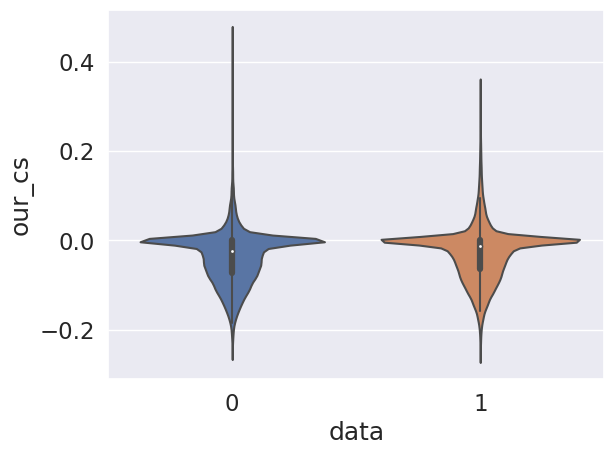

In [85]:
sb.violinplot(data=df_strain_comp, x='data', y='our_cs')

# Choose the features for the patient-based LGE+ classification

In [1202]:
# test if we remove very bad cases, are they different from the strain values?
# are they of very poor CMR quality?
# are the masks or keyframe predictions bad?
# are the motion fields or strain values strange?
df_strain_p2p['bad'] = 1
df_strain_comp['bad'] = 1
df_strain_p2p.loc[~df_strain_p2p.pat.isin(wrong_pats), 'bad'] = 0
df_strain_comp.loc[~df_strain_comp.pat.isin(wrong_pats), 'bad'] = 0
print(df_strain_p2p.bad.unique())

[1 0]


In [1203]:
df_strain_p2p = df_strain_p2p[df_strain_p2p.bad == 0]
df_strain_comp = df_strain_comp[df_strain_comp.bad == 0]
df_strain_comp.shape

(3760, 10)

In [6]:
# Pipeline with all cells for classification
@interact_manual
def choose_features(df_strain_comp=['df_strain_comp'], df_strain_p2p=['df_strain_p2p'],
                    segments=[[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16], [5,6,7,8,9,10,11,12], [4,5,10,11,12,14,15]],
                    target=['lge', 'lgeef','dmd', 'first_split'],
                    validate=True,
                    as_test=False,
                    threshold='0',
                    p2p_features=False,
                    seg_features=True,
                    use_ED=False,
                    use_MS=False,
                    use_ES=False,
                    use_PF=False,
                    use_MD=False,
                    per_patient=True,
                    p2p=True,
                    comp=False,
                    peak=False,
                    argmax=False,
                   cs=True,
                   rs=False):
    global x_train,y_train, x_test, y_test, df_peak, features, features57
    threshold = float(threshold)
    df_strain_comp = globals().get(df_strain_comp)
    df_strain_p2p = globals().get(df_strain_p2p)
    
    df_strain_comp.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
    df_strain_p2p.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
    
    # y is independent from the segments of interest
    y = (df_strain_p2p[df_strain_p2p['phase']==0].groupby('pat', sort=True)[target].sum()>threshold).values
    print('shape y == number of patients: ', len(df_strain_p2p.pat.unique()))
    print('lge pos: ', y.sum(), 'lge neg: ', (y==False).sum())
    
    # we can reduce the features by the segments of interest
    df_strain_p2p = df_strain_p2p[df_strain_p2p['aha'].isin(segments)]
    df_strain_comp = df_strain_comp[df_strain_comp['aha'].isin(segments)]
    df_strain_comp.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
    df_strain_p2p.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
    # dependent y
    y = (df_strain_p2p[df_strain_p2p['phase']==0].groupby('pat', sort=True)[target].sum()>threshold).values
    
    print('shape: p2p strain df: ',df_strain_p2p.shape)
    
    #df_peak = create_df_peak(df_strain_comp=df_strain_comp,df_strain_p2p=df_strain_p2p)
    #df_peak.sort_values(by=['pat', 'aha'], inplace=True)
    xs = []
    ps = [i for i,bool_ in enumerate([use_ED, use_MS, use_ES, use_PF, use_MD]) if bool_]
    
    if p2p_features:
        # best features so far:
        
        
        cs_phases = [1,2,3]
        cs_comp_phases = [2]
        # could be of interest: rs_phases = [1]
        xs.append(np.stack(df_strain_p2p[df_strain_p2p.phase.isin(cs_phases)].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(cs_comp_phases)].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))
        #xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(cs_comp_phases)].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
        #xs.append(np.stack(df_strain_p2p[df_strain_p2p.phase.isin(rs_phases)].groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))
        #xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(rs_phases)].groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))
        #xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_arg'].apply(list).values).astype(np.float32))
        
    elif seg_features:
        # features of the most significant segments
        #Balanced Accuracy: 0.81 (+/- 0.08)
        #Sensitivity: 0.85 (+/- 0.13)
        #Specifity: 0.76 (+/- 0.23)
        # test acc: 0.8149905123339658 test sens: 0.8235294117647058 test spec: 0.8064516129032258
        segments = [15] # best results with : [4,5,6,10,11,12]
        cs_phases = [2,3]
        
        comp_cs = df_strain_comp.phase.isin(cs_phases) & df_strain_comp.aha.isin(segments)
        k2k_cs1 = df_strain_p2p.phase.isin(cs_phases) & df_strain_p2p.aha.isin(segments)
        
        xs.append(np.stack(df_strain_comp[comp_cs].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_p2p[k2k_cs1].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))
        
        ###########################################################################33
        #Balanced Accuracy: 0.78 (+/- 0.08)
        #Sensitivity: 0.85 (+/- 0.14)
        #Specifity: 0.72 (+/- 0.20)
        # test acc: 0.8213156230234029 test sens: 0.803921568627451 test spec: 0.8387096774193549
        """segments = [5,11,12,6,4,10,16] # best results with : [4,5,6,10,11,12]
        cs_phases = [0,1,2,3,4]
        
        comp_cs = df_strain_comp.phase.isin([2]) & df_strain_comp.aha.isin(segments)
        k2k_cs1 = df_strain_p2p.phase.isin(cs_phases) & df_strain_p2p.aha.isin(segments)
        
        xs.append(np.stack(df_strain_comp[comp_cs].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_p2p[k2k_cs1].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))"""
        
        
        """segments = [4,5,6,10,11,12] # best results with : [4,5,6,10,11,12]
        cs_phases = [3]
        
        comp_cs = df_strain_comp.phase.isin([2]) & df_strain_comp.aha.isin(segments)
        k2k_cs1 = df_strain_p2p.phase.isin(cs_phases) & df_strain_p2p.aha.isin(segments)
        
        #xs.append(np.stack(df_strain_comp[comp_cs].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_p2p[k2k_cs1].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))"""
        
        """sig1 = df_strain_comp.phase.isin([3]) & df_strain_comp.aha.isin([6, 11, 12,15])
        sig2 = df_strain_comp.phase.isin([2]) & df_strain_comp.aha.isin([5])
        sig3 = df_strain_comp.phase.isin([4]) & df_strain_comp.aha.isin([6])
        sig4 = df_strain_comp.phase.isin([1]) & df_strain_comp.aha.isin([6])
        
        xs.append(np.stack(df_strain_p2p[sig1].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_p2p[sig2].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_p2p[sig3].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_p2p[sig4].groupby(['pat'], sort=True)['our_cs'].apply(list).values).astype(np.float32))"""
        
        
        """k2k_cs_segments0 = [4, 5, 10, 11]
        k2k_cs_segments1 = [4,5,10,11,14] # best results with : [4,5,6,10,11,12]
        k2k_cs_segments2 = [10,11]
        k2k_cs_segments3 = [4,5,8]
        
        k2k_cs_phases1 = [2]
        comp_segments = [4,5,10,11]
        
        comp_cs = df_strain_comp.phase.isin([2]) & df_strain_comp.aha.isin(comp_segments)
        k2k_cs0 = df_strain_p2p.phase.isin([1]) & df_strain_p2p.aha.isin(k2k_cs_segments0)
        k2k_cs1 = df_strain_p2p.phase.isin([2]) & df_strain_p2p.aha.isin(k2k_cs_segments1)
        k2k_cs2 = df_strain_p2p.phase.isin([3]) & df_strain_p2p.aha.isin(k2k_cs_segments2)
        k2k_cs3 = df_strain_p2p.phase.isin([4]) & df_strain_p2p.aha.isin(k2k_cs_segments3)
        
        xs.append(np.stack(df_strain_comp[comp_cs].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_p2p[k2k_cs0].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_p2p[k2k_cs1].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_p2p[k2k_cs2].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
        xs.append(np.stack(df_strain_p2p[k2k_cs3].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))"""
        

    else:
        if per_patient:
            if ps: # select the phases manually, if there is an entry
                print(ps)
                if p2p:
                    if cs:xs.append(np.stack(df_strain_p2p[df_strain_p2p.phase.isin(ps)].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:
                        temp = np.stack(df_strain_p2p[df_strain_p2p.phase.isin(ps)].groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32)
                        '''temp = np.array([temp[:,:6],temp[:,6:12],np.stack([temp[:,12], temp[:,13],temp[:,13], temp[:,14], temp[:,15], temp[:,15]], axis=1)])
                        temp = np.gradient(temp)[1]
                        print(temp.shape)
                        temp = np.concatenate([temp[:,0], temp[:,1], temp[:,2,0:2],temp[:,2,3:4]], axis=1)
                        print(temp.shape)
                        temp = temp.reshape(57,16)'''
                        xs.append(temp)
                    assert all(y == (df_strain_p2p[df_strain_p2p.phase.isin(ps)].groupby(['pat'])[target].sum()>threshold).values)
                if comp:
                    ps_comp = ps.copy()
                    if 0 in ps_comp: ps_comp.remove(0) # remove ED to ED strain 
                    if cs:xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(ps_comp)].groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_strain_comp[df_strain_comp.phase.isin(ps_comp)].groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))
                    assert all(y == (df_strain_comp[df_strain_p2p['phase']==0].groupby(['pat'])[target].sum()>0).values)
            else: # use the peak or use all phases
                if peak and p2p and comp and argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_arg'].apply(list).values).astype(np.float32)) 
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_arg'].apply(list).values).astype(np.float32))
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_arg'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_arg'].apply(list).values).astype(np.float32))
                elif peak and p2p and comp and not argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_p'].apply(list).values).astype(np.float32))
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_p'].apply(list).values).astype(np.float32))
                elif peak and p2p and argmax:
                    # per patient with peak values from the phases and argmax
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_arg'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_arg'].apply(list).values).astype(np.float32))
                elif peak and p2p and not argmax:
                    print('use p2p peak by phase')
                    # per patient with peak values from the phases and argmax
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_p2p_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_p2p_p'].apply(list).values).astype(np.float32))
                elif peak and comp and argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_arg'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_arg'].apply(list).values).astype(np.float32))
                elif peak and comp and not argmax:
                    if cs:xs.append(np.stack(df_peak.groupby(['pat'])['pcs_com_p'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_peak.groupby(['pat'])['prs_com_p'].apply(list).values).astype(np.float32))
                elif not peak and comp:
                    if cs:xs.append(np.stack(df_strain_comp.groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_strain_comp.groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))
                elif not peak and p2p:
                    if cs:xs.append(np.stack(df_strain_p2p.groupby(['pat'])['our_cs'].apply(list).values).astype(np.float32))
                    if rs:xs.append(np.stack(df_strain_p2p.groupby(['pat'])['our_rs'].apply(list).values).astype(np.float32))

        else: # per segment classification
            y = np.stack(df_strain_comp.groupby(['pat','aha'])[target].apply(list).values).astype(np.float32)
            y = y.sum(axis=1)>0
            if p2p:
                if cs: xs.append(np.stack(df_strain_p2p.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32))
                if rs: xs.append(np.stack(df_strain_p2p.groupby(['pat','aha'])['our_rs'].apply(list).values).astype(np.float32))
            if comp:
                if cs: xs.append(np.stack(df_strain_comp.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32))
                if rs: xs.append(np.stack(df_strain_comp.groupby(['pat','aha'])['our_rs'].apply(list).values).astype(np.float32))
    x = np.concatenate(xs, axis=1)
    print('shape x:', x.shape)
    print('shape y:', y.shape)
    # this does not generalise well from DMD57 to DMD81
    from sklearn.svm import LinearSVC, SVC
    from sklearn.feature_selection import RFECV
    #model = LogisticRegression(random_state=1, class_weight='balanced', max_iter=1000)
    model = LinearSVC(class_weight='balanced', C=100)
    """rfe = RFECV(model, min_features_to_select=30)
    fit = rfe.fit(x, y)
    features57 = fit.support_
    x = x[:,features57]"""
    """model.fit(x, y)
    fe = SelectFromModel(model, prefit=True,max_features=20)
    x = fe.transform(x)"""
    #y = fe.transform(y)
    #print('features: {}'.format(features57))
    print('new shape: {}'.format(x.shape))
    
    # plot the selected features and split them by the target
    temp = pd.DataFrame(np.concatenate([x,y[:,None]], axis=1))
    temp.rename(columns={temp.columns[-1]:'target'}, inplace=True)
    df_long = pd.melt(temp, "target", var_name="segments", value_name="c")
    g = sb.factorplot("segments", hue="target", y="c", data=df_long, kind="violin", aspect=3)
    g._legend.remove()
    plt.show()

    if as_test:
        x_test = x
        y_test = y
    else:
        
        x_train = x
        y_train = y
    #features = fit.support_
        
    if validate: cross_validate_f1(x,y)

interactive(children=(Dropdown(description='df_strain_comp', options=('df_strain_comp',), value='df_strain_com…

# Gridsearch with the features from the previous cell

len train: 563
len test: 141
len train: 563
len test: 141
shape train: (563, 192)


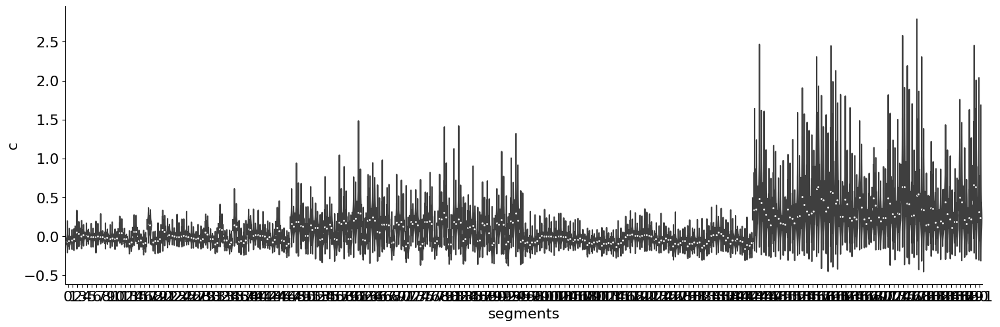

In [35]:
random_split = True
train57 = True
# split the data further into train/test
# use the train split in a CV grid search to find the optimal parameters
# Use the refit function of the gs instance to than predict the labels of the test split
if random_split:
    from sklearn.model_selection import train_test_split
    x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=0.20, random_state=42, stratify=y_train)
else:
    # split by dataset
    cohorts = (df_strain_p2p[df_strain_p2p['phase']==0].groupby('pat')['first_split'].sum()>0).values
    if train57:
        x_test, y_test = x_train[~cohorts], y_train[~cohorts]
        x_train, y_train = x_train[cohorts], y_train[cohorts]
    else:
        x_test, y_test = x_train[cohorts], y_train[cohorts]
        x_train, y_train = x_train[~cohorts], y_train[~cohorts]

print('len train:',len(x_train))
print('len test:', len(x_test))

# add n patients from test to train
if 0:
    n_pats = 15
    x_train = np.concatenate([x_train, x_test[:n_pats]])
    y_train = np.concatenate([y_train, y_test[:n_pats]])
    x_test = x_test[n_pats:]
    y_test = y_test[n_pats:]

print('len train:',len(x_train))
print('len test:', len(x_test))

# feature selection based on the train split
from sklearn.svm import LinearSVC, SVC
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel
#model = LogisticRegression(random_state=1, class_weight='balanced', max_iter=1000)
model = LinearSVC(class_weight='balanced', C=100)
"""model.fit(x_train, y_train)
fe = SelectFromModel(model, prefit=True,max_features=20)
x_train = fe.transform(x_train)
x_test = fe.transform(x_test)"""
"""rfe = RFECV(model, min_features_to_select=20)
fit = rfe.fit(x_train, y_train)
features57 = fit.support_
x_train = x_train[:,features57]
x_test = x_test[:,features57]"""
print('shape train:',x_train.shape)

#temp = pd.DataFrame(np.concatenate([np.concatenate([x_train, x_test],axis=0),groupby[:,None]], axis=1))
temp = pd.DataFrame(np.concatenate([x_train,y_train[:,None]], axis=1))
temp.rename(columns={temp.columns[-1]:'target'}, inplace=True)
df_long = pd.melt(temp, "target", var_name="segments", value_name="c")
g = sb.factorplot("segments", hue="target", y="c", data=df_long, kind="violin", aspect=3)
g._legend.remove()
plt.show()

In [36]:
gs = create_grid_search(cv=5) # refit='f1'
print(x_train.shape)
gs = gs.fit(x_train, y_train)

# create a df from the gs results
results = pd.DataFrame.from_dict(gs.cv_results_)
results["params_str"] = results.params.apply(str)
pd.set_option('display.max_colwidth', None)
results.shape

(563, 192)


(2063, 75)

In [37]:
# sort by balanced acc
results.sort_values(by=['rank_test_balanced_accuracy','rank_test_recall','rank_test_f1'])[['mean_test_balanced_accuracy','mean_test_sens','mean_test_spec','mean_test_roc_auc', 'params_str']].head(5)

,mean_test_balanced_accuracy,mean_test_sens,mean_test_spec,mean_test_roc_auc,params_str
303,0.676920,0.666667,0.687173,0.676920,"{'clf': SVC(C=1, class_weight='balanced', degree=2, gamma=0.01, kernel='sigmoid'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__degree': 2, 'clf__gamma': 0.01, 'clf__kernel': 'sigmoid', 'scaler': None}"
339,0.676920,0.666667,0.687173,0.676920,"{'clf': SVC(C=1, class_weight='balanced', degree=2, gamma=0.01, kernel='sigmoid'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__degree': 3, 'clf__gamma': 0.01, 'clf__kernel': 'sigmoid', 'scaler': None}"
375,0.676920,0.666667,0.687173,0.676920,"{'clf': SVC(C=1, class_weight='balanced', degree=2, gamma=0.01, kernel='sigmoid'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__degree': 4, 'clf__gamma': 0.01, 'clf__kernel': 'sigmoid', 'scaler': None}"
411,0.676920,0.666667,0.687173,0.676920,"{'clf': SVC(C=1, class_weight='balanced', degree=2, gamma=0.01, kernel='sigmoid'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 0.01, 'clf__kernel': 'sigmoid', 'scaler': None}"
2062,0.675533,0.511111,0.839955,0.675533,"{'clf': GaussianNB(), 'scaler': None}"


In [10]:
# sort by sens
results.sort_values(by=['rank_test_sens','rank_test_balanced_accuracy','rank_test_recall'])[['mean_test_balanced_accuracy','mean_test_sens','mean_test_spec','mean_test_roc_auc', 'params_str']].head(5)

,mean_test_balanced_accuracy,mean_test_sens,mean_test_spec,mean_test_roc_auc,params_str
589,0.498013,0.950000,0.046026,0.498013,"{'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 5, 'clf__class_weight': 'balanced', 'clf__degree': 2, 'clf__gamma': 0.01, 'clf__kernel': 'poly', 'scaler': None}"
1201,0.490321,0.950000,0.030641,0.490321,"{'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 20, 'clf__class_weight': 'balanced', 'clf__degree': 3, 'clf__gamma': 0.01, 'clf__kernel': 'poly', 'scaler': None}"
1849,0.541923,0.933333,0.150513,0.541923,"{'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 1000.0, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 0.01, 'clf__kernel': 'poly', 'scaler': None}"
1193,0.477308,0.883333,0.071282,0.477308,"{'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 20, 'clf__class_weight': 'balanced', 'clf__degree': 2, 'clf__gamma': 'auto', 'clf__kernel': 'poly', 'scaler': None}"
905,0.525000,0.850000,0.200000,0.525000,"{'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 10, 'clf__class_weight': 'balanced', 'clf__degree': 2, 'clf__gamma': 'auto', 'clf__kernel': 'poly', 'scaler': None}"


In [11]:
# sort by f1
results.sort_values(by=['rank_test_f1','rank_test_balanced_accuracy','rank_test_recall'])[['mean_test_balanced_accuracy','mean_test_sens','mean_test_spec','mean_test_roc_auc', 'params_str']].head(5)

,mean_test_balanced_accuracy,mean_test_sens,mean_test_spec,mean_test_roc_auc,params_str
721,0.594808,0.383333,0.806282,0.594808,"{'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 5, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"
1009,0.576795,0.316667,0.836923,0.576795,"{'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 10, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}"
614,0.561026,0.183333,0.938718,0.561026,"{'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 5, 'clf__class_weight': 'balanced', 'clf__degree': 2, 'clf__gamma': 'scale', 'clf__kernel': 'rbf', 'scaler': None}"
650,0.561026,0.183333,0.938718,0.561026,"{'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 5, 'clf__class_weight': 'balanced', 'clf__degree': 3, 'clf__gamma': 'scale', 'clf__kernel': 'rbf', 'scaler': None}"
686,0.561026,0.183333,0.938718,0.561026,"{'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 5, 'clf__class_weight': 'balanced', 'clf__degree': 4, 'clf__gamma': 'scale', 'clf__kernel': 'rbf', 'scaler': None}"


## Evaluate the best estimator from gridsearch CV

**Recall** in this context is also referred to as the true positive rate or sensitivity, and 

$\frac{tp}{tp+fn}$ 



**Precision** is also referred to as positive predictive value (PPV); other related measures used in classification include true negative rate and accuracy. True negative rate is also called specificity.

$\frac{tp}{tp+fp)}$



**Accuracy** (maybe missleading for imbalanced data, better --> balanced accuracy)

$\frac{tp+tn}{tp+tn+fp+fn}$



Balanced Accuracy: 0.59 (+/- 0.14)
F1: 0.21 (+/- 0.14)
Sensitivity: 0.38 (+/- 0.26)
Specifity: 0.81 (+/- 0.05)
params: {'clf': SVC(C=5, class_weight='balanced', degree=5, kernel='poly'), 'clf__C': 5, 'clf__class_weight': 'balanced', 'clf__degree': 5, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}
Recall: 0.38 (+/- 0.26)
Accuracy: 0.77 (+/- 0.06)
Precision: 0.15 (+/- 0.10)
AUC: 0.59 (+/- 0.14)


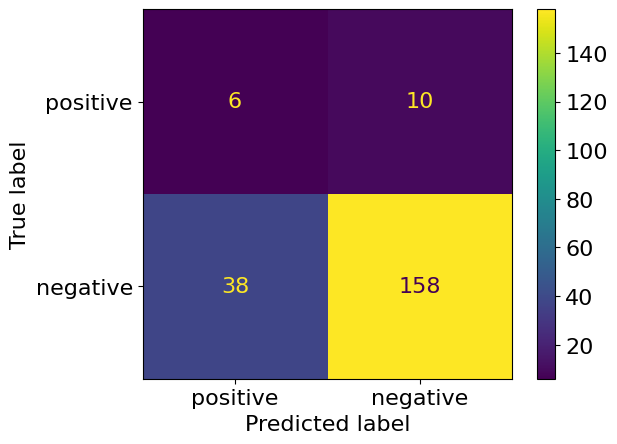

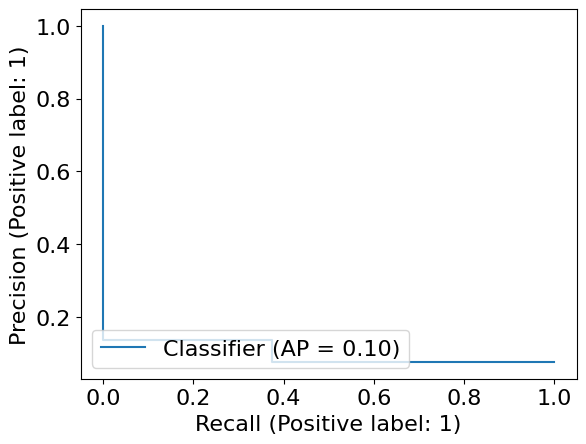

In [12]:
# use the parameters of the best classifier from the gridsearch and refit on data in CV manner 
import copy
# we should not change the gs instance
hits, y_pred = plot_report(copy.deepcopy(gs.best_estimator_), x_train, y_train, label=gs.best_params_,cv=5)
plt.show()

In [47]:
pats =(df_strain_p2p[df_strain_p2p.first_split==1]).sort_values(['pat'])['pat'].unique()
#pats =(df_strain_p2p).sort_values(['pat'])['pat'].unique()
wrong_pats = pats[~hits]
wrong_pats

array(['ao_20191212', 'ej_20191126', 'gm_20190604', 'gn_20190712',
       'hj_20190206', 'hs_20180427', 'jr_20181010', 'lv_20190503',
       'ms_20191028', 'wr_20170905'], dtype=object)

In [49]:
# how many of the dmd57 patients are wrong predicted and part of the pLVEF group, this group is LGE+, if they are also in the list of wrong predicted, it is a FN case
[p for p in rLVEF if p in wrong_pats]

[]

In [217]:
# show all wrong predicted patients and their number of positive segments followed by a binary list showing the positive/negative segments
print(df_strain_p2p[(df_strain_p2p.pat.isin(wrong_pats)) & (df_strain_p2p.phase==0)].groupby('pat')['lge'].sum())
df_strain_p2p[(df_strain_p2p.pat.isin(wrong_pats)) & (df_strain_p2p.phase==0)].groupby('pat')['lge'].apply(list)

pat
aa_20180710    0
ac_20181203    2
ao_20191212    4
ck_20180608    0
cm_20180201    0
gn_20190712    2
hj_20190206    0
ht_20191007    0
pt_20180706    7
rg_20180919    4
wr_20170905    6
Name: lge, dtype: int64


pat
aa_20180710    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
ac_20181203    [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
ao_20191212    [0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0]
ck_20180608    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
cm_20180201    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
gn_20190712    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0]
hj_20190206    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
ht_20191007    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
pt_20180706    [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1]
rg_20180919    [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]
wr_20170905    [0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]
Name: lge, dtype: object

In [56]:
df_strain_comp.sort_values(by=['pat', 'aha', 'phase'], inplace=True)
df_strain_p2p.sort_values(by=['pat', 'aha', 'phase'], inplace=True)

(df_strain_p2p.groupby('pat')['lge'].sum()>2).values

array([False, False, False, False, False, False, False, False,  True,
        True, False, False,  True,  True,  True, False,  True, False,
        True, False,  True, False,  True,  True, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False,  True,  True, False, False,  True, False,  True,
        True,  True, False,  True,  True,  True, False, False, False,
        True, False, False,  True, False,  True,  True, False,  True,
        True, False,  True, False,  True, False, False,  True,  True,
        True, False, False, False, False,  True,  True, False, False,
        True, False, False,  True,  True, False,  True, False,  True,
        True, False, False,  True, False, False, False,  True,  True,
       False,  True, False,  True,  True,  True, False,  True, False,
       False,  True,  True,  True, False, False,  True,  True,  True,
       False, False,  True,  True, False, False, False,  True, False,
       False, False,

In [14]:
sklearn.metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'top_k_accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_wei

# Violinplots of RS/CS per patient - hue=LGE+/LGE-

# Derive how significant are lge positive segments vs lge negative segments

In [439]:
df_strain_p2p

,pat,aha,phase,our_rs,our_cs,soa,lge,lgeef,first_split,dmd
0,aa_20180710,1,0,-0.042830,0.009714,0,0,0,1,1
1,aa_20180710,1,1,0.609311,-0.052598,0,0,0,1,1
2,aa_20180710,1,2,0.337325,-0.014390,0,0,0,1,1
3,aa_20180710,1,3,0.165638,0.085258,0,0,0,1,1
4,aa_20180710,1,4,0.185202,0.157370,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...
11115,zs_20200225,16,0,-0.025489,0.007843,0,0,0,0,1
11116,zs_20200225,16,1,0.178843,-0.049134,0,0,0,0,1
11117,zs_20200225,16,2,0.127998,-0.077885,0,0,0,0,1
11118,zs_20200225,16,3,0.083130,0.169348,0,0,0,0,1


In [33]:
# get only the values of segment a, should be 139 x 5 = 695
strain = 'our_rs'
target_col = 'lge'
temp_sig = df_strain_p2p.copy()
res = []
groups_a = []
groups_b = []
alpha0 = 0.05
for a in range(1,17):
    for k in [0,1,2,3,4]:
        #print(df_strain_p2p.shape)
        temp = temp_sig[temp_sig.aha==a]
        temp = temp[temp.phase==k]
        if len(temp)>0:
            #print(temp.shape)
            pos = temp[target_col]>0
            #print(pos.sum())
            group_a = temp[pos>0][strain]
            group_b = temp[pos==0][strain]
            #print(group_a.shape, group_b.shape)
            import pingouin as pg

            if len(group_a)>1 and len(group_b)>1:
                ttest = pg.ttest(group_a, group_b, paired=False)
                ttest['aha'] = a
                ttest['phase'] = k
                ttest['mean-diff'] = np.abs(np.mean(group_a)- np.mean(group_b))*100
                res.append(ttest)
                groups_a.append(group_a)
                groups_b.append(group_b)
ttests = pd.concat(res)
print(ttests.shape)
msk_ss, pvals_corr = pg.multicomp(pvals=ttests['p-val'].to_numpy(), alpha=alpha0, method='holm')
ttests['p-val-adjusted'] = pvals_corr
ttests['p-val-adjusted'] = ttests['p-val-adjusted'].apply(lambda x: round(x, 3))

ttests[msk_ss][['aha', 'phase', 'mean-diff', 'p-val-adjusted']].sort_values('p-val-adjusted')

(80, 11)


,aha,phase,mean-diff,p-val-adjusted
T-test,15,2,10.279672,0.004
T-test,2,2,9.455397,0.032


In [90]:
ttest.shape

(1, 11)

% k2k RS
%  	T 	dof 	alternative 	p-val 	CI95% 	cohen-d 	BF10 	power 	aha 	phase 	mean-diff
% T-test 	-5.662902 	7.773122 	two-sided 	0.000526 	[-0.14, -0.06] 	0.929792 	7.915e+04 	0.526765 	1 	2 	9.652637
% T-test 	-4.446989 	131.186523 	two-sided 	0.000018 	[-0.15, -0.06] 	0.755471 	1010.425 	0.993090 	5 	1 	10.106529
% T-test 	-3.572627 	127.971828 	two-sided 	0.000499 	[-0.14, -0.04] 	0.607174 	52.476 	0.944530 	5 	2 	8.764328
% T-test 	-3.692320 	134.339592 	two-sided 	0.000322 	[-0.11, -0.03] 	0.626947 	76.18 	0.956340 	11 	1 	7.329487
% T-test 	-3.822504 	134.688487 	two-sided 	0.000201 	[-0.15, -0.05] 	0.649006 	115.635 	0.967029 	11 	2 	9.774424
% T-test 	-3.991129 	90.823480 	two-sided 	0.000133 	[-0.15, -0.05] 	0.725544 	203.261 	0.981172 	12 	2 	9.784470

% k2k CS
%  	T 	dof 	alternative 	p-val 	CI95% 	cohen-d 	BF10 	power 	aha 	phase 	mean-diff
% T-test 	-5.143935 	9.946889 	two-sided 	4.427021e-04 	[-0.05, -0.02] 	0.741637 	9360.37 	0.365926 	1 	4 	3.314405
% T-test 	4.345299 	135.388706 	two-sided 	2.709552e-05 	[0.01, 0.03] 	0.736487 	697.185 	0.990634 	5 	2 	1.725120
% T-test 	-4.235912 	136.997067 	two-sided 	4.152008e-05 	[-0.04, -0.01] 	0.718490 	471.338 	0.987632 	5 	4 	2.541630
% T-test 	4.140833 	96.494689 	two-sided 	7.414457e-05 	[0.01, 0.02] 	0.740951 	338.712 	0.985523 	6 	1 	1.634424
% T-test 	4.558569 	121.691775 	two-sided 	1.235357e-05 	[0.01, 0.03] 	0.749332 	1528.187 	0.987159 	6 	2 	1.803059
% T-test 	-4.158289 	96.791532 	two-sided 	6.935438e-05 	[-0.04, -0.02] 	0.743286 	359.875 	0.985996 	6 	3 	3.016345
% T-test 	-4.581478 	109.355475 	two-sided 	1.230880e-05 	[-0.04, -0.01] 	0.784670 	1665.349 	0.992422 	6 	4 	2.611438
% T-test 	4.184234 	135.864671 	two-sided 	5.106112e-05 	[0.01, 0.03] 	0.709278 	392.855 	0.985795 	11 	1 	1.967816
% T-test 	4.647447 	136.517897 	two-sided 	7.829781e-06 	[0.01, 0.02] 	0.787981 	2141.637 	0.996002 	11 	2 	1.617718
% T-test 	-8.724076 	136.292626 	two-sided 	8.326011e-15 	[-0.08, -0.05] 	1.479044 	6.357e+11 	1.000000 	11 	3 	6.117555
% T-test 	-3.934487 	133.427881 	two-sided 	1.334917e-04 	[-0.03, -0.01] 	0.668177 	167.201 	0.974473 	11 	4 	1.949871
% T-test 	3.730097 	89.156673 	two-sided 	3.360894e-04 	[0.01, 0.02] 	0.682631 	86.632 	0.967096 	12 	1 	1.308205
% T-test 	5.259888 	112.305015 	two-sided 	6.968045e-07 	[0.01, 0.02] 	0.885558 	2.456e+04 	0.998507 	12 	2 	1.788330
% T-test 	-6.162756 	85.076133 	two-sided 	2.300886e-08 	[-0.06, -0.03] 	1.147219 	1.313e+06 	1.000000 	12 	3 	4.329839
% T-test 	-4.218692 	46.779069 	two-sided 	1.117996e-04 	[-0.06, -0.02] 	0.778301 	439.673 	0.944426 	15 	3 	4.129725
% T-test 	3.619290 	48.893719 	two-sided 	6.996103e-04 	[0.01, 0.03] 	0.734096 	62.282 	0.947109 	16 	2 	1.658847

% comp RS
%  	T 	dof 	alternative 	p-val 	CI95% 	cohen-d 	BF10 	power 	aha 	phase 	mean-diff
% T-test 	-4.276758 	127.845332 	two-sided 	0.000037 	[-0.19, -0.07] 	0.726853 	545.016 	0.989117 	5 	1 	13.308084
% T-test 	-3.614486 	134.091128 	two-sided 	0.000425 	[-0.15, -0.04] 	0.613760 	59.711 	0.948716 	11 	1 	9.674435

% comp CS
%  	T 	dof 	alternative 	p-val 	CI95% 	cohen-d 	BF10 	power 	aha 	phase 	mean-diff
% T-test 	3.793348 	136.168344 	two-sided 	2.227038e-04 	[0.01, 0.03] 	0.643809 	105.204 	0.964728 	5 	1 	1.809591
% T-test 	5.138640 	136.854218 	two-sided 	9.347723e-07 	[0.02, 0.04] 	0.871433 	1.5e+04 	0.999157 	5 	2 	2.822820
% T-test 	4.225856 	94.995246 	two-sided 	5.465979e-05 	[0.01, 0.03] 	0.760270 	455.918 	0.989052 	6 	1 	1.904114
% T-test 	4.276932 	86.031224 	two-sided 	4.888219e-05 	[0.01, 0.04] 	0.796521 	546.315 	0.993700 	6 	2 	2.410151
% T-test 	3.721711 	111.109575 	two-sided 	3.122576e-04 	[0.01, 0.02] 	0.633753 	84.296 	0.943472 	6 	3 	1.447136
% T-test 	4.383925 	130.489865 	two-sided 	2.376469e-05 	[0.01, 0.03] 	0.742420 	802.071 	0.991473 	11 	1 	2.044953
% T-test 	5.986258 	134.481533 	two-sided 	1.842859e-08 	[0.02, 0.04] 	1.014410 	5.93e+05 	1.000000 	11 	2 	3.298872
% T-test 	3.498486 	87.526432 	two-sided 	7.378666e-04 	[0.01, 0.02] 	0.644538 	42.378 	0.948207 	12 	1 	1.452317
% T-test 	5.225903 	88.190220 	two-sided 	1.149345e-06 	[0.02, 0.03] 	0.960150 	2.133e+04 	0.999643 	12 	2 	2.440692
% T-test 	3.759481 	37.407640 	two-sided 	5.814024e-04 	[0.01, 0.04] 	0.969778 	96.274 	0.997162 	16 	2 	2.477491

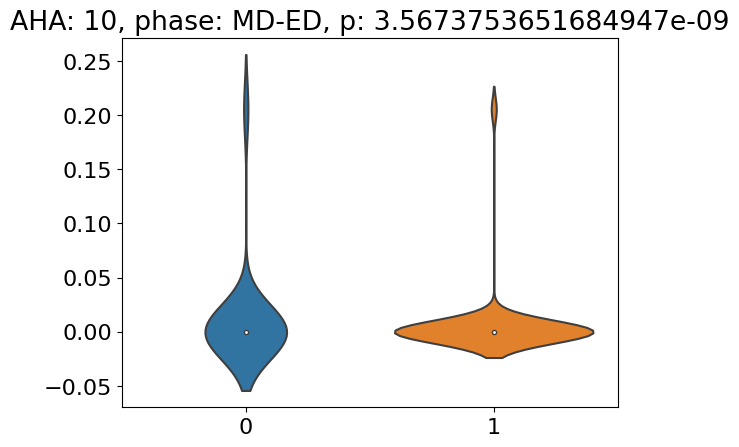

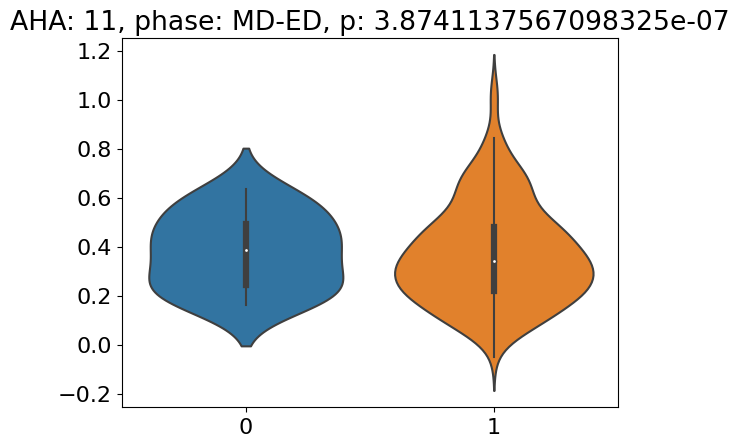

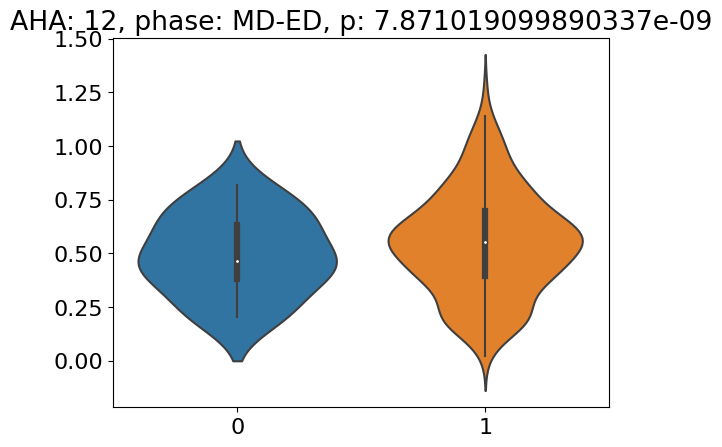

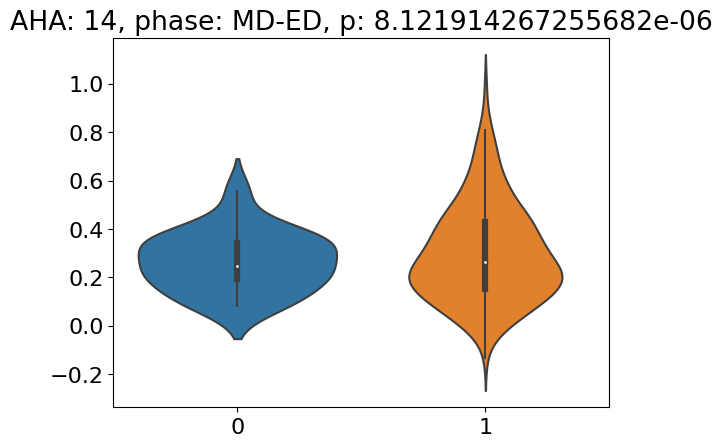

In [12]:
# plot the violinplots split on a segment basis
phases_ = ['MD-ED', 'ED-MS', 'MS-ES', 'ES-PF','PF-MD']
for (idx,row), a,b in zip(ttests[msk_ss].iterrows(), groups_a,groups_b):
    ax = sb.violinplot(data=[a,b], )
    ax.set_title('AHA: {}, phase: {}, p: {}'.format(row['aha'],phases_[row['phase']], row['p-val']))
    plt.show()

all input arrays must have the same shape


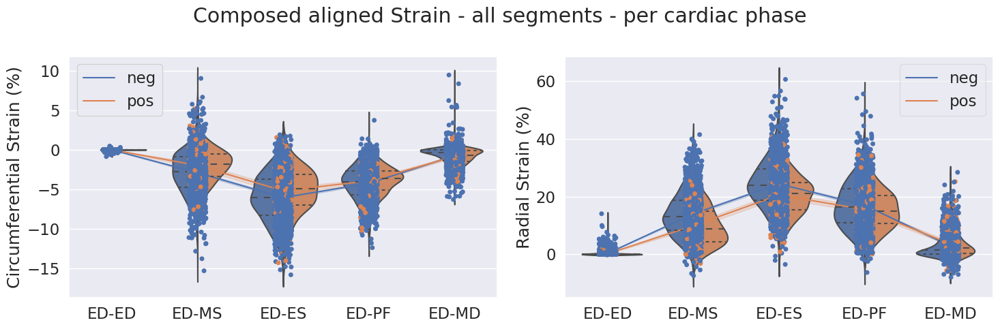

all input arrays must have the same shape


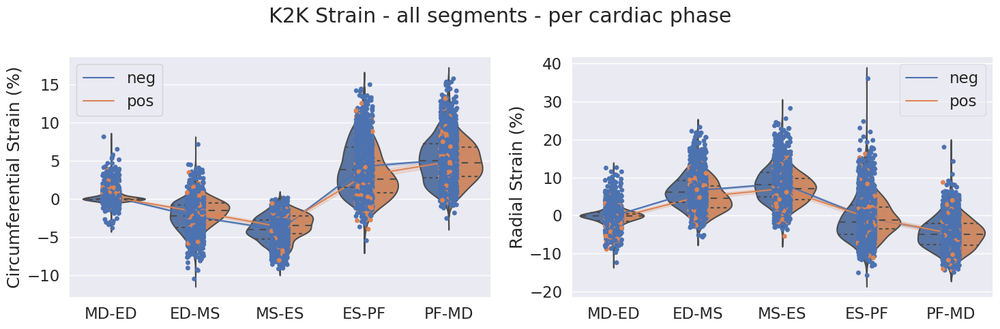

In [127]:
# compare control with LGE+ and with LGE-
target = 'lge' # lge, lgeef, dmd, first_split
pos = 1
sig_niv = 0.05
_ = plot_strain_per_time(df_strain_comp[((df_strain_comp['lge'] == pos) |  (df_strain_comp[target] == 0))],title='Composed aligned Strain - all segments - per cardiac phase',method='comp', hue=target, sig_niv=sig_niv); plt.show()
_ = plot_strain_per_time(df_strain_p2p[((df_strain_p2p['lge'] == pos) |  (df_strain_p2p[target] == 0))], title='K2K Strain - all segments - per cardiac phase',method='p2p', hue=target, sig_niv=sig_niv);plt.show()

## Violinplot of dmd57

(16, 10)


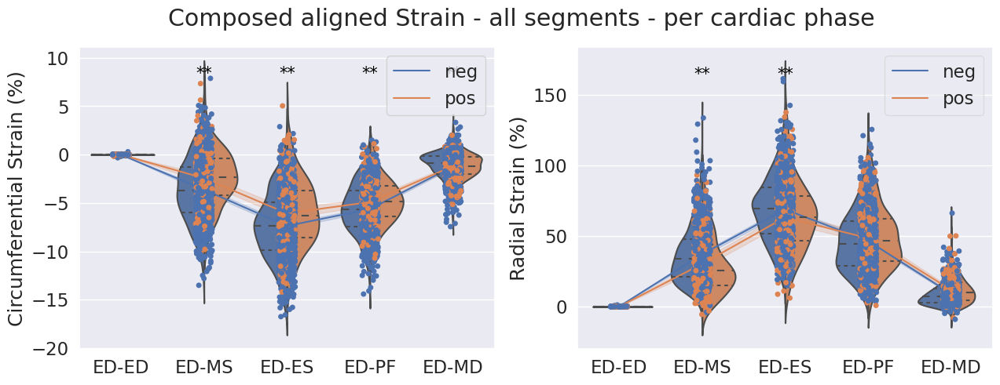

****************************************
RS strain in phase: ED-ED - significant AHA segments: [6], p-values: [0.04553]
aha  lge
6    0      0.012987
     1      0.011435
Name: our_rs, dtype: float64


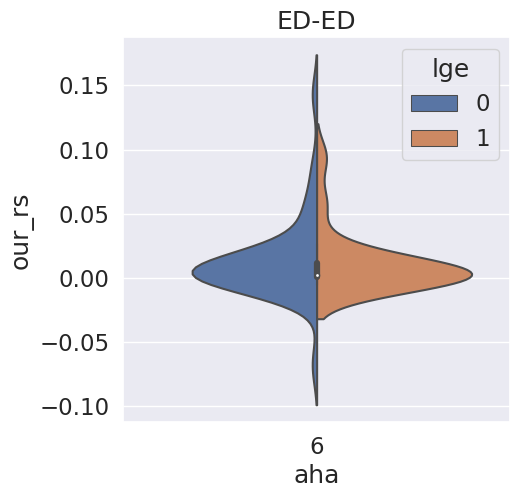

****************************************
CS strain in phase: ED-MS - significant AHA segments: [5], p-values: [0.02054]
aha  lge
5    0     -3.804375
     1     -1.887737
Name: our_cs, dtype: float64


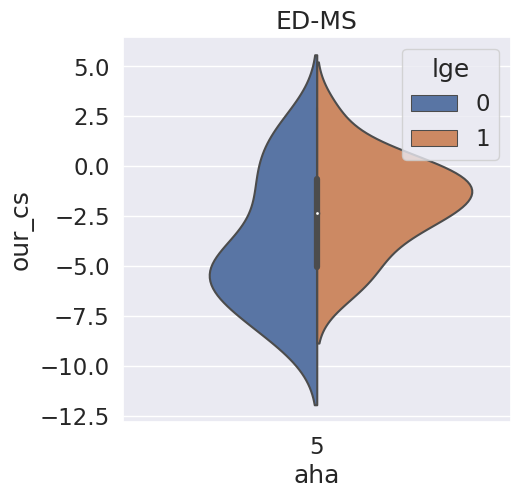

****************************************
CS strain in phase: ED-ES - significant AHA segments: [10], p-values: [0.017490000000000002]
aha  lge
10   0     -5.779257
     1     -4.174406
Name: our_cs, dtype: float64


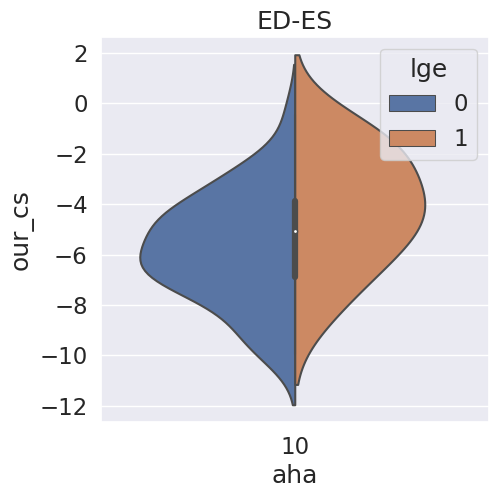

****************************************
CS strain in phase: ED-MD - significant AHA segments: [1], p-values: [0.011199999999999998]
aha  lge
1    0     -1.137814
     1     -1.296168
Name: our_cs, dtype: float64


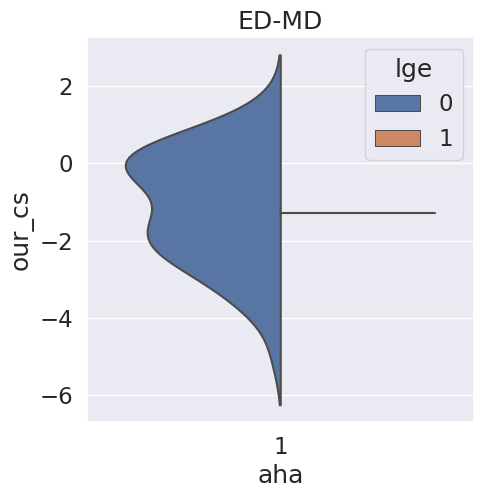

<Figure size 640x480 with 0 Axes>

(16, 10)


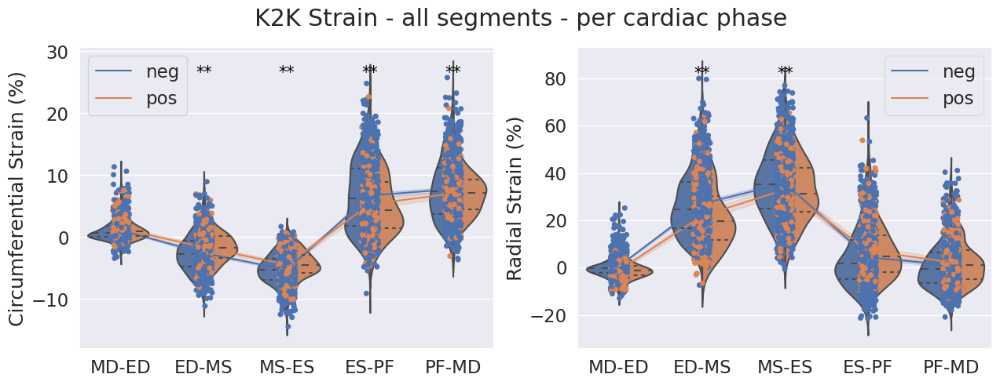

****************************************
CS strain in phase: ED-MS - significant AHA segments: [5], p-values: [0.031400000000000004]
aha  lge
5    0     -2.782282
     1     -1.373370
Name: our_cs, dtype: float64


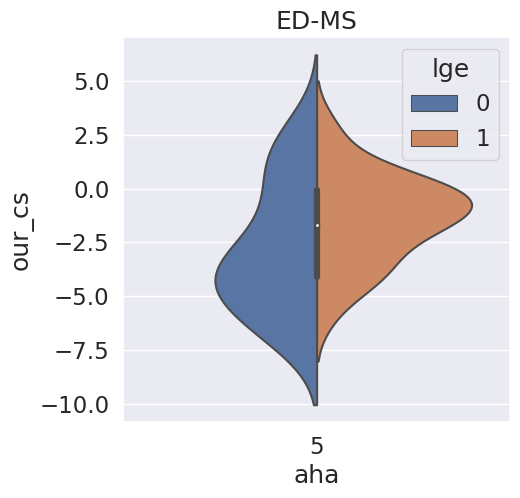

****************************************
CS strain in phase: ES-PF - significant AHA segments: [5, 10, 11, 14], p-values: [0.04649999999999999, 0.0, 0.0, 0.04212]
aha  lge
5    0      7.414523
     1      4.867074
10   0      4.940186
     1      2.607876
11   0      8.166547
     1      1.562078
14   0      2.283016
     1      1.110700
Name: our_cs, dtype: float64


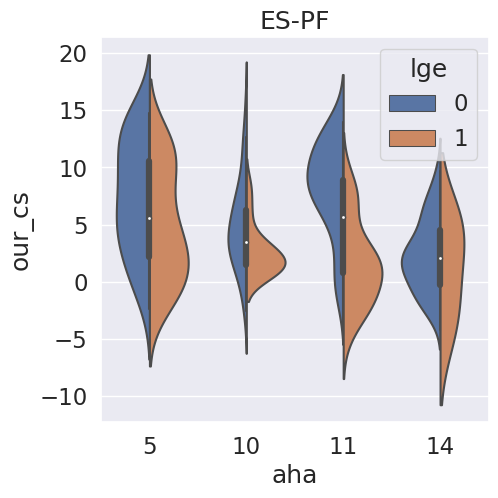

****************************************
CS strain in phase: PF-MD - significant AHA segments: [5], p-values: [0.01896]
aha  lge
5    0      11.061090
     1       8.631755
Name: our_cs, dtype: float64


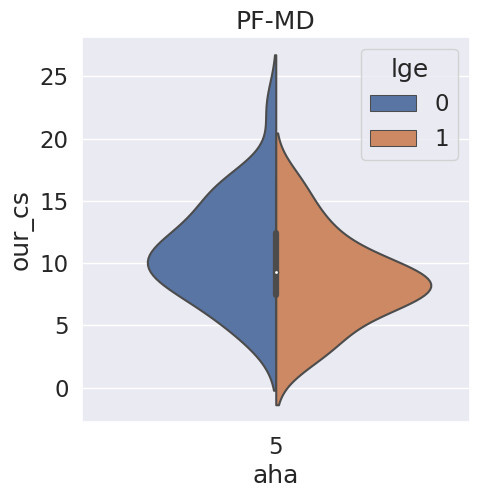

<Figure size 640x480 with 0 Axes>

In [755]:
# show significant differences between the first and the second split
# use only the dmd57 for significance measurement
target = 'lge' # lge, lgeef, dmd, first_split
sig_niv = 0.05
_ = plot_strain_per_time(df_strain_comp[df_strain_comp['first_split']==1],title='Composed aligned Strain - all segments - per cardiac phase',method='comp', hue=target, sig_niv=sig_niv); plt.show()
_ = plot_strain_per_time(df_strain_p2p[df_strain_p2p['first_split']==1], title='K2K Strain - all segments - per cardiac phase',method='p2p', hue=target, sig_niv=sig_niv);plt.show()

## Violinplot of dmd82

In [94]:
# show significant differences between the first and the second split
# use only the dmd57 for significance measurement
target = 'outcome' # lge, lgeef, dmd, first_split
sig_niv = 0.05
_ = plot_strain_per_time(df_strain_comp[df_strain_comp['first_split']==0],title='Composed aligned Strain - all segments - per cardiac phase',method='comp', hue=target, sig_niv=sig_niv); plt.show()
_ = plot_strain_per_time(df_strain_p2p[df_strain_p2p['first_split']==0], title='K2K Strain - all segments - per cardiac phase',method='p2p', hue=target, sig_niv=sig_niv);plt.show()

KeyError: 'first_split'

## Violinplot dmd57 & dmd82

(16, 10)


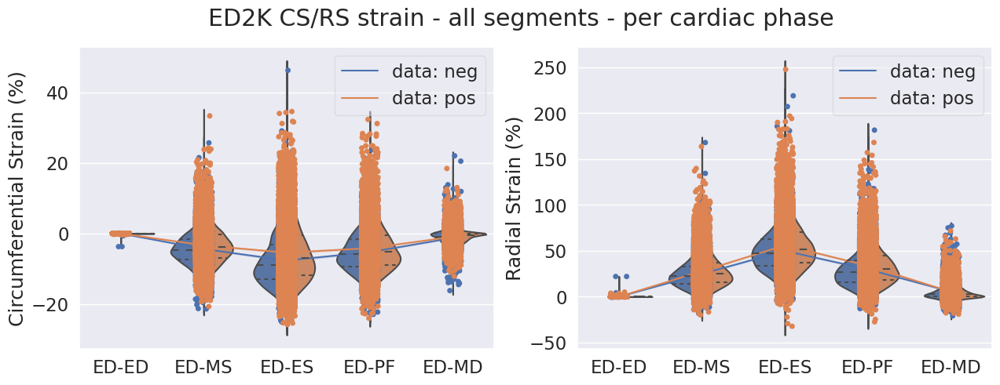

****************************************
RS strain in phase: ED-MS - significant AHA segments: [6, 9, 10, 11, 15], p-values: [0.0341, 0.0341, 0.04494, 0.0, 0.0048000000000000004]
aha  data
6    0       32.225400
     1       37.121029
9    0       25.508356
     1       26.047485
10   0       23.356942
     1       27.391128
11   0       26.904188
     1       31.334995
15   0       21.974473
     1       22.753913
Name: our_rs, dtype: float64


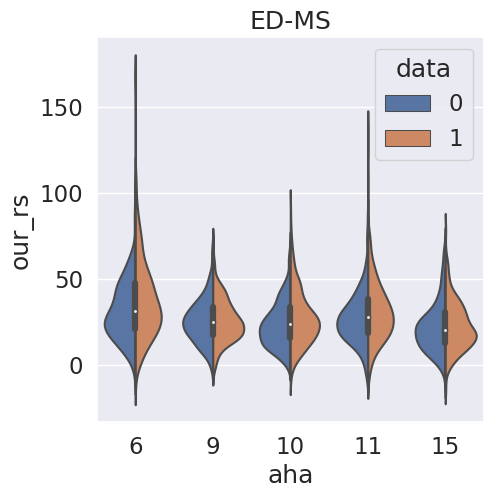

****************************************
RS strain in phase: ED-ES - significant AHA segments: [1, 3, 4, 5, 9, 10, 11, 15], p-values: [0.00127, 0.0, 0.018240000000000003, 0.00127, 0.0, 0.0, 0.0, 0.015079999999999998]
aha  data
1    0       47.642683
     1       53.098197
3    0       36.358473
     1       36.864594
4    0       49.585309
     1       58.550004
5    0       59.974494
     1       68.352026
9    0       51.242999
     1       51.349500
10   0       47.122428
     1       56.267345
11   0       58.947531
     1       71.678689
15   0       54.092539
     1       57.889112
Name: our_rs, dtype: float64


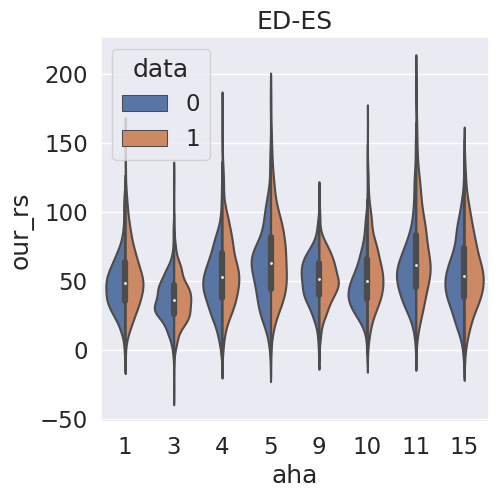

****************************************
RS strain in phase: ED-PF - significant AHA segments: [0, 5, 6, 9, 11], p-values: [0.012870000000000001, 0.02576, 0.0, 0.010620000000000001, 0.0]
aha  data
5    0       46.876673
     1       48.855576
6    0       41.169777
     1       48.057251
9    0       25.425155
     1       27.201703
11   0       38.557972
     1       44.582546
Name: our_rs, dtype: float64


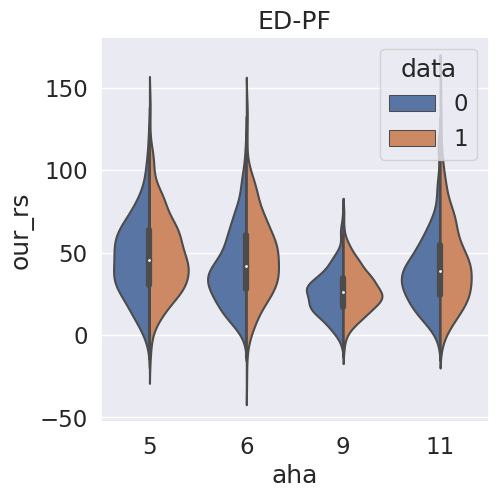

****************************************
RS strain in phase: ED-MD - significant AHA segments: [1, 2], p-values: [0.0, 0.0]
aha  data
1    0       6.264100
     1       4.913656
2    0       4.244632
     1       1.895558
Name: our_rs, dtype: float64


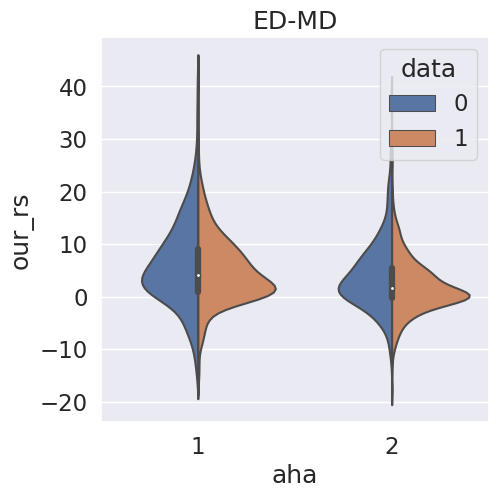

****************************************
CS strain in phase: ED-MS - significant AHA segments: [1, 2, 3, 7, 8, 13], p-values: [0.0, 0.0, 0.02576, 0.0, 0.0, 0.0]
aha  data
1    0      -8.543401
     1      -7.799472
2    0      -2.779273
     1       0.188342
3    0      -2.498478
     1       0.302798
7    0      -8.927184
     1      -9.072198
8    0      -1.978273
     1       1.127714
13   0      -7.301565
     1      -7.320512
Name: our_cs, dtype: float64


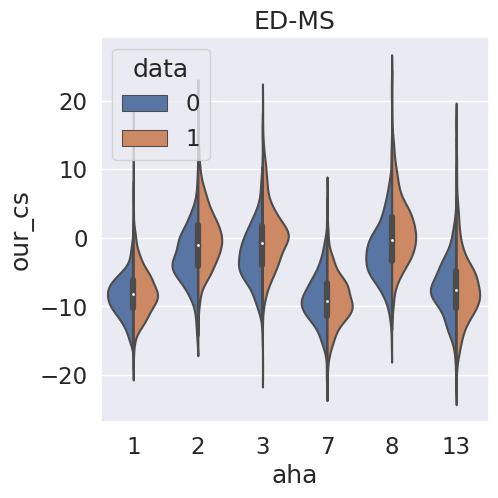

****************************************
CS strain in phase: ED-ES - significant AHA segments: [0, 1, 2, 3, 5, 7, 8, 11, 13, 14, 15], p-values: [0.00363, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.00952, 0.0]
aha  data
1    0      -10.508280
     1       -9.180277
2    0       -1.715114
     1        1.376022
3    0       -1.356175
     1        2.645968
5    0      -10.806015
     1       -9.779751
7    0      -12.860221
     1      -12.367184
8    0        0.256735
     1        3.798640
11   0      -12.246692
     1      -10.877134
13   0      -12.805382
     1      -12.500743
14   0        0.915750
     1        4.829641
15   0       -8.440077
     1       -6.682912
Name: our_cs, dtype: float64


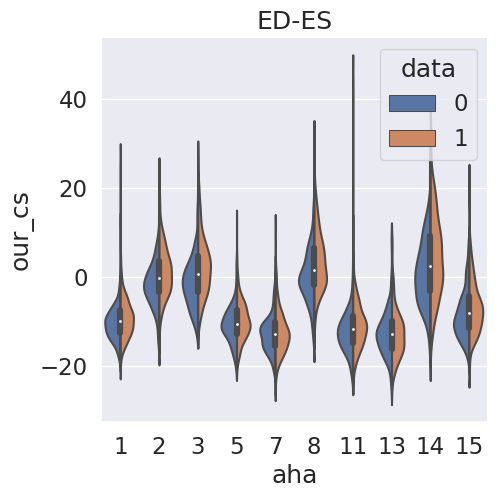

****************************************
CS strain in phase: ED-PF - significant AHA segments: [1, 2, 5, 7, 8, 11, 13, 15], p-values: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0024400000000000003, 0.00127, 0.015079999999999998]
aha  data
1    0      -7.411748
     1      -7.216544
2    0      -1.639384
     1       0.766823
5    0      -8.887448
     1      -8.268401
7    0      -7.656484
     1      -8.528436
8    0       0.398810
     1       3.125780
11   0      -9.170378
     1      -8.730076
13   0      -7.847117
     1      -8.365007
15   0      -4.900579
     1      -4.418988
Name: our_cs, dtype: float64


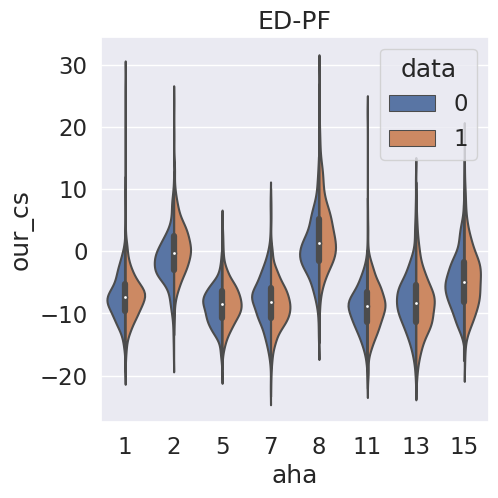

****************************************
CS strain in phase: ED-MD - significant AHA segments: [1, 2, 3, 4, 5, 9, 10, 11, 15], p-values: [0.0, 0.0, 0.02034, 0.0, 0.0, 0.00127, 0.03456, 0.0, 0.00127]
aha  data
1    0      -0.130376
     1      -0.480703
2    0      -1.035231
     1      -0.087717
3    0      -1.548775
     1      -0.554664
4    0      -0.174144
     1      -0.830959
5    0      -3.241801
     1      -2.271286
9    0      -1.028565
     1      -0.410442
10   0      -0.369192
     1      -1.251603
11   0      -2.385426
     1      -1.695129
15   0      -1.258606
     1      -1.784849
Name: our_cs, dtype: float64


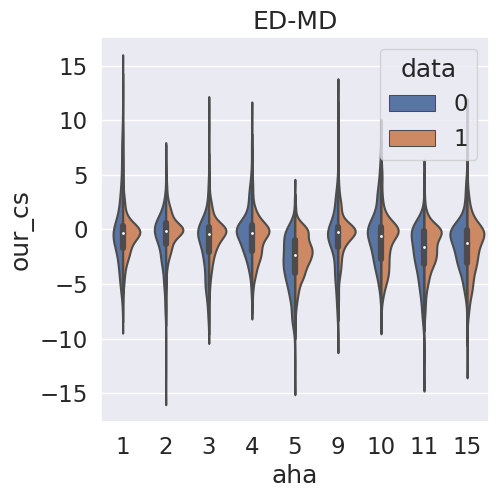

<Figure size 640x480 with 0 Axes>

(16, 10)


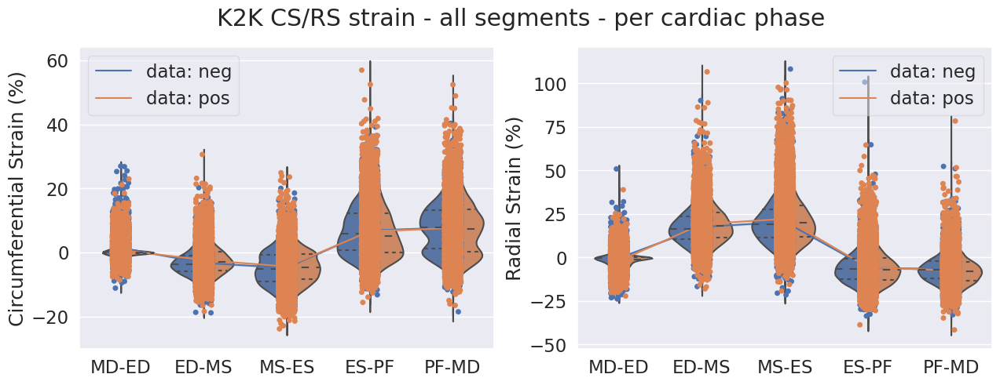

****************************************
RS strain in phase: MD-ED - significant AHA segments: [0, 3, 4, 5, 9, 10, 11, 14, 15], p-values: [0.02706, 0.0, 0.00136, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aha  data
3    0      -0.848975
     1      -1.296925
4    0       1.503440
     1      -0.937907
5    0      -2.560093
     1      -4.710358
9    0      -0.128729
     1      -1.052125
10   0       0.565694
     1      -1.686179
11   0      -1.476835
     1      -4.407283
14   0      -0.236329
     1      -1.155866
15   0       0.095531
     1      -2.282247
Name: our_rs, dtype: float64


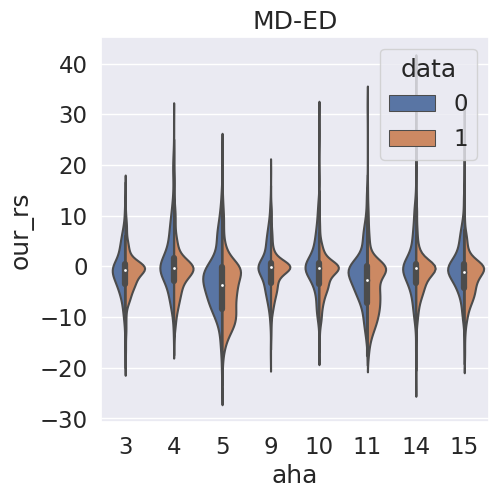

****************************************
RS strain in phase: ED-MS - significant AHA segments: [9, 11], p-values: [0.02928, 0.00136]
aha  data
9    0       19.442738
     1       19.385931
11   0       19.989695
     1       22.405148
Name: our_rs, dtype: float64


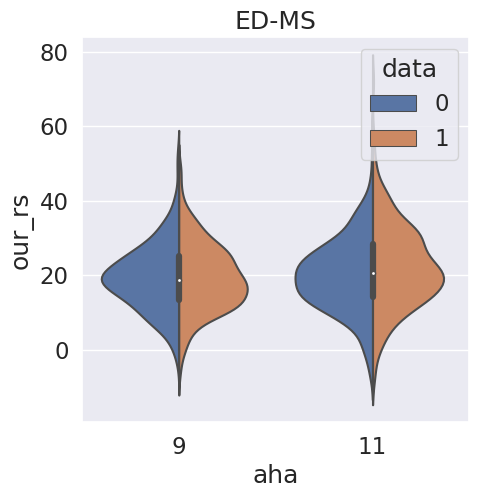

****************************************
RS strain in phase: MS-ES - significant AHA segments: [5, 10, 11], p-values: [0.00266, 0.0, 0.0]
aha  data
5    0       28.564422
     1       32.522768
10   0       19.996542
     1       22.617626
11   0       27.200704
     1       33.154191
Name: our_rs, dtype: float64


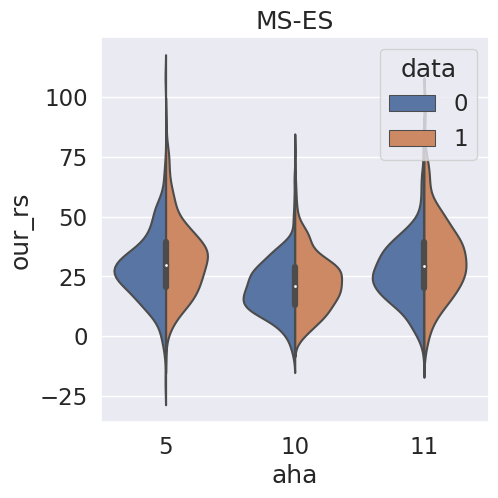

****************************************
RS strain in phase: ES-PF - significant AHA segments: [1, 12], p-values: [0.044840000000000005, 0.00266]
aha  data
1    0       0.907666
     1       0.138031
12   0      -4.154568
     1      -3.381192
Name: our_rs, dtype: float64


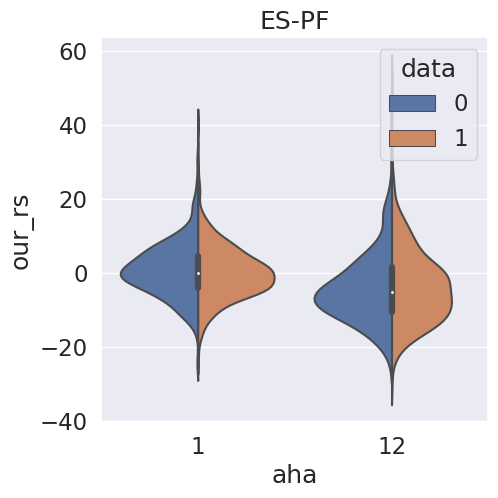

****************************************
RS strain in phase: PF-MD - significant AHA segments: [2], p-values: [0.00266]
aha  data
2    0      -8.132037
     1      -9.932581
Name: our_rs, dtype: float64


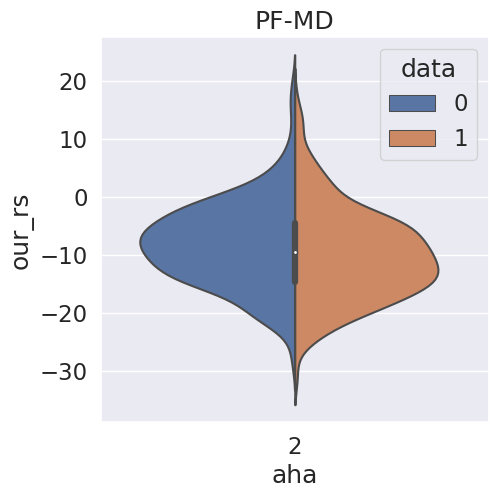

****************************************
CS strain in phase: MD-ED - significant AHA segments: [2, 4, 5, 10, 11, 15], p-values: [0.0372, 0.0, 0.0, 0.0, 0.0, 0.0]
aha  data
2    0      -0.152725
     1      -0.401705
4    0       0.558290
     1       0.624439
5    0       4.024147
     1       2.357577
10   0       0.613692
     1       0.859856
11   0       4.532767
     1       2.751241
15   0       0.920925
     1       0.892223
Name: our_cs, dtype: float64


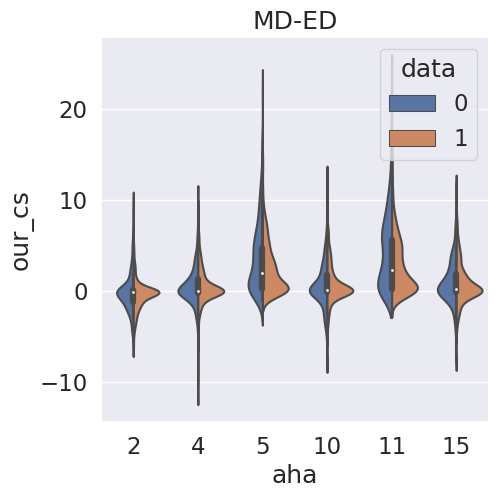

****************************************
CS strain in phase: ED-MS - significant AHA segments: [1, 2, 3, 7, 8, 13], p-values: [0.0, 0.0, 0.01397, 0.0, 0.0, 0.0]
aha  data
1    0      -6.244519
     1      -5.551693
2    0      -1.579533
     1       1.035931
3    0      -1.519816
     1       0.903694
7    0      -7.053894
     1      -7.100506
8    0      -0.925928
     1       1.887455
13   0      -5.650630
     1      -5.582135
Name: our_cs, dtype: float64


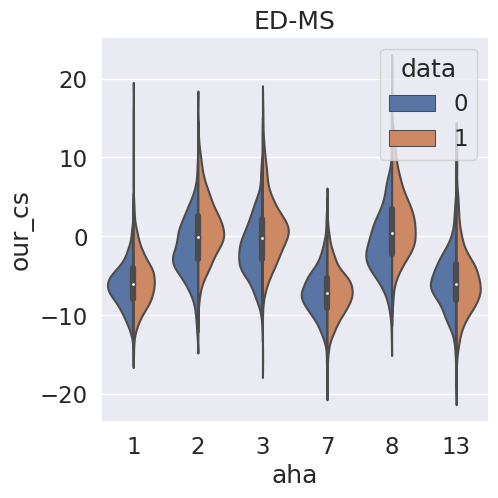

****************************************
CS strain in phase: MS-ES - significant AHA segments: [3, 4, 10, 15], p-values: [0.01161, 0.01512, 0.04914, 0.006500000000000001]
aha  data
3    0      -0.172950
     1       0.158113
4    0      -3.970553
     1      -3.112409
10   0      -4.400533
     1      -4.074874
15   0      -6.191277
     1      -5.924028
Name: our_cs, dtype: float64


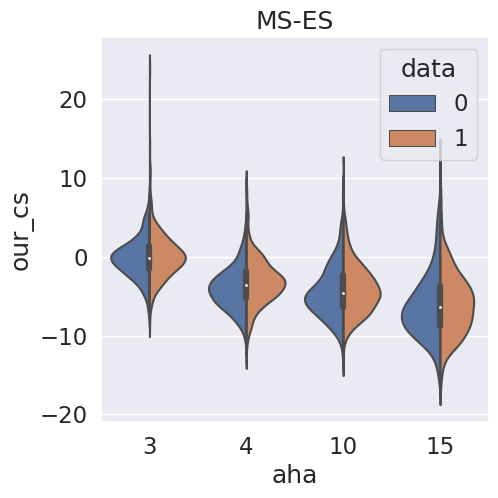

****************************************
CS strain in phase: ES-PF - significant AHA segments: [0, 6, 7, 11, 15], p-values: [0.0, 0.03388, 0.04914, 0.0, 0.02356]
aha  data
6    0       14.389515
     1       15.902590
7    0       10.078894
     1        8.175044
11   0        9.629349
     1       10.374965
15   0       11.372556
     1       10.628874
Name: our_cs, dtype: float64


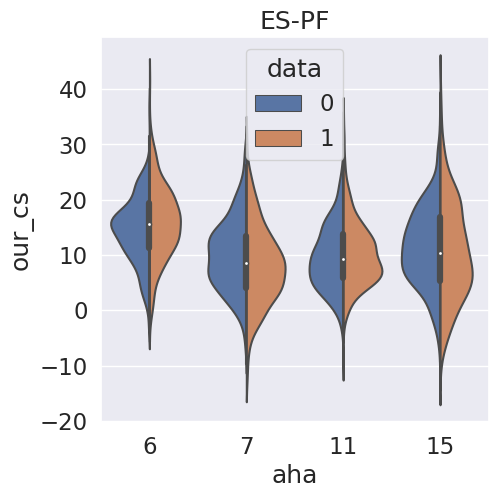

****************************************
CS strain in phase: PF-MD - significant AHA segments: [0, 1, 2, 3, 7, 8, 11], p-values: [0.00136, 0.0, 0.0, 0.02125, 0.0, 0.0128, 0.04284]
aha  data
1    0       11.455912
     1        9.320828
2    0        0.676877
     1       -0.554866
3    0        0.402839
     1       -0.895330
7    0       10.293067
     1       10.084743
8    0       -0.111209
     1       -1.749371
11   0       13.463558
     1       14.135171
Name: our_cs, dtype: float64


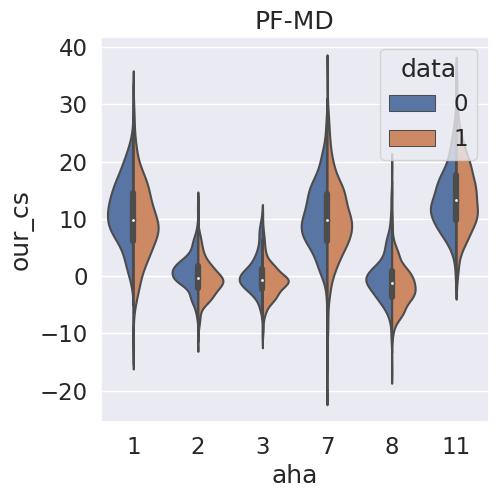

<Figure size 640x480 with 0 Axes>

In [141]:
target = 'data' # lge, lgeef, dmd, first_split, bad
sig_niv = 0.05
_ = plot_strain_per_time(df_strain_comp,title='ED2K CS/RS strain - all segments - per cardiac phase',method='comp', hue=target, sig_niv=sig_niv); plt.show()
_ = plot_strain_per_time(df_strain_p2p, title='K2K CS/RS strain - all segments - per cardiac phase',method='p2p', hue=target, sig_niv=sig_niv);plt.show()

# Violinplots of RS/CS per segment - hue=LGE+/LGE-

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
y cannot be an empty list or array.


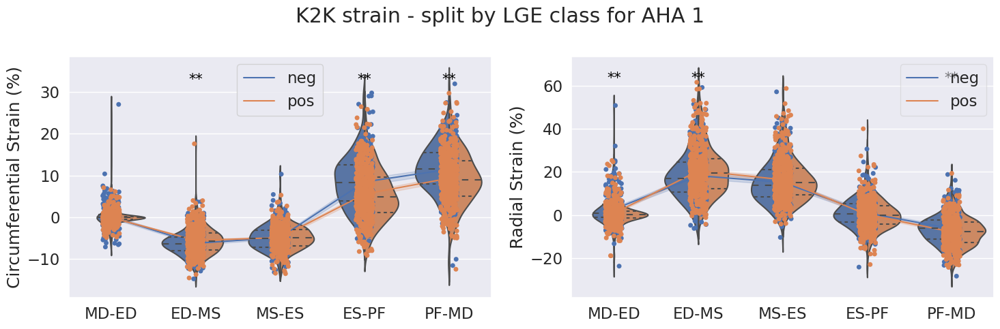

y cannot be an empty list or array.


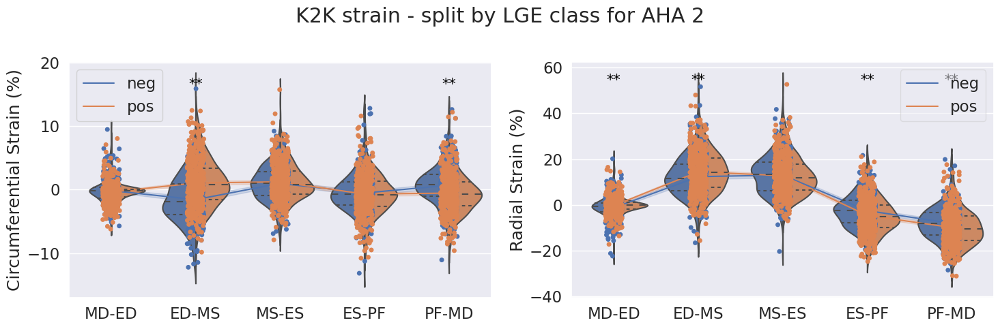

y cannot be an empty list or array.


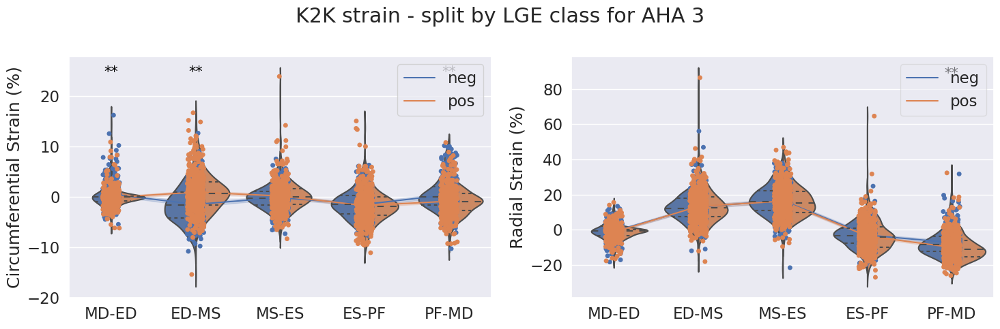

y cannot be an empty list or array.


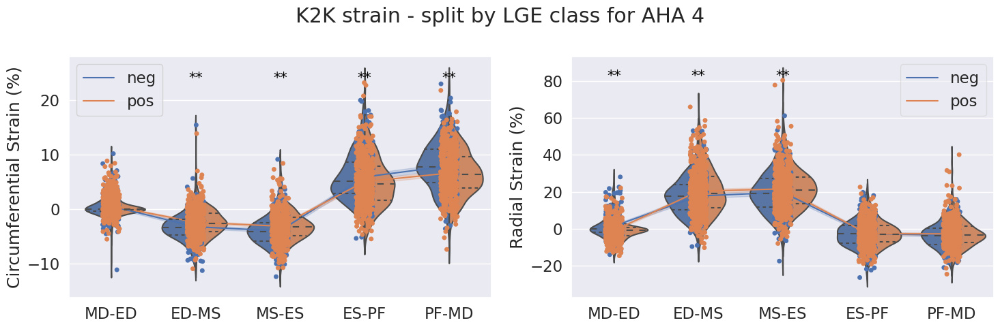

y cannot be an empty list or array.


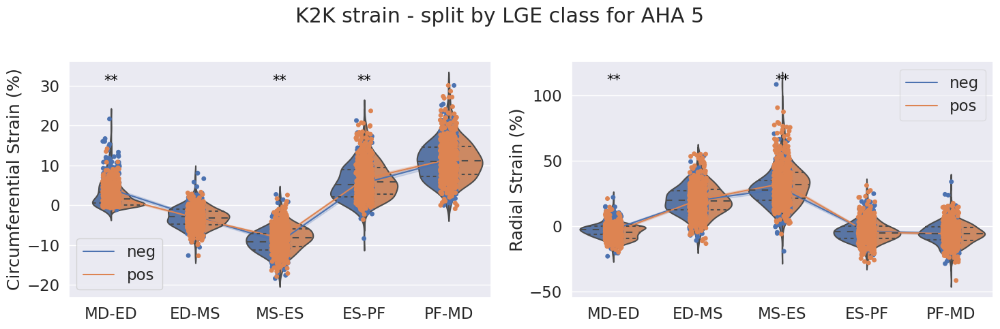

y cannot be an empty list or array.


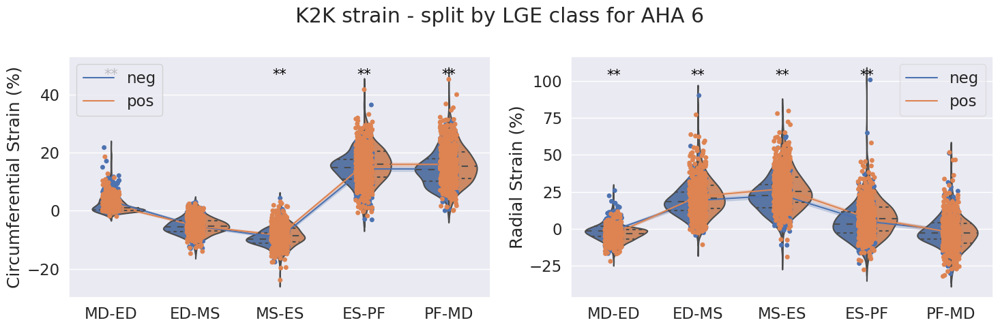

y cannot be an empty list or array.


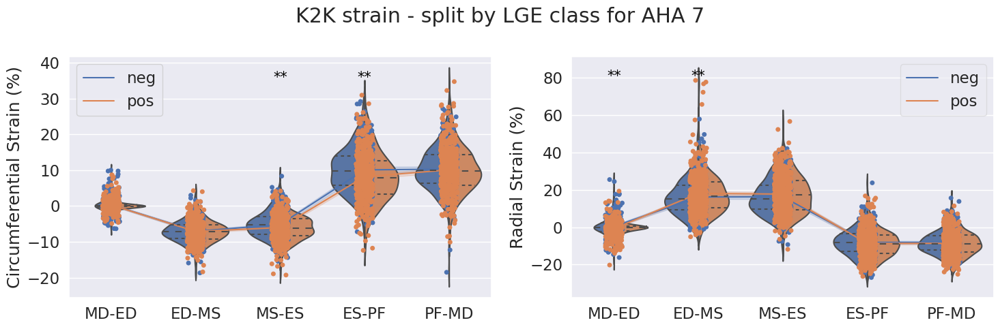

y cannot be an empty list or array.


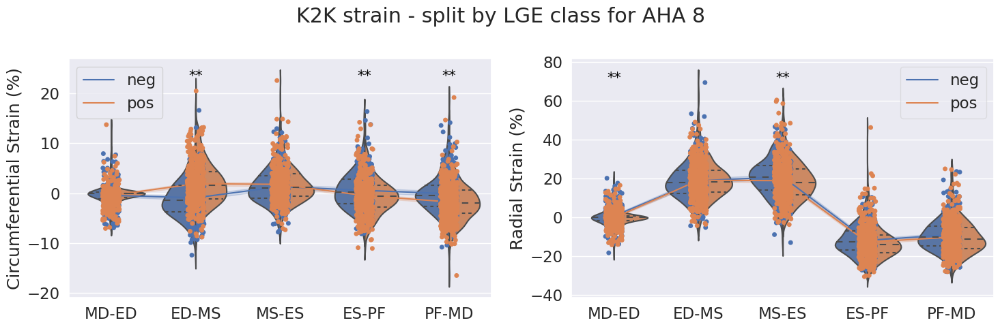

y cannot be an empty list or array.


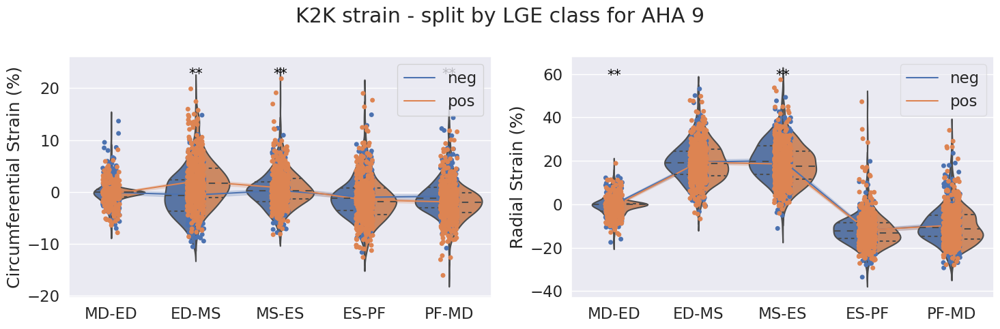

y cannot be an empty list or array.


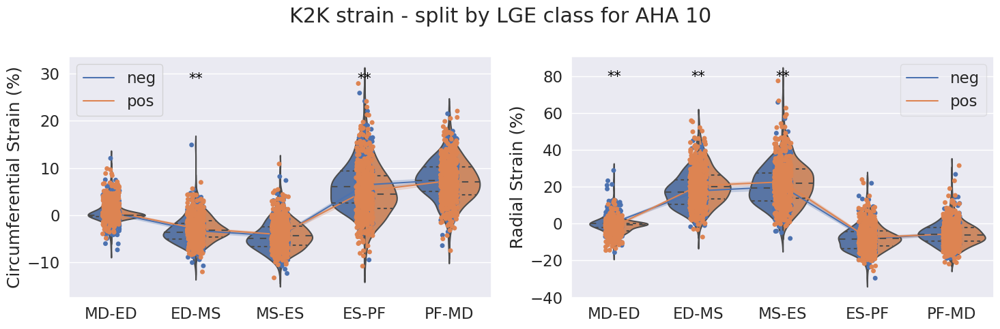

y cannot be an empty list or array.


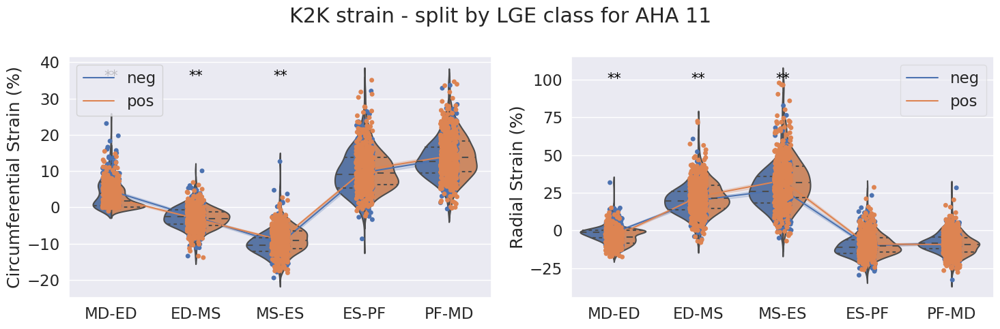

y cannot be an empty list or array.


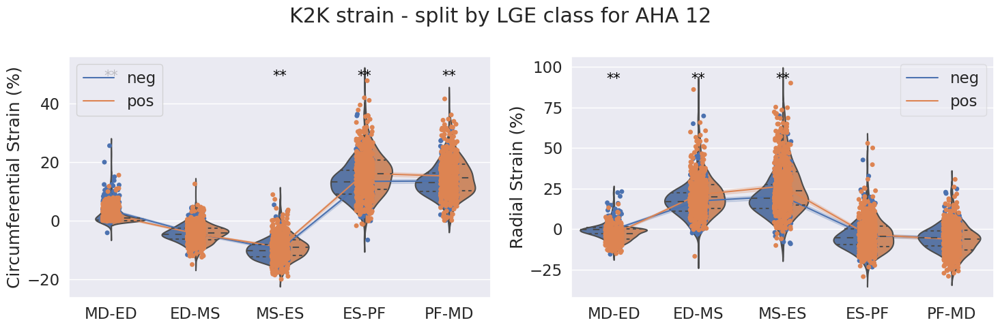

y cannot be an empty list or array.


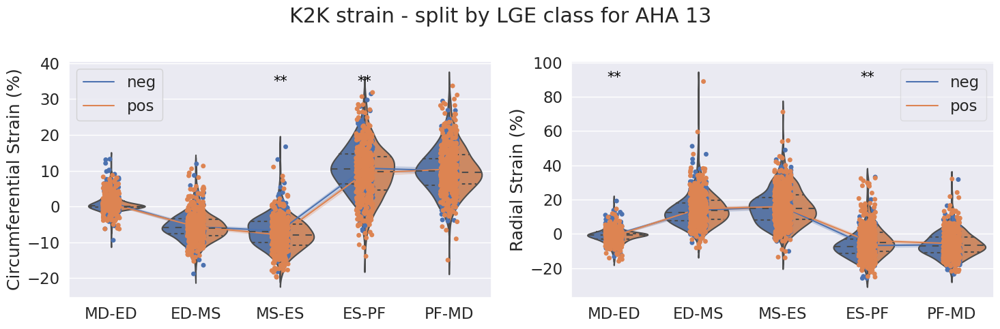

y cannot be an empty list or array.


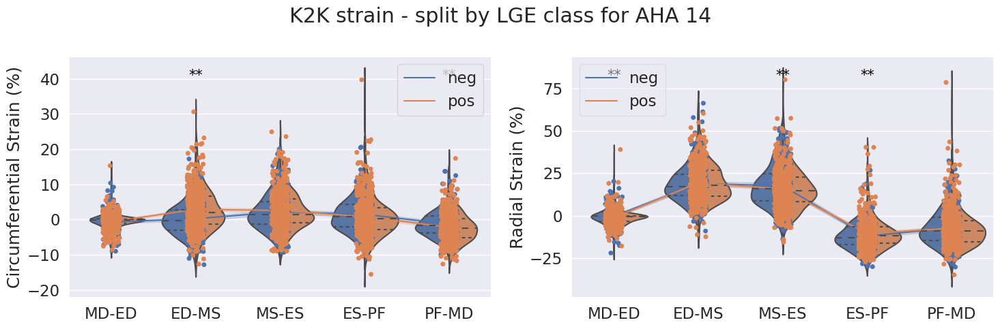

y cannot be an empty list or array.


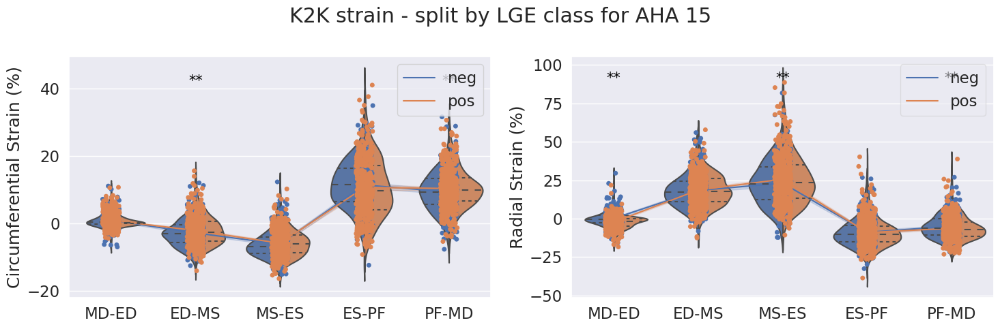

y cannot be an empty list or array.


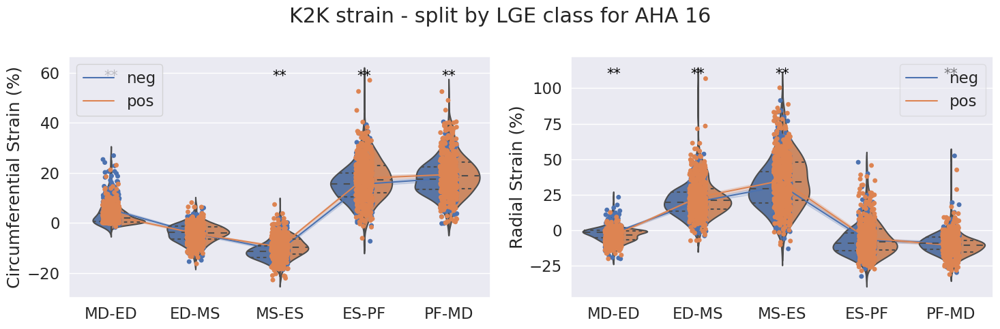

In [89]:
# plot one violinplot per segment for the p2p strains
target = 'data'
segments_of_interest = list(range(1,17))
print(segments_of_interest)
for i in segments_of_interest:
    temp = df_strain_p2p[df_strain_p2p['aha']==i]
    _ = plot_strain_per_time(temp, title="K2K strain - split by LGE class for AHA {}".format(i), method='p2p', hue=target);plt.show()

y cannot be an empty list or array.


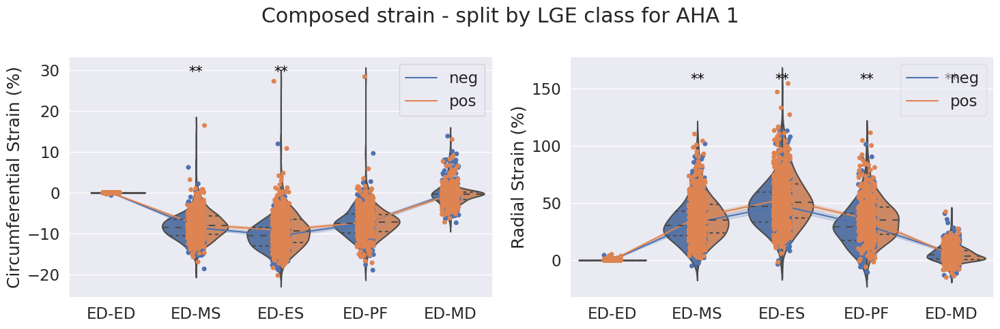

y cannot be an empty list or array.


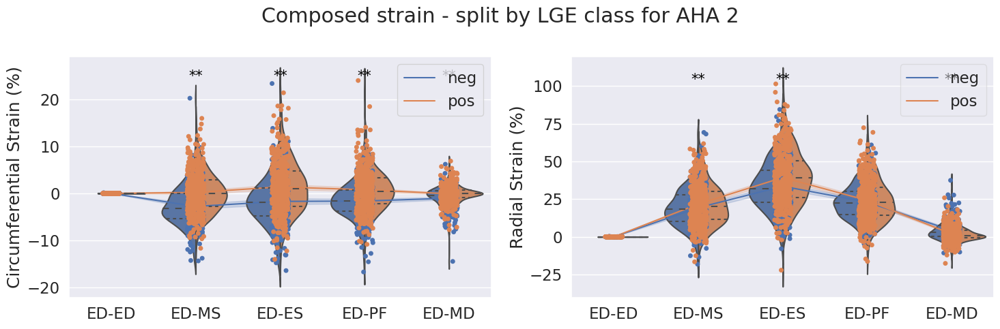

y cannot be an empty list or array.


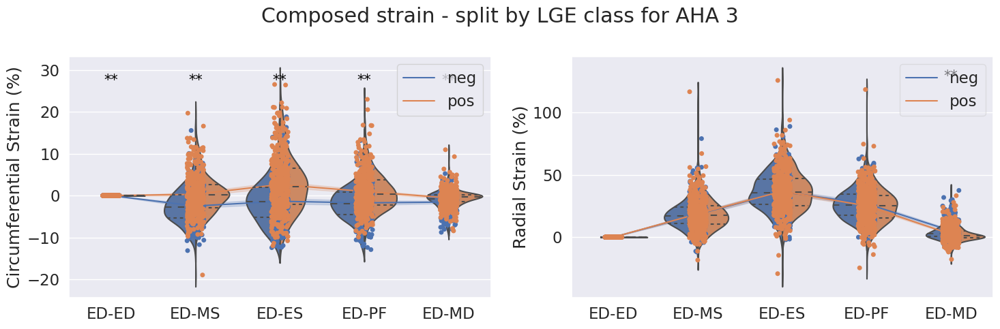

y cannot be an empty list or array.


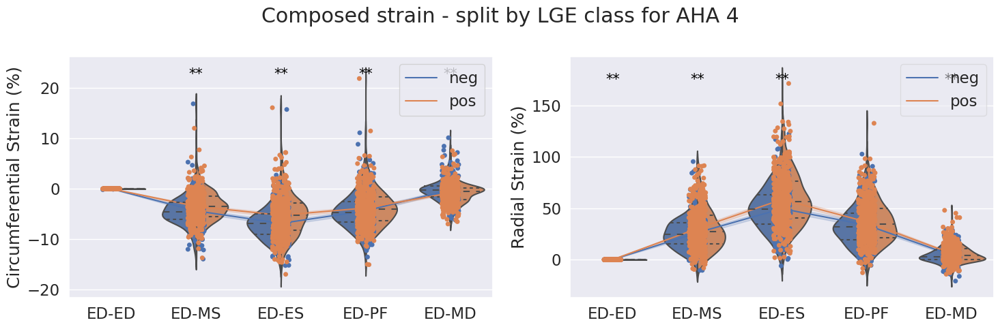

y cannot be an empty list or array.


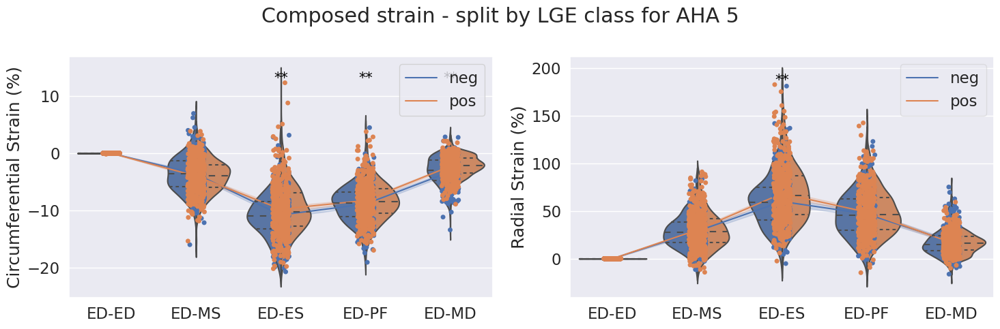

y cannot be an empty list or array.


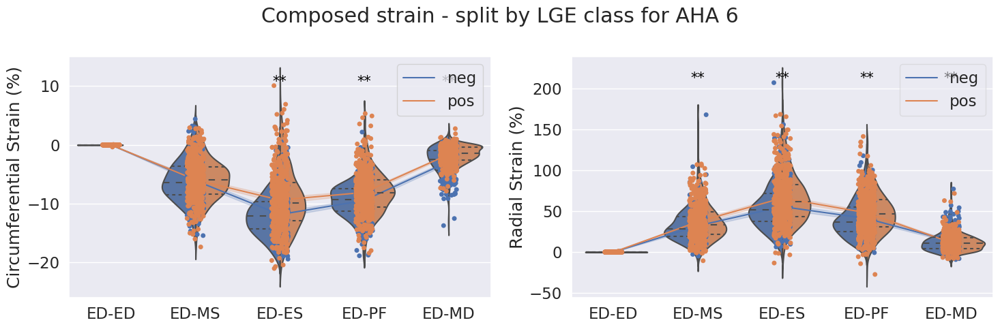

y cannot be an empty list or array.


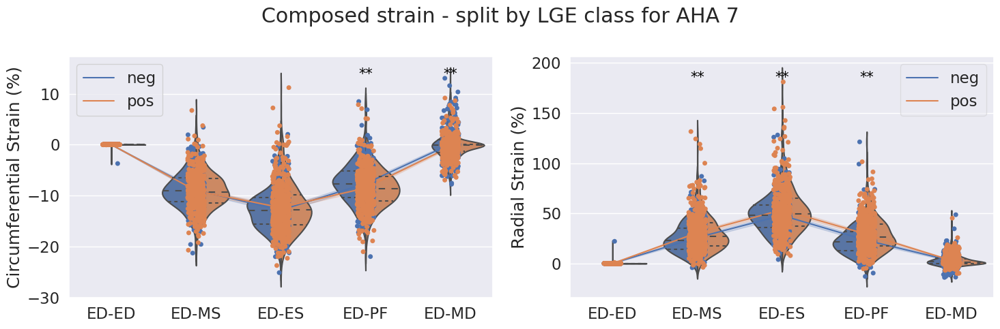

y cannot be an empty list or array.


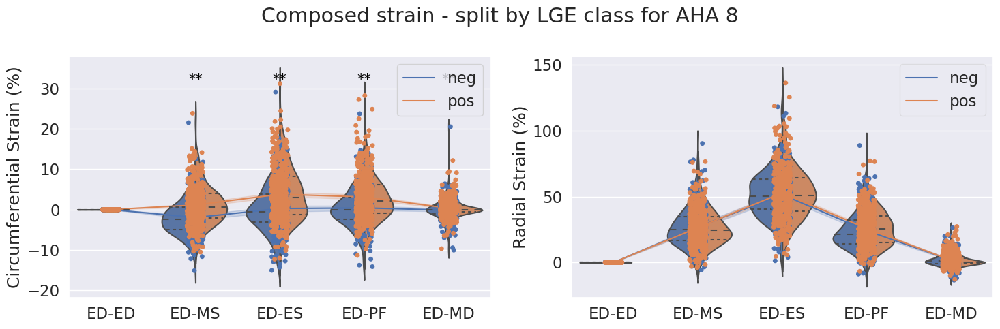

y cannot be an empty list or array.


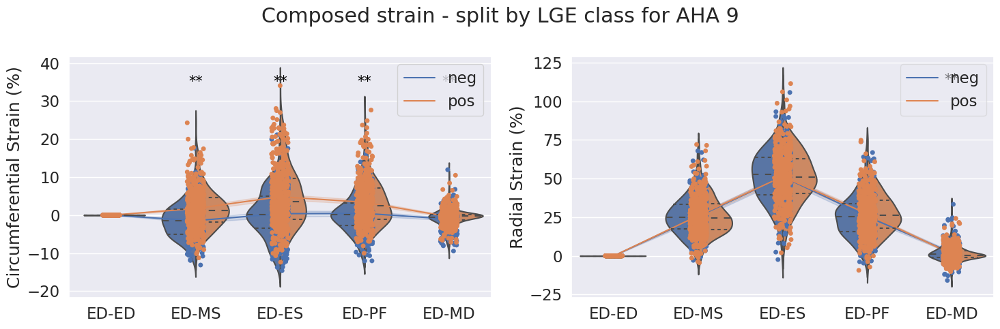

y cannot be an empty list or array.


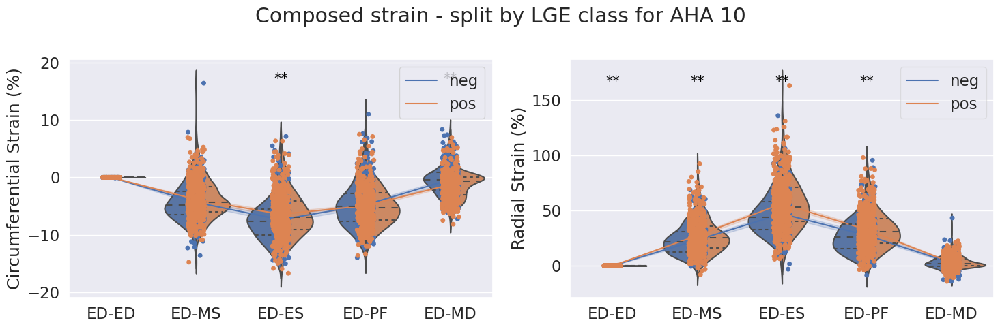

y cannot be an empty list or array.


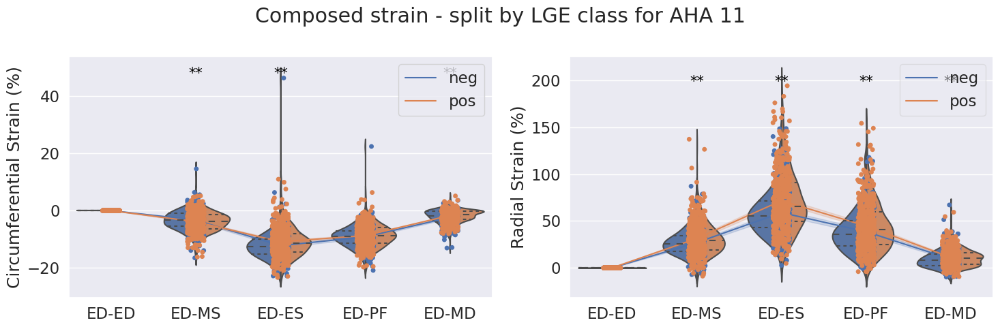

y cannot be an empty list or array.


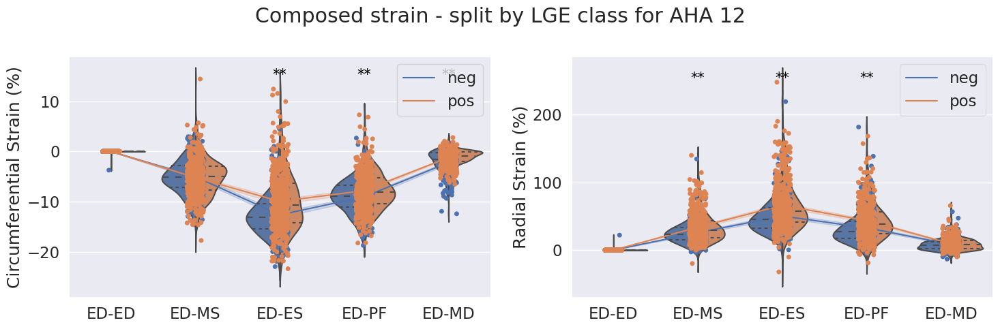

y cannot be an empty list or array.


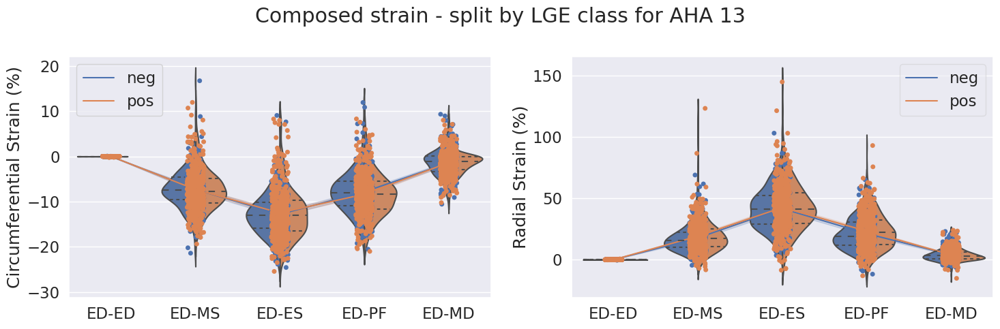

y cannot be an empty list or array.


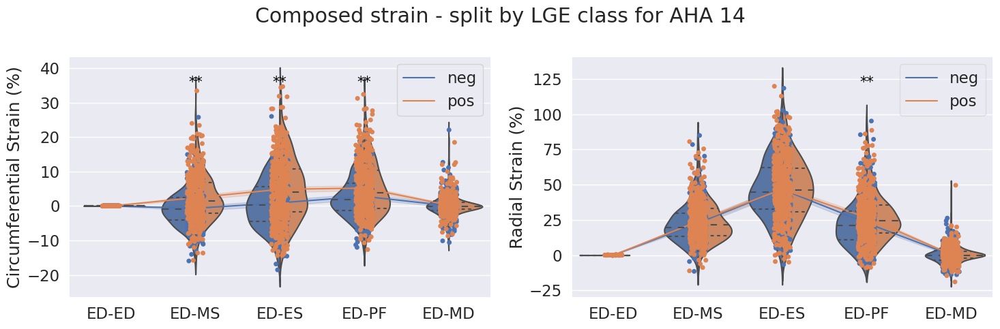

y cannot be an empty list or array.


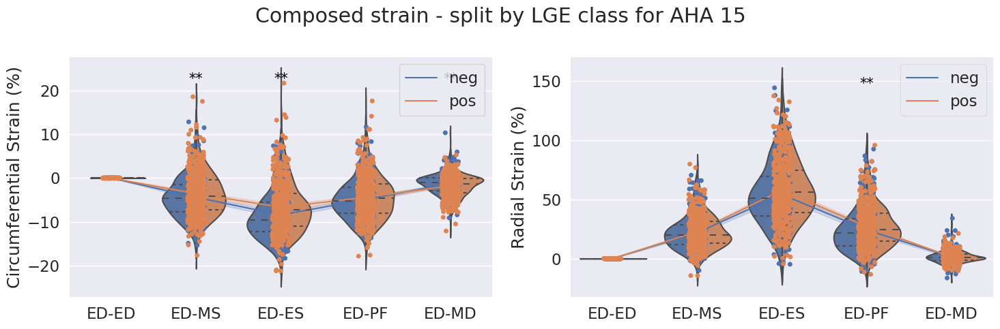

y cannot be an empty list or array.


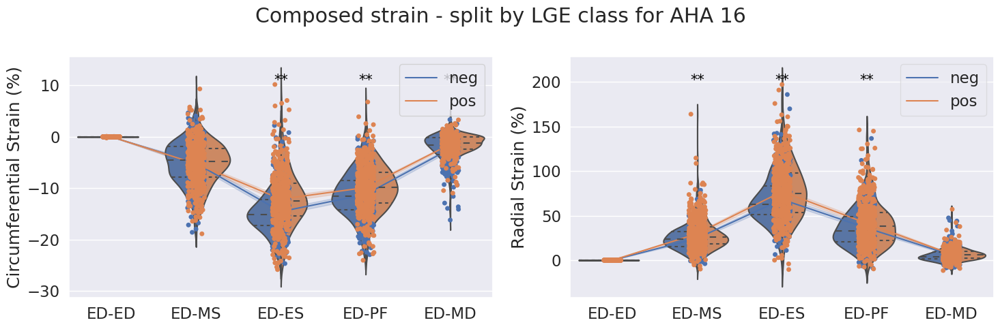

In [90]:
# plot one violinplot per mid-cavity segment for the comp strains
target = 'data'
for i in segments_of_interest:
    temp = df_strain_comp[df_strain_comp['aha']==i]
    _ = plot_strain_per_time(temp, title="Composed strain - split by LGE class for AHA {}".format(i), method='comp', hue=target);plt.show()

# Bullseye plots

In [64]:
pat = 'mda_20220406'
np.where(df_strain_p2p[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==0)].lge.values)

(array([ 3,  4,  8,  9, 10, 13, 14]),)

In [41]:
from src_julian.utils.myAHAfunctions import bullseye_plot, myBullsplot
import matplotlib as mpl
@interact_manual
def show_bullseye(pat=df_strain_p2p.pat.unique()):
    phases = df_strain_p2p.phase.unique()
    lges = df_strain_p2p[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==0)].lge.values
    patient_p2p = df_strain_p2p[df_strain_p2p.pat ==pat]
    patient_comp = df_strain_comp[df_strain_comp.pat ==pat]
    class_ = df_strain_p2p[(df_strain_p2p.pat ==pat)].lge.sum()>0
    cmap_cs = mpl.cm.autumn
    cmap_rs = mpl.cm.autumn
    
    print('Patient: {}, {}, positive segments: {}'.format(pat, class_, np.where(lges)[0]+1)) # start with aha segment 1
    fig, axes = plt.subplots(4, len(phases), figsize=(20, 14), subplot_kw=dict(projection='polar'))
    q = .95
    q_lower = 1-q
    
    # normalise with an upper and lower quantile to exclude outliers to dominant the plot
    # k2k RS
    #p2p_rs_data = df_strain_p2p.our_rs.values
    p2p_rs_data = patient_p2p.our_rs.values
    p2p_rs_norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmin=np.quantile(a=p2p_rs_data,q=q_lower), vmax=np.quantile(a=p2p_rs_data,q=q))
    #ax_p2p_rs = fig.add_axes([0.04, 0.55, .07, .02])
    #cb_rs = mpl.colorbar.ColorbarBase(ax_p2p_rs, cmap=p2p_rs, norm=p2p_rs_norm, orientation='horizontal')
    # k2k CS
    #p2p_cs_data = df_strain_p2p.our_cs.values
    p2p_cs_data = patient_p2p.our_cs.values
    p2p_cs_norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmin=np.quantile(a=p2p_cs_data,q=q_lower), vmax=np.quantile(a=p2p_cs_data,q=q))
    #ax_p2p_cs = fig.add_axes([0.04, 0.55, .07, .02])
    #cb_cs = mpl.colorbar.ColorbarBase(ax_p2p_cs, cmap=cmap_cs, norm=p2p_cs_norm, orientation='horizontal')

    # comp RS
    #comp_rs_data = df_strain_comp.our_rs.values
    comp_rs_data = patient_comp.our_rs.values
    comp_rs_norm = mpl.colors.Normalize( vmin=np.quantile(a=comp_rs_data,q=q_lower), vmax=np.quantile(a=comp_rs_data,q=q))
    #ax_comp_rs = fig.add_axes([0.04, 0.55, .07, .02])
    #cb_rs = mpl.colorbar.ColorbarBase(ax_comp_rs, cmap=cmap_rs, norm=comp_rs_norm, orientation='horizontal')
    # comp CS
    #comp_cs_data = df_strain_comp.our_cs.values
    comp_cs_data = patient_comp.our_cs.values
    comp_cs_norm = mpl.colors.Normalize(vmin=np.quantile(a=comp_cs_data,q=q_lower), vmax=np.quantile(a=comp_cs_data,q=q))
    #ax_comp_cs = fig.add_axes([1, 0.55, .07, .02])
    #cb_rr = mpl.colorbar.ColorbarBase(ax_comp_cs, cmap=cmap_cs, norm=comp_cs_norm, orientation='horizontal')
    
    
    for p in phases:
        rs = df_strain_p2p[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==p)].our_rs.values
        cs = df_strain_p2p[(df_strain_p2p.pat ==pat) & (df_strain_p2p.phase ==p)].our_cs.values
        axes[0,p] = myBullsplot(data=rs, norm=p2p_rs_norm, lge=lges, ax=axes[0,p], cmap=cmap_rs)
        axes[1,p] = myBullsplot(data=cs, norm=p2p_cs_norm, lge=lges, ax=axes[1,p], cmap=cmap_cs)
        
        rs = df_strain_comp[(df_strain_comp.pat ==pat) & (df_strain_comp.phase ==p)].our_rs.values
        cs = df_strain_comp[(df_strain_comp.pat ==pat) & (df_strain_comp.phase ==p)].our_cs.values
        axes[2,p] = myBullsplot(data=rs, norm=comp_rs_norm, lge=lges, ax=axes[2,p], cmap=cmap_rs)
        axes[3,p] = myBullsplot(data=cs, norm=comp_cs_norm, lge=lges, ax=axes[3,p], cmap=cmap_cs)
    axes[0,0].set_title('Radial Strain - k2k')
    axes[1,0].set_title('Circumferential Strain - k2k')
    axes[2,0].set_title('Radial Strain - composed')
    axes[3,0].set_title('Circumverential Strain - composed')
    
    #axes[0,0].colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='horizontal')
    #plt.colorbar(cax=axes)
    plt.tight_layout()
    plt.show()

interactive(children=(Dropdown(description='pat', options=('0000-02z1l14n_2006-11-09', '0000-04nejquz_2007-03-…

In [24]:
df_strain_p2p_positive = df_strain_p2p[df_strain_p2p['lge']==1]
temp = df_strain_p2p_positive.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_p2p.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_p2p_pos.xlsx'))

In [25]:
df_strain_p2p_negative = df_strain_p2p[df_strain_p2p['lge']==0]
temp = df_strain_p2p_negative.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_p2p.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_p2p_neg.xlsx'))

In [26]:
# Calc the mean/std for the phase2phases strain per patient, export as xlsx
temp = df_strain_p2p.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_p2p.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_p2p_mean.xlsx'))

In [27]:
# Calc the mean/std for the composed strain per patient, export as xlsx
temp = df_strain_comp.groupby(['aha','phase']).mean()
temp.columns = map(lambda x : x + '_mean', temp.columns)
temp2 = df_strain_comp.groupby(['aha','phase']).std()
temp2.columns = map(lambda x : x + '_std', temp2.columns)
temp = pd.concat([temp,temp2], axis=1)
temp = temp.drop(['soa_mean','lge_mean','soa_std','lge_std'], axis=1)
temp.to_excel(os.path.join(path_chooser.selected, 'df_strain_comp_mean.xlsx'))

In [10]:
temp

our_rs_mean  our_cs_mean  our_rs_std  our_cs_std
aha phase                                                  
1   0         0.879806     0.089290    0.398987    0.068014
    1         1.075437     0.148970    0.605217    0.093149
    2         0.658606     0.071887    0.321721    0.048374
    3         0.111531     0.001926    0.081021    0.012156
    4         0.003178     0.004315    0.009424    0.006549
...                ...          ...         ...         ...
16  0         0.272984     0.000857    0.181541    0.032843
    1         0.709379    -0.005076    0.257008    0.040408
    2         0.287029    -0.015934    0.230191    0.030687
    3         0.018638    -0.003388    0.015524    0.005383
    4        -0.004293     0.005913    0.008082    0.012554

[80 rows x 4 columns]

In [17]:
# test, if we use only the mid-cavity segments, this performs better, than taking all segments into account
# only freewall
segments_of_interest = [4,5,6,11,12]
# only mid-cavity
segments_of_interest =[5,6,7,8,9,10,11,12]
df_strain_p2p = df_strain_p2p[df_strain_p2p['aha'].isin(segments_of_interest)]
df_strain_comp = df_strain_comp[df_strain_comp['aha'].isin(segments_of_interest)]

In [160]:
df_strain_p2p['pat']
patients[0]

'/mnt/ssd2/test_exp/controls/pred/01_12345622/'

In [158]:
df_strain_p2p[df_strain_p2p['pat']==patients[0]]

,pat,aha,phase,our_rs,our_cs,soa,lge,lgeef,first_split,dmd


# Visualise the vector fields

In [18]:
def plotff(ff, t, z_abs, N):
    nx, ny = (ff.shape[3], ff.shape[2])
    X, Y = np.mgrid[0:nx, 0:ny]
    X, Y = (X[::N, ::N], Y[::N, ::N])
    U = ff[t, z_abs, ::N, ::N, 2]  # x
    V = ff[t, z_abs, ::N, ::N, 1]
    return X, Y, U, V

def plot_1x5_quiver_flowfield(ff, mask_lvmyo=None, cmrs=None, z_abs=None, N=1, crop=None, style=None, headwidth=2.5, headlength=3, width=1, scale=0.5):
    xmin, xmax, ymin, ymax = (crop[0], crop[1], crop[2], crop[3])
    nt = ff.shape[0]

    if style == 'p2p':
        xlabels = ['MD-ED', 'ED-MS', 'MS-ES', 'ES-PF', 'PF-MD']
    elif style == 'comp':
        xlabels = ['ED-ED', 'ED-MS', 'ED-ES', 'ED-PF', 'ED-MD']


    fig, ax = plt.subplots(1, nt, figsize=(12, 10))
    
    for t in range(nt):
        
        X, Y, U, V = plotff(ff=ff, t=t, z_abs=z_abs, N=N)
        ax[t].quiver(Y, X, U, V, units='xy', angles='xy', scale=scale, color='black', headwidth=headwidth,
                     headlength=headlength, width=width)
        
        if mask_lvmyo is not None:
            if style == 'p2p':
                ax[t].imshow(mask_lvmyo[t, z_abs, ..., 0], cmap='Wistia')
                if cmrs is not None: ax[t].imshow(cmrs[t, z_abs, ..., 0], cmap='gray', alpha=0.8)
                
            elif style == 'comp':
                ax[t].imshow(mask_lvmyo[0, z_abs, ..., 0], cmap='Wistia') # only plot ED mask
                if cmrs is not None: ax[t].imshow(cmrs[t, z_abs, ..., 0], cmap='gray', alpha=0.8)
        
        ax[t].set_title(xlabels[t], fontsize=20)
        ax[t].set_xlim(xmin, xmax)
        ax[t].set_ylim(ymax, ymin)
        ax[t].set_aspect('equal')
    plt.setp(ax, xticks=[], yticks=[])
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()
import glob
import SimpleITK as sitk
patients = sorted(glob.glob(os.path.join(path_chooser.selected, 'pred/*/')))
@interact_manual
def show_quiever(p=df_strain_p2p.pat.unique(), z=(0,32), scale=0.5, N=3, do_mask=False):

    global msks
    
    pat = [temp for temp in patients if p in temp][0]

    #ffs = sorted([ f for f in glob.glob(os.path.join(pat, "flow_*")) if "flow_0" in f or "flow_1" in f or "flow_2" in f or "flow_3" in f or "flow_4" in f])
    ffs = sorted([ f for f in glob.glob(os.path.join(pat, "flow_masked*"))])
    ffs = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in ffs], axis=0)
    print(ffs.shape)
    ffs = np.einsum('tczyx->tzyxc', ffs) #  ffs = np.einsum('tczyx->tzyxc', ffs)
    
    from scipy.ndimage import gaussian_filter
    ffs = gaussian_filter(ffs, sigma=(0,0,2,2,0))
    
    ffs_comp = sorted([ f for f in glob.glob(os.path.join(pat, "flow_composed*"))])
    ffs_comp = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in ffs_comp], axis=0)
    ffs_comp = np.einsum('tczyx->tzyxc', ffs_comp)
    

    msks = sorted(glob.glob(os.path.join(pat, "myo_target*")))
    msks = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in msks], axis=0)
    msks = msks[...,None]
    
    cmrs = sorted(glob.glob(os.path.join(pat, "cmr_moving*")))
    cmrs = np.stack([sitk.GetArrayFromImage(sitk.ReadImage(f)) for f in cmrs], axis=0)
    cmrs = cmrs[...,None]
    
    if do_mask: ffs_comp[np.broadcast_to(msks[1:2]<0.1,shape=ffs_comp.shape)] = 0
    if do_mask: ffs[np.broadcast_to(msks<0.1,shape=ffs.shape)] = 0 # np.roll(msks<0.1, shift=1)
        
    _ = plot_strain_per_time(df_strain_p2p[df_strain_p2p['pat']==p], title='K2K Strain - all segments - per cardiac phase',method='p2p', hue=None, sig_niv=sig_niv);plt.show()
        
        
    print(pat.split('/')[-2])
    print('composed')
    plot_1x5_quiver_flowfield(ff=ffs_comp,mask_lvmyo=msks, cmrs=cmrs, z_abs=z, crop=[0,ffs.shape[3],0,ffs.shape[3]], style='comp', N=N, scale=scale)
    print('k2k')
    plot_1x5_quiver_flowfield(ff=ffs,mask_lvmyo=msks, cmrs=cmrs, z_abs=z, crop=[0,ffs.shape[3],0,ffs.shape[3]], style='p2p', N=N, scale=scale)

interactive(children=(Dropdown(description='p', options=('0000-0hqqw4zn_2007-05-23', '0000-2cw0g1a5_2006-04-06…

In [72]:
p = 'kmw_20210416'
[temp for temp in patients if p in temp][0]

'/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/circulation/dmd57/iso2_5_32_p2p/img05_flow05_msk1/msessim_grad_dice/2023-07-19_15_21_1147343/inf81/pred/kmw_20210416/'

In [186]:
'''# manual splitting of two datasets, this should be no longer neccessary
# as we split the data in step 4.
clf = gs.best_estimator_
label = gs.best_params_
# load process first split
x_train, y_train = x,y
# load process second split
x_test, y_test = x,y
# fit a new estimator with the 'best parameters'
clf = clf.set_params(**label)
clf.fit(x_train, y_train)
pred_train = clf.predict(x_train)
pred_test = clf.predict(x_test)
print('len train:',len(pred_train))
print('len test:', len(pred_test))
'''

"# manual splitting of two datasets, this should be no longer neccessary\n# as we split the data in step 4.\nclf = gs.best_estimator_\nlabel = gs.best_params_\n# load process first split\nx_train, y_train = x,y\n# load process second split\nx_test, y_test = x,y\n# fit a new estimator with the 'best parameters'\nclf = clf.set_params(**label)\nclf.fit(x_train, y_train)\npred_train = clf.predict(x_train)\npred_test = clf.predict(x_test)\nprint('len train:',len(pred_train))\nprint('len test:', len(pred_test))\n"

In [63]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
mlp_params = {'clf': MLPClassifier(hidden_layer_sizes=(50, 100, 10), random_state=1), 'clf__hidden_layer_sizes': (100, 50, 10), 'clf__solver': 'adam', 'scaler': None}
svm_params = {'clf': SVC(C=1, degree=2), 'clf__C': 1, 'clf__class_weight': None, 'clf__degree': 2, 'clf__gamma': 'scale', 'clf__kernel': 'rbf', 'scaler': None}
rf_params = param = {'clf': RandomForestClassifier(class_weight='balanced', random_state=1), 'clf__class_weight': 'balanced', 'clf__n_estimators': 100, 'scaler': None}
clf = copy.deepcopy(gs.best_estimator_).set_params(**svm_params)
from sklearn.ensemble import RandomForestClassifier
#clf = RandomForestClassifier(random_state=0)
clf.fit(x_train, y_train)

Pipeline(steps=[('scaler', None), ('clf', SVC(C=1, degree=2))])

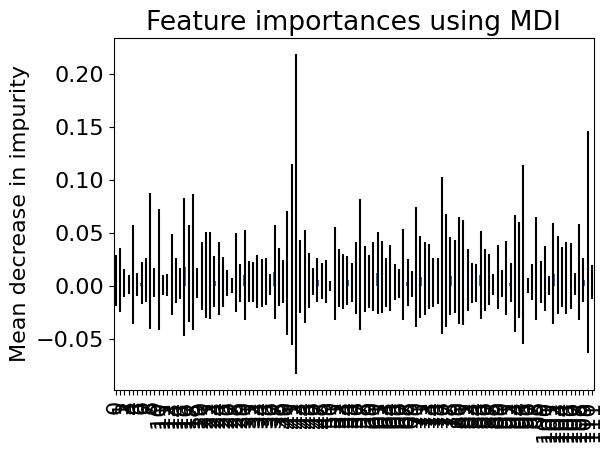

In [35]:
importances = clf.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf.estimators_], axis=0)
import pandas as pd

forest_importances = pd.Series(importances)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout();plt.show()

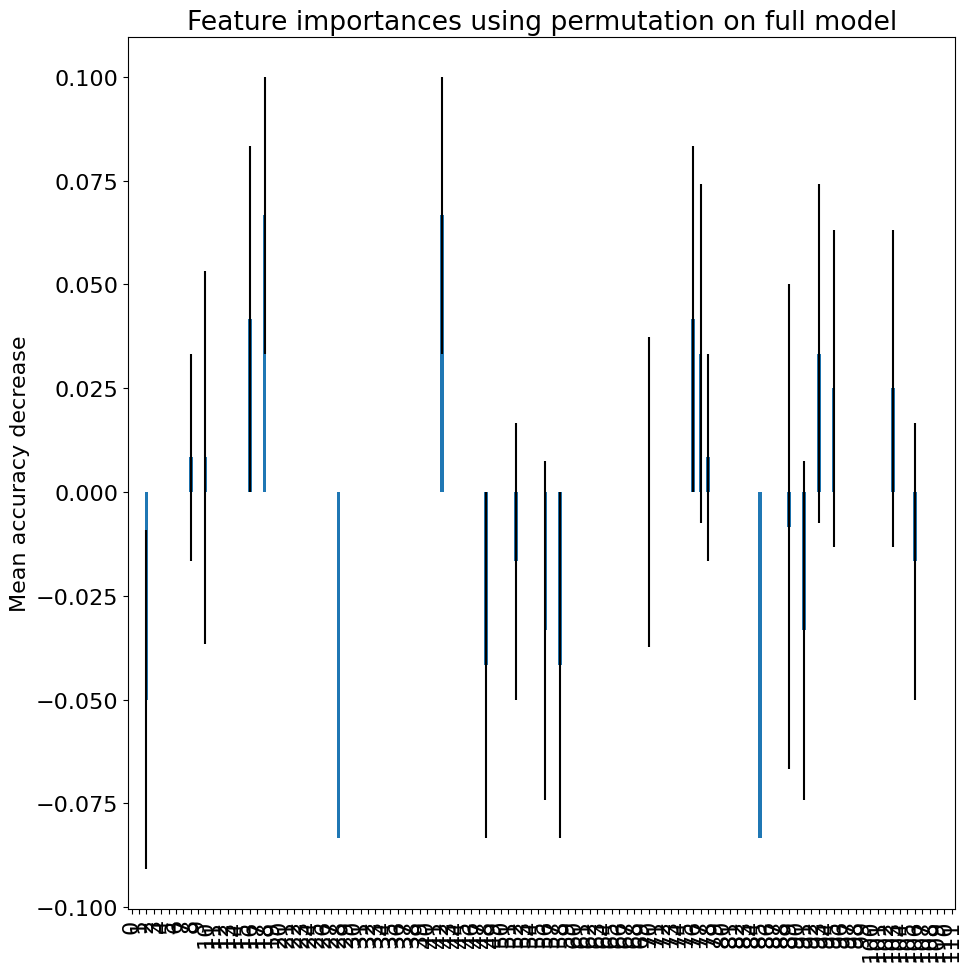

In [36]:
from sklearn.inspection import permutation_importance

result = permutation_importance(
    clf, x_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
forest_importances = pd.Series(result.importances_mean)
fig, ax = plt.subplots(figsize=(10,10))
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [64]:
pred_train = clf.predict(x_train)
pred_test = clf.predict(x_test)
true_train = pred_train==y_train
true_test = pred_test==y_test
print('len train:',len(pred_train))
print('len test:', len(pred_test))

len train: 57
len test: 82


# Inference case for the ML model (fit on 57, inference on 82 and vize versa)

In [50]:
# the gs instance is refit on all trainings files with the refit parameter according to the balance accuracy
# now we can use the gs instance as estimator
pred_train = gs.predict(x_train)
pred_test = gs.predict(x_test)
true_train = pred_train==y_train
true_test = pred_test==y_test
print('len train:',len(pred_train))
print('len test:', len(pred_test))

len train: 57
len test: 82


In [51]:
from src.utils.Evaluation import my_sens, my_spec, bacc_m
from sklearn.metrics import balanced_accuracy_score, f1_score
spec_train = my_spec(y_train, pred_train)
sens_train = my_sens(y_train, pred_train)
acc_train = balanced_accuracy_score(y_train, pred_train)
spec_test = my_spec(y_test, pred_test)
sens_test = my_sens(y_test, pred_test)
acc_test = balanced_accuracy_score(y_test, pred_test)
f1_train = f1_score(y_train,pred_train)
f1_test = f1_score(y_test,pred_test)

In [52]:
print(gs.best_estimator_)
print(gs.best_params_)
print('train f1:',f1_train, ' acc:', acc_train, ' sens:',sens_train, ' spec:',spec_train)
print('test f1:',f1_test, ' acc:', acc_test, ' sens:',sens_test,' spec:',spec_test)

Pipeline(steps=[('scaler', None),
                ('clf',
                 VotingClassifier(estimators=[('lr',
                                               LogisticRegression(class_weight='balanced',
                                                                  max_iter=1000,
                                                                  random_state=1)),
                                              ('rf',
                                               Pipeline(steps=[('minmaxscaler',
                                                                MinMaxScaler()),
                                                               ('randomforestclassifier',
                                                                RandomForestClassifier(class_weight='balanced',
                                                                                       n_estimators=500,
                                                                                       random_state=1))])),
    

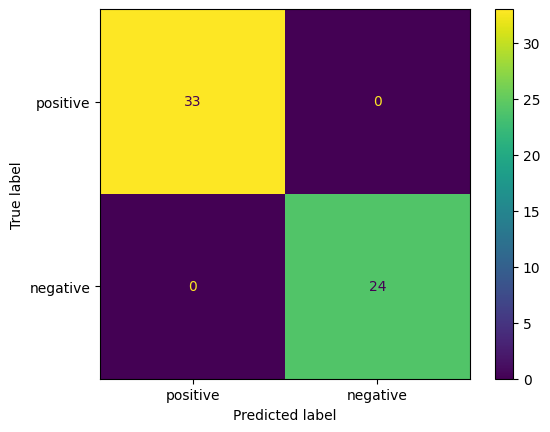

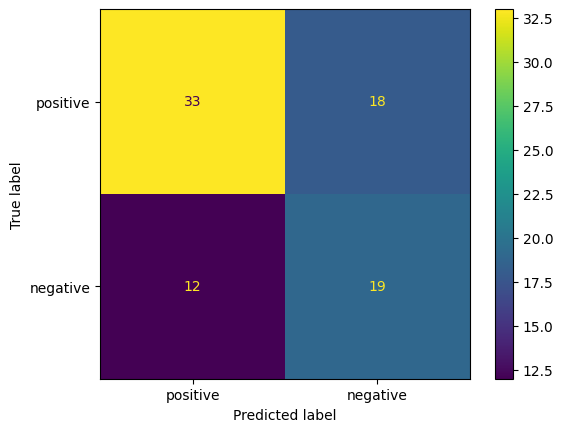

In [53]:
# visualise train and test confusion matrix
from sklearn.metrics import classification_report, confusion_matrix, plot_confusion_matrix, ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay.from_predictions(y_train, pred_train, labels=[1, 0], display_labels=['positive', 'negative'],
                                                   colorbar=True)
disp = ConfusionMatrixDisplay.from_predictions(y_test, pred_test, labels=[1, 0], display_labels=['positive', 'negative'],
                                                   colorbar=True)
plt.show()

In [54]:
# for exp 1147343, the following DMD81 patients fail when we fit with the DMD57 patients:
"""array(['aja_20230331', 'ajs_20200519', 'cbe_20201002', 'ccp_20230414',
       'cre_20200309', 'gay_20230222', 'gid_20221230', 'hdg_20210304',
       'kar_20220525', 'ku_20210423', 'lag_20200108', 'lcl_20180827',
       'lde_20230322', 'lrm_20201009', 'mda_20220406', 'mls_20220623',
       'mr_20221118', 'mrd_20221208', 'psl_20200923', 'rjl_20220721',
       'rtk_20210329', 'sar_20230222', 'sdp_20221202', 'sps_20230324',
       'svm_20220318', 'syo_20210303', 'tjd_20211008', 'zs_20200225'],
      dtype=object)"""
# after new extract_segments method
'''array(['aja_20230331', 'ajs_20200519', 'cre_20200309', 'ert_20221027',
       'gay_20230222', 'gid_20221230', 'hrm_20200626', 'lcl_20180827',
       'lde_20230322', 'lrm_20201009', 'mda_20220406', 'mls_20220623',
       'mr_20221118', 'psl_20200923', 'rda_20210517', 'rje_20200117',
       'rjl_20220721', 'rtk_20210329', 'sdp_20221202', 'sps_20230324',
       'sv_20210305', 'svm_20220318', 'syo_20210303', 'tjd_20211008',
       'zs_20200225'], dtype=object)'''
# with spacing 0.9mm, mask from target
"""array(['aja_20230331', 'ajs_20200519', 'cre_20200309', 'emi_20210628',
       'ert_20221027', 'gid_20221230', 'hdg_20210304', 'hrm_20200626',
       'ka_20220525', 'kar_20220525', 'lag_20200108', 'lcl_20180827',
       'lde_20230322', 'lrm_20201009', 'mls_20220623', 'msc_20210820',
       'rca_20210205', 'rjl_20220721', 'rtk_20210329', 'sj_20221010',
       'skm_20210224', 'tjd_20211008', 'vcr_20230413'], dtype=object)"""
# with a spacing of 0.9, mask from target and mid-cavity features --> 82/80 sens/spec
'''array(['aja_20230331', 'ajs_20200519', 'cre_20200309', 'emi_20210628',
       'gid_20221230', 'ka_20220525', 'lag_20200108', 'lde_20230322',
       'lrm_20201009', 'rca_20210205', 'rje_20200117', 'rjl_20220721',
       'sdp_20221202', 'svm_20220318', 'tjd_20211008'], dtype=object)'''
pats =(df_strain_p2p[df_strain_p2p.first_split==0]).sort_values(['pat'])['pat'].unique()
wrong_pats = pats[~true_test]
wrong_pats

array(['aea_20220314', 'aja_20230331', 'ajs_20200519', 'ba_20201019',
       'cre_20200309', 'ert_20221027', 'gay_20230222', 'gid_20221230',
       'hbr_20210115', 'hdg_20210304', 'kar_20220525', 'kjr_20211118',
       'lag_20200108', 'lcl_20180827', 'lde_20230322', 'lrm_20201009',
       'mda_20220406', 'mr_20221118', 'msc_20210820', 'rjl_20220721',
       'rtk_20210329', 'sar_20230222', 'sc_20211209', 'sdp_20221202',
       'skm_20210224', 'sps_20230324', 'svm_20220318', 'tjd_20211008',
       'vcr_20230413', 'zs_20200225'], dtype=object)

In [47]:
len(wrong_pats)

15

In [57]:
# check how well we predicted the pLVEF patient group in the dmd82 cohort

# for the ED-ES CS strain these are the pLVEF patients that we predict wrong['ajs_20200519',
#  ['cre_20200309',
#  'gay_20230222',
#  'gid_20221230',
#  'hdg_20210304',
#  'lag_20200108',
#  'lrm_20201009',
#  'mda_20220406',
#  'mr_20221118',
#  'rjl_20220721',
#  'sar_20230222',
#  'tjd_20211008',
#  'vcr_20230413']

# for the best approach those are the patients:
# ['ajs_20200519',
#  'cre_20200309',
#  'emi_20210628',
#  'gid_20221230',
#  'lag_20200108',
#  'lrm_20201009',
#  'rjl_20220721',
#  'tjd_20211008']

wrong_plvef = [p for p in rLVEF if p in wrong_pats]
wrong_plvef

['ert_20221027', 'svm_20220318']

In [1641]:
# check the FP cases
wrong_reducedlvef = [p for p in lge_neg_reduced_lvef if p in wrong_pats]
wrong_reducedlvef

['rca_20210205', 'rje_20200117', 'svm_20220318']

In [1044]:
# show all wrong predicted patients and their number of positive segments followed by a binary list showing the positive/negative segments
print(df_strain_p2p[(df_strain_p2p.pat.isin(wrong_pats)) & (df_strain_p2p.phase==0)].groupby('pat')['lge'].sum())
df_strain_p2p[(df_strain_p2p.pat.isin(wrong_pats)) & (df_strain_p2p.phase==0)].groupby('pat')['dmd'].apply(list)

pat
01_12345622     0
03_12345652     0
04_12345662     0
05_12345664     0
aja_20230331    2
ajs_20200519    5
bb_20190627     0
bl_20190122     0
cf_20181119     0
cj_20180814     0
cre_20200309    4
emi_20210628    2
gid_20221230    1
hj_20190722     0
ka_20220525     0
kj_20190529     0
lag_20200108    3
lde_20230322    0
lrm_20201009    9
ma_20191226     0
mi_20190604     0
nn_20151215     0
ob_20180726     0
pj_20190624     0
pu_20191101     0
ra_20190501     0
rca_20210205    0
rd_20200221     0
rje_20200117    0
rjl_20220721    2
rk_20180629     0
sd_20190925     0
sdp_20221202    0
svm_20220318    0
tj_20190830     0
tjd_20211008    3
Name: lge, dtype: int64


pat
01_12345622     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
03_12345652     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
04_12345662     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
05_12345664     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
aja_20230331    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
ajs_20200519    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
bb_20190627     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
bl_20190122     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
cf_20181119     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
cj_20180814     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
cre_20200309    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
emi_20210628    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
gid_20221230    [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
hj_20190722     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
ka_20220525     [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
kj_20190529     [0, 0

# Visualise the features

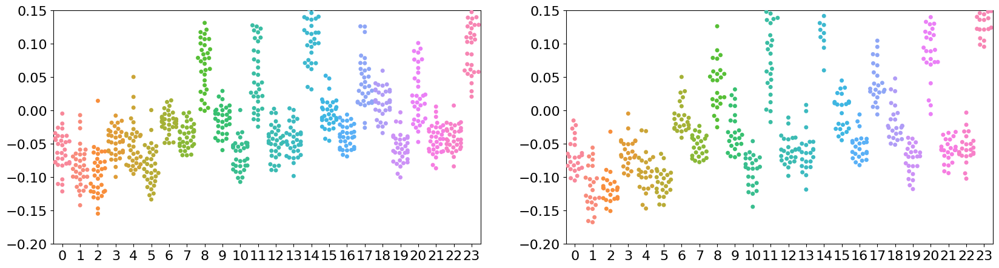

In [170]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20,5))
sb.swarmplot(data=x_train[y_train], ax=ax1)
sb.swarmplot(data=x_train[~y_train], ax=ax2)
ax1.set(ylim=(-0.20,0.15))
ax2.set(ylim=(-0.20,0.15))
plt.show()

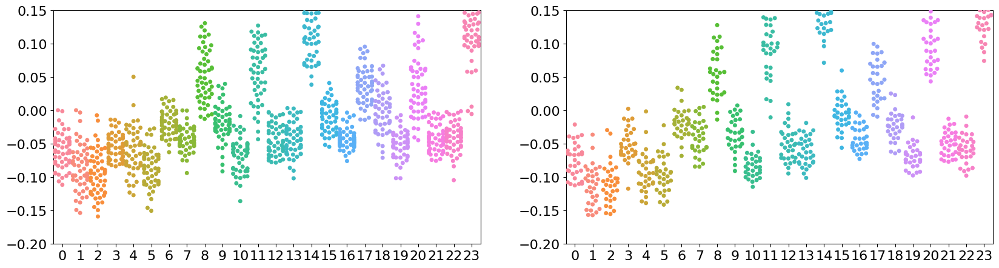

In [169]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20,5))
sb.swarmplot(data=x_test[y_test], ax=ax1)
sb.swarmplot(data=x_test[~y_test], ax=ax2)
ax1.set(ylim=(-0.20,0.15))
ax2.set(ylim=(-0.20,0.15))
plt.show()

In [455]:
temp = pd.DataFrame(np.concatenate([x_train,y_train[:,None]], axis=1))
temp.rename(columns={32:'target'}, inplace=True)
df_long = pd.melt(temp, "target", var_name="a", value_name="c")
sb.factorplot("a", hue="target", y="c", data=df_long, kind="violin", aspect=3)
plt.show()

,0,1,2,3,4,5,6,7,8,9,...,23,24,25,26,27,28,29,30,31,target
0,-0.043363,-0.023051,-0.020079,-0.027414,-0.077295,-0.086318,-0.041903,-0.044847,-0.026351,-0.053326,...,-0.022417,-0.056473,-0.049477,-0.026715,-0.102880,-0.041787,-0.066233,-0.027997,-0.065141,0.0
1,-0.070015,-0.067511,-0.023671,-0.064796,-0.083825,-0.076630,-0.075880,-0.044811,-0.039007,-0.080530,...,-0.059013,-0.058747,-0.093706,-0.113032,-0.139488,-0.093142,-0.050799,-0.137268,-0.130790,0.0
2,-0.061443,-0.033222,-0.030043,-0.027354,-0.062403,-0.077680,-0.049786,-0.041560,-0.037328,-0.036174,...,-0.020656,-0.005961,-0.038895,-0.056308,-0.066111,-0.032033,-0.029415,-0.053642,-0.059625,0.0
3,-0.042138,-0.014001,-0.021089,-0.035559,-0.065198,-0.044683,-0.038105,-0.019441,-0.034939,-0.023350,...,-0.007441,-0.044172,-0.018262,-0.018172,-0.066212,-0.047315,-0.038431,-0.039193,-0.055427,1.0
4,-0.035390,-0.013048,-0.029125,-0.033752,-0.058681,-0.059049,-0.033354,-0.036138,-0.019045,-0.047150,...,-0.048518,-0.018977,-0.067961,-0.064529,-0.074995,-0.058181,-0.068094,-0.052733,-0.058303,1.0
5,-0.043761,-0.034771,-0.023079,-0.047415,-0.068696,-0.070418,-0.045537,-0.035480,-0.022403,-0.036552,...,-0.026276,-0.024824,-0.035431,-0.070171,-0.105016,-0.049454,-0.023128,-0.091690,-0.089586,1.0
6,-0.017755,-0.022677,-0.008386,-0.007781,-0.032353,-0.035383,-0.025913,-0.017354,-0.013000,-0.018806,...,-0.037203,-0.020326,-0.022772,-0.049294,-0.064294,-0.024816,-0.020635,-0.089671,-0.077298,1.0
7,-0.059333,-0.025285,-0.034982,-0.047384,-0.079043,-0.066779,-0.044414,-0.043036,-0.054702,-0.040056,...,-0.058589,-0.095240,-0.039736,-0.048617,-0.097187,-0.067166,-0.073010,-0.043378,-0.056358,0.0
8,-0.031596,-0.033364,-0.025639,-0.036094,-0.055193,-0.043240,-0.036943,-0.025826,-0.026257,-0.038855,...,-0.029553,-0.033504,-0.039022,-0.034384,-0.067779,-0.044770,-0.057539,-0.045494,-0.059901,1.0
9,-0.059282,-0.021654,-0.032396,-0.060718,-0.073347,-0.065469,-0.044378,-0.025580,-0.049249,-0.050781,...,-0.036876,-0.052418,-0.045493,-0.116613,-0.107239,-0.079492,-0.071126,-0.075040,-0.106187,0.0


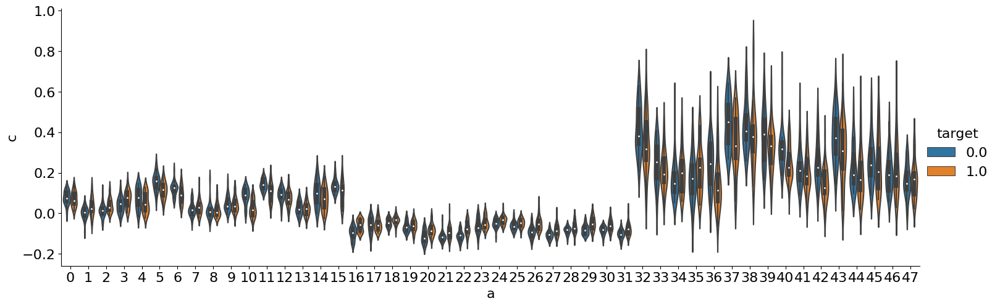

In [299]:
df_long = pd.melt(temp, "target", var_name="a", value_name="c")
sb.factorplot("a", hue="target", y="c", data=df_long, kind="violin", aspect=3)
plt.show()

# Examples of dataframe grouby

In [28]:
temp_y = np.stack(df_strain_comp.groupby(['phase'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=0)>0
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(5, 1296)
LGE positive patients:  226
LGE negative patients:  1070


In [29]:
temp_y = np.stack(df_strain_comp.groupby(['phase','aha'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=0)>0
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(80, 81)
LGE positive patients:  45
LGE negative patients:  36


In [30]:
# best groupby selection for patient and segment based target y
temp_y = np.stack(df_strain_comp.groupby(['pat'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=1)>0
print('LGE positive segments: ',(temp_y==True).sum())
print('LGE negative segments: ',(temp_y==False).sum())
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(81, 80)
LGE positive segments:  1130
LGE negative segments:  5350
LGE positive patients:  45
LGE negative patients:  36


In [31]:
temp_y = np.stack(df_peak.groupby(['pat'])['lge'].apply(list).values).astype(np.float32) # .reshape((42,16,5))
temp_y = np.stack(df_peak.groupby(['pat'])['lge'].apply(list).values).astype(np.float32) # .reshape((42,16,5))
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=1)>0
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(81, 16)
LGE positive patients:  45
LGE negative patients:  36


# Peak Strain via argmax or static phase slicing

Phases: [0:4] --> ED,MS,ES,PF,MD
Usually min(cs) and max(rs) should reflect the phase MS--> ES, which sould be phase==1

In [223]:
# for a patient based pos/neg splitting we need a list of patients with LGE pos and LGE neg
temp_y = np.stack(df_strain_comp.groupby(['pat'])['lge'].apply(list).values).astype(np.float32)
print(temp_y.shape)
temp_y_patients = temp_y.sum(axis=1)>0
pat_pos = df_strain_comp.pat.unique()[temp_y_patients==True]
pat_neg = df_strain_comp.pat.unique()[temp_y_patients==False]
print('LGE positive segments: ',(temp_y==True).sum())
print('LGE negative segments: ',(temp_y==False).sum())
print('LGE positive patients: ',(temp_y_patients==True).sum())
print('LGE negative patients: ',(temp_y_patients==False).sum())

(139, 80)
LGE positive segments:  2265
LGE negative segments:  8855
LGE positive patients:  84
LGE negative patients:  55


In [224]:
# peak strain values per LGE positive group
pd.set_option('display.float_format', lambda x: '%.4f' % x)
df_peak_positive = df_peak[df_peak['pat'].isin(pat_pos)] * 100
df_peak_positive.describe()

,aha,soa,lge,lgeef,first_split,dmd,prs_com_p,pcs_com_p,prs_com_arg,pcs_com_arg,prs_p2p_p,pcs_p2p_p,prs_p2p_arg,pcs_p2p_arg
count,1344.0000,1344.0000,1344.0000,1344.0000,1344.0000,1344.0000,1344.0000,1344.0000,1344.0000,1344.0000,1344.0000,1344.0000,1344.0000,1344.0000
mean,850.0000,6.3988,33.7054,23.6607,39.2857,100.0000,37.5371,-3.3214,69.3512,-6.8522,26.7521,-2.3501,37.1241,-4.8537
std,461.1488,24.4823,47.2879,42.5157,48.8567,0.0000,22.6019,3.1602,25.8393,3.0821,14.7550,2.8520,13.7981,2.1720
min,100.0000,0.0000,0.0000,0.0000,0.0000,100.0000,-6.2150,-13.2203,4.8246,-17.0380,-7.0542,-10.6541,3.5929,-12.4737
25%,475.0000,0.0000,0.0000,0.0000,0.0000,100.0000,21.0105,-5.5047,50.7678,-8.9358,15.9150,-4.3759,27.0224,-6.2552
50%,850.0000,0.0000,0.0000,0.0000,0.0000,100.0000,33.4685,-3.1991,67.5874,-6.7778,24.5109,-2.3846,36.5038,-4.7196
75%,1225.0000,0.0000,100.0000,0.0000,100.0000,100.0000,50.5552,-1.1774,85.7346,-4.6351,36.2648,-0.5735,46.8553,-3.3965
max,1600.0000,100.0000,100.0000,100.0000,100.0000,100.0000,155.1043,8.0890,193.6089,0.0003,92.5990,8.2668,92.5990,0.9583


In [225]:
# peak strain values per LGE negative group
df_peak_negative = df_peak[df_peak['pat'].isin(pat_neg)] * 100
df_peak_negative.describe()

,aha,soa,lge,lgeef,first_split,dmd,prs_com_p,pcs_com_p,prs_com_arg,pcs_com_arg,prs_p2p_p,pcs_p2p_p,prs_p2p_arg,pcs_p2p_arg
count,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000,880.0000
mean,850.0000,1.4773,0.0000,0.0000,43.6364,100.0000,40.7658,-4.1890,73.5182,-8.3121,30.1584,-3.0405,42.0129,-5.9536
std,461.2393,12.0711,0.0000,0.0000,49.6216,0.0000,23.2449,3.4628,28.0406,3.4683,16.1843,3.1677,16.5199,2.5202
min,100.0000,0.0000,0.0000,0.0000,0.0000,100.0000,-9.9229,-14.9838,15.6460,-17.0149,-9.1772,-12.5815,6.4264,-14.3411
25%,475.0000,0.0000,0.0000,0.0000,0.0000,100.0000,23.4819,-6.6414,53.7738,-10.8368,18.3656,-5.3147,29.6189,-7.5603
50%,850.0000,0.0000,0.0000,0.0000,0.0000,100.0000,35.9928,-4.1683,69.8194,-8.4293,27.7992,-3.1860,39.8688,-6.1606
75%,1225.0000,0.0000,0.0000,0.0000,100.0000,100.0000,53.4952,-1.5896,89.6422,-5.9366,39.3133,-0.8390,52.5953,-4.1488
max,1600.0000,100.0000,0.0000,0.0000,100.0000,100.0000,141.4967,5.4464,189.0217,0.0148,92.4934,7.5950,112.6595,1.0695


In [226]:
df_p2p_pos = df_strain_p2p[df_strain_p2p['pat'].isin(pat_pos)] * 100
df_p2p_pos.describe()

,aha,phase,our_rs,our_cs,soa,lge,lgeef,first_split,dmd
count,6720.0000,6720.0000,6720.0000,6720.0000,6720.0000,6720.0000,6720.0000,6720.0000,6720.0000
mean,850.0000,200.0000,13.3057,1.5489,6.3988,33.7054,23.6607,39.2857,100.0000
std,461.0115,141.4319,18.1117,5.8813,24.4750,47.2739,42.5031,48.8422,0.0000
min,100.0000,0.0000,-20.4299,-12.4737,0.0000,0.0000,0.0000,0.0000,100.0000
25%,475.0000,100.0000,-0.9991,-2.7183,0.0000,0.0000,0.0000,0.0000,100.0000
50%,850.0000,200.0000,8.4244,0.5279,0.0000,0.0000,0.0000,0.0000,100.0000
75%,1225.0000,300.0000,25.5569,4.8878,0.0000,100.0000,0.0000,100.0000,100.0000
max,1600.0000,400.0000,92.5990,30.2995,100.0000,100.0000,100.0000,100.0000,100.0000


In [227]:
df_p2p_neg = df_strain_p2p[df_strain_p2p['pat'].isin(pat_neg)] * 100
df_p2p_neg.describe()

,aha,phase,our_rs,our_cs,soa,lge,lgeef,first_split,dmd
count,4400.0000,4400.0000,4400.0000,4400.0000,4400.0000,4400.0000,4400.0000,4400.0000,4400.0000
mean,850.0000,200.0000,15.3715,1.7648,1.4773,0.0000,0.0000,43.6364,100.0000
std,461.0296,141.4374,20.5499,6.9518,12.0656,0.0000,0.0000,49.5990,0.0000
min,100.0000,0.0000,-21.6709,-14.3411,0.0000,0.0000,0.0000,0.0000,100.0000
25%,475.0000,100.0000,-0.7942,-3.5050,0.0000,0.0000,0.0000,0.0000,100.0000
50%,850.0000,200.0000,9.7652,0.5566,0.0000,0.0000,0.0000,0.0000,100.0000
75%,1225.0000,300.0000,28.6510,6.0867,0.0000,0.0000,0.0000,100.0000,100.0000
max,1600.0000,400.0000,112.6595,28.2130,100.0000,0.0000,0.0000,100.0000,100.0000


In [228]:
# does the strain values come from two different distributions
from scipy import stats

@interact
def p_test(col = df_p2p_neg.columns, p = df_p2p_neg.phase.unique()):
    try:
        print(df_p2p_neg[col].shape)
        df_temp_neg = df_p2p_neg[df_p2p_neg['phase'].isin([p])]
        df_temp_pos = df_p2p_pos[df_p2p_pos['phase'].isin([p])]
        return stats.ttest_ind(df_temp_neg[col], df_temp_pos[col])
    except Exception as e:
        print(e)

interactive(children=(Dropdown(description='col', options=('pat', 'aha', 'phase', 'our_rs', 'our_cs', 'soa', '…

In [229]:
# does the strain values come from two different distributions
from scipy import stats
# [c for c in df_peak_negative.columns if 'p2p' in c]
@interact
def p_test(col = df_peak_negative.columns):
    try:
        print(df_peak_negative[col].shape)
        return stats.ttest_ind(df_peak_negative[col], df_peak_positive[col])
    except Exception as e:
        print(e)

interactive(children=(Dropdown(description='col', options=('pat', 'aha', 'soa', 'lge', 'lgeef', 'first_split',…

In [230]:
# segment and phase with the maximal difference between LGE pos and negative group
df_strain_p2p_positive = df_strain_p2p[df_strain_p2p['lge']==1]
temp_pos = df_strain_p2p_positive.groupby(['aha','phase']).mean()

df_strain_p2p_negative = df_strain_p2p[df_strain_p2p['lge']==0]
temp_neg = df_strain_p2p_negative.groupby(['aha','phase']).mean()

diff = abs(temp_pos - temp_neg)*100
diff[['our_rs', 'our_cs']]

our_rs  our_cs
aha phase                
1   0      0.0798  1.3478
    1     10.0791  1.0941
    2     10.6080  1.0188
    3      8.0425  5.0886
    4      2.3627  2.8961
...           ...     ...
16  0      0.1940  0.1972
    1      0.3500  1.3397
    2      2.5540  1.6548
    3      1.0735  3.9232
    4      0.5738  1.2069

[80 rows x 2 columns]

******************** strain composed ********************
prs: Counter({2: 1983, 3: 194, 1: 45, 4: 2})
pcs: Counter({2: 1672, 3: 419, 1: 84, 4: 43, 0: 6})


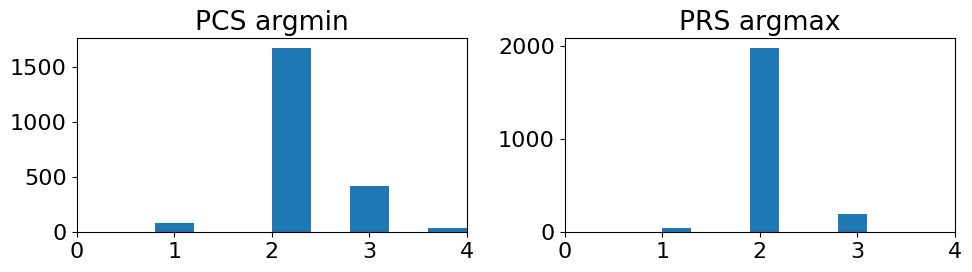

******************** strain p2p ********************
prs: Counter({2: 1402, 1: 728, 3: 65, 4: 25, 0: 4})
pcs: Counter({2: 1634, 1: 546, 3: 25, 0: 11, 4: 8})


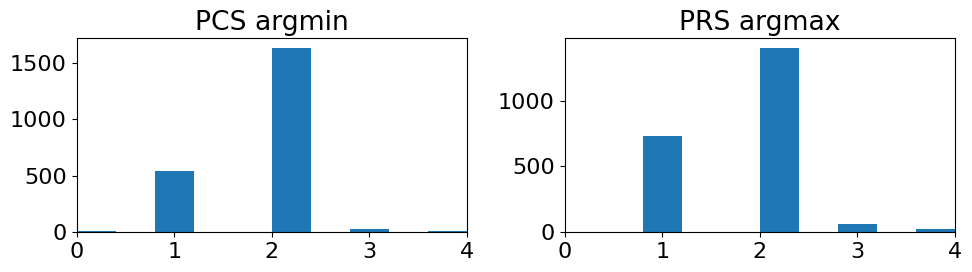

In [231]:
def show_phase_with_max_min_strain(df):
    from collections import Counter
    fig, ax = plt.subplots(1,2,figsize=(10,3))
    # peak radial strain
    rs = np.stack(df.groupby(['pat','aha'])['our_rs'].apply(list).values).astype(np.float32)
    # peak circumferential strain
    cs = np.stack(df.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)

    prs_argmax = np.argmax(rs, axis=1)
    pcs_argmin = np.argmin(cs, axis=1)
    print('prs: {}'.format(Counter(prs_argmax)))
    print('pcs: {}'.format(Counter(pcs_argmin)))

    # plot
    ax[0].hist(pcs_argmin)
    ax[0].set_title('PCS argmin')
    ax[0].set_xlim(0,4)
    ax[1].hist(prs_argmax)
    ax[1].set_title('PRS argmax')
    ax[1].set_xlim(0,4)
    plt.tight_layout()
    plt.show()
    
print('*'*20,'strain composed','*'*20)
show_phase_with_max_min_strain(df_strain_comp)
print('*'*20,'strain p2p','*'*20)
show_phase_with_max_min_strain(df_strain_p2p)

******************** strain composed lge pos ********************
prs: Counter({2: 389, 3: 59, 1: 4, 4: 1})
pcs: Counter({2: 328, 3: 105, 4: 9, 1: 9, 0: 2})


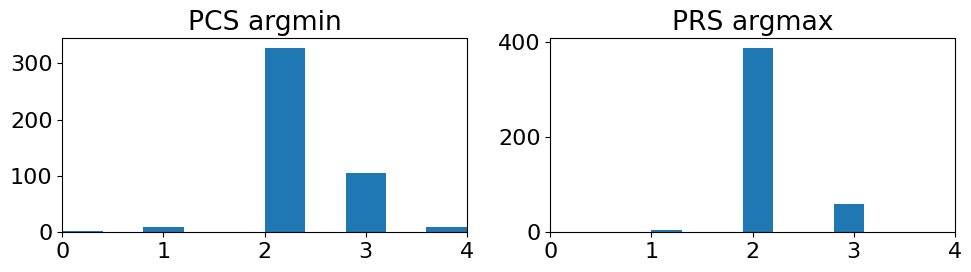

******************** strain composed lge neg ********************
prs: Counter({2: 1594, 3: 135, 1: 41, 4: 1})
pcs: Counter({2: 1344, 3: 314, 1: 75, 4: 34, 0: 4})


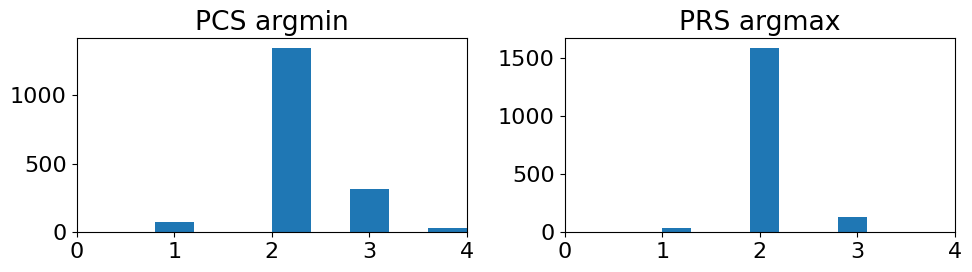

******************** strain p2p lge pos ********************
prs: Counter({2: 314, 1: 120, 3: 17, 4: 2})
pcs: Counter({2: 338, 1: 101, 3: 9, 4: 3, 0: 2})


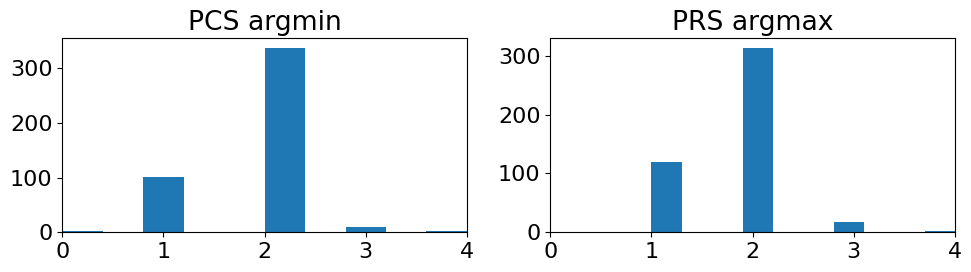

******************** strain p2p lge neg ********************
prs: Counter({2: 1088, 1: 608, 3: 48, 4: 23, 0: 4})
pcs: Counter({2: 1296, 1: 445, 3: 16, 0: 9, 4: 5})


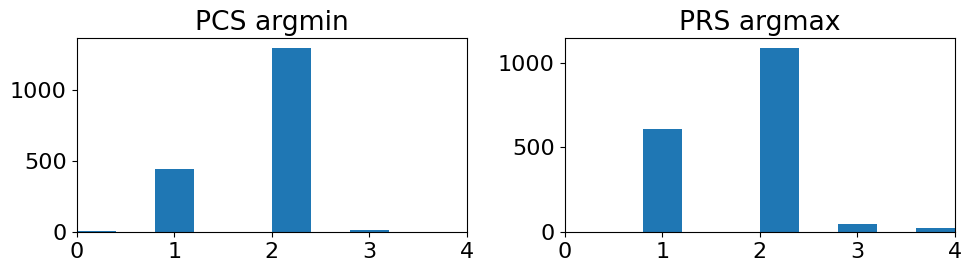

In [232]:
# occurence of the peak and min values per outcome group and strain
df_strain_comp_positive = df_strain_comp[df_strain_comp['lge']==1]
df_strain_comp_negative = df_strain_comp[df_strain_comp['lge']==0]
print('*'*20,'strain composed lge pos','*'*20)
show_phase_with_max_min_strain(df_strain_comp_positive)
print('*'*20,'strain composed lge neg','*'*20)
show_phase_with_max_min_strain(df_strain_comp_negative)

df_strain_p2p_positive = df_strain_p2p[df_strain_p2p['lge']==1]
df_strain_p2p_negative = df_strain_p2p[df_strain_p2p['lge']==0]
print('*'*20,'strain p2p lge pos','*'*20)
show_phase_with_max_min_strain(df_strain_p2p_positive)
print('*'*20,'strain p2p lge neg','*'*20)
show_phase_with_max_min_strain(df_strain_p2p_negative)

# Pairplot

## Composed Strain

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


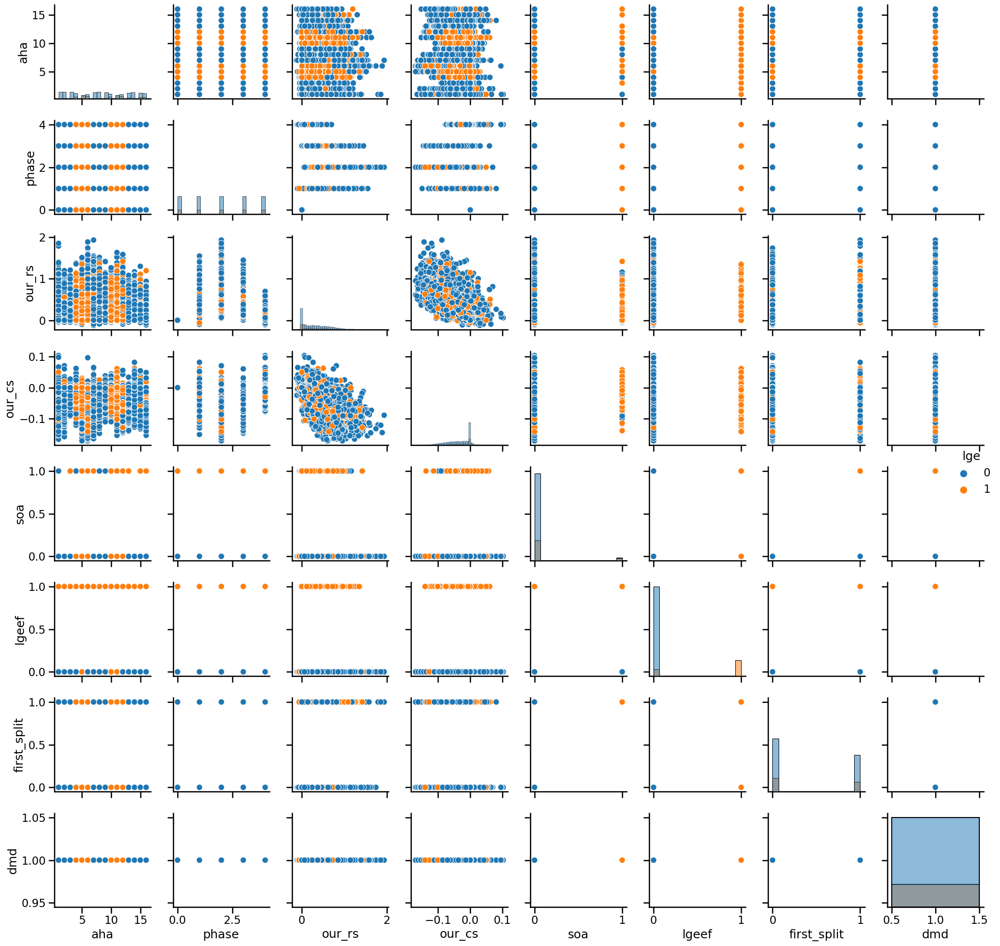

In [233]:
sb.set_context("talk")
g = sb.pairplot(data=df_strain_comp,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

## p2p Strain

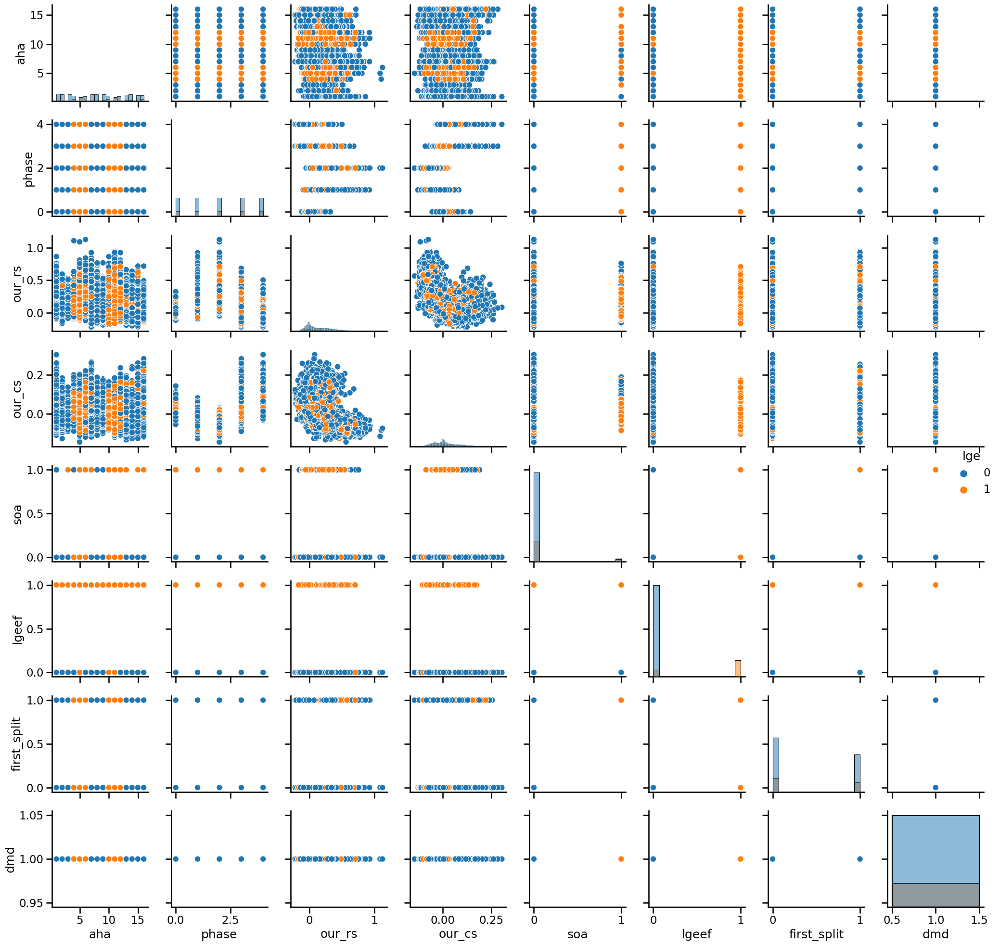

In [234]:
sb.set_context("talk")
g = sb.pairplot(data=df_strain_p2p,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

## Peak Strain

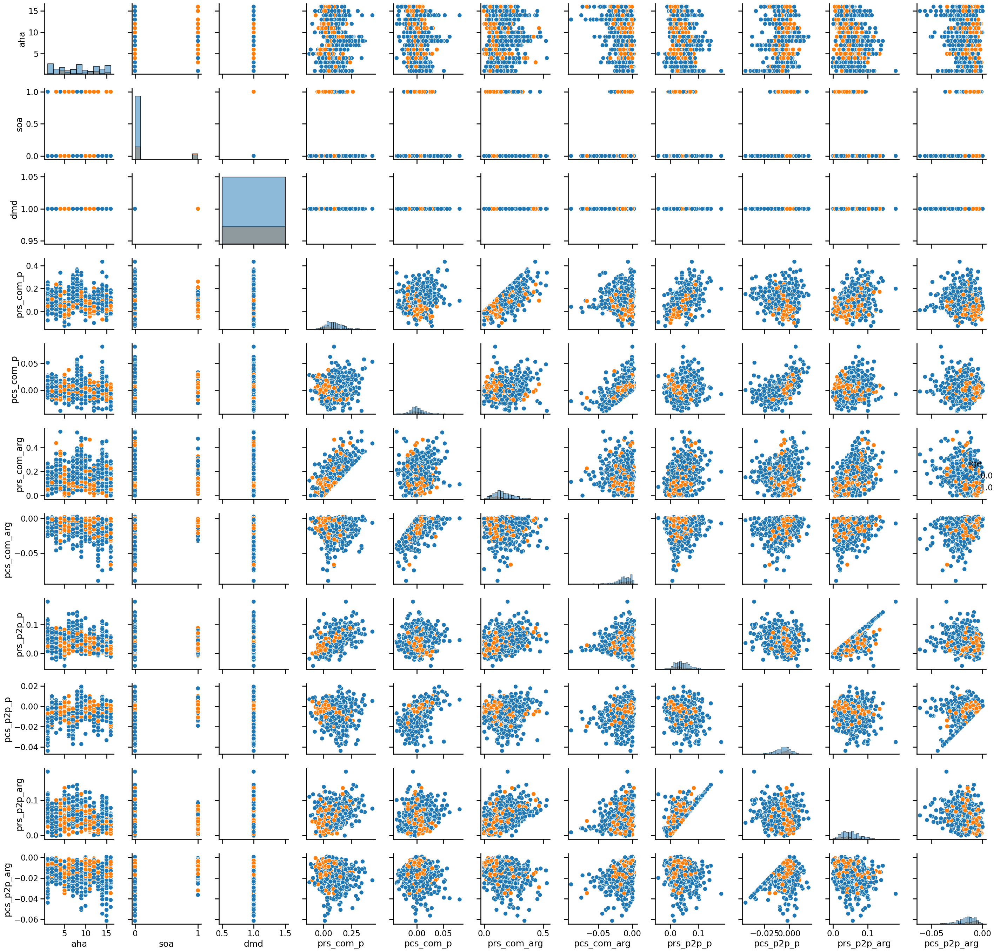

In [36]:
sb.set_context("talk")
g = sb.pairplot(data=df_peak,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

# Correlation plots

## Composed Strain

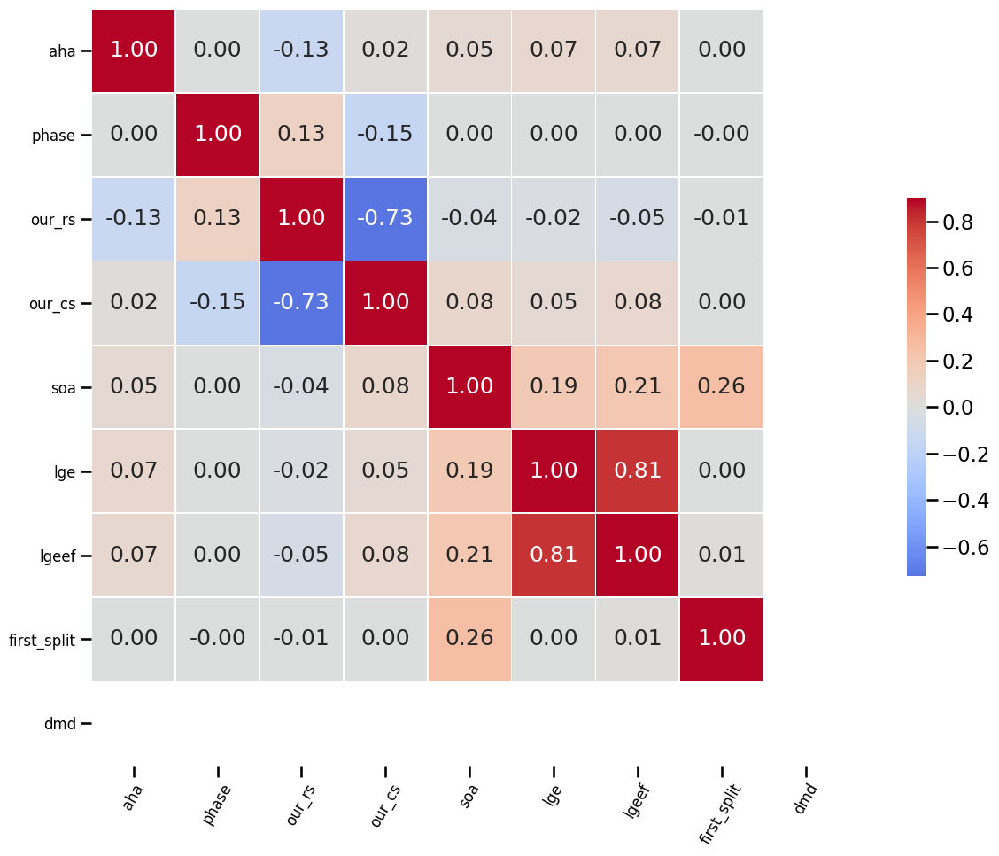

In [235]:
fig, ax = plt.subplots(figsize=(14,10)) 
corr = df_strain_comp.corr(method='pearson')
g = sb.heatmap(corr,  vmax=.9, center=0,ax=ax,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 12)
_ = g.set_xticklabels(g.get_xticklabels(), rotation = 60, fontsize = 12)
plt.tight_layout()
plt.show()
#fig.savefig('strain_corr_cvi_vs_ours.png')

## p2p Strain

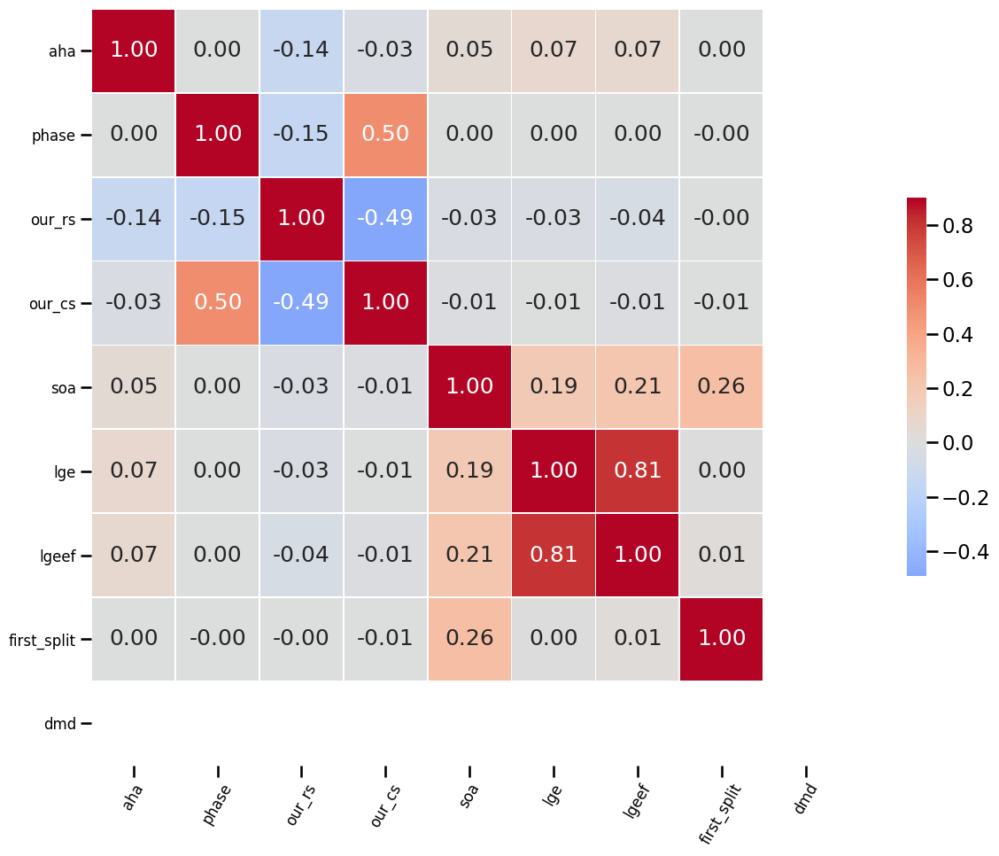

In [236]:
fig, ax = plt.subplots(figsize=(14,10)) 
corr = df_strain_p2p.corr(method='pearson')
g = sb.heatmap(corr,  vmax=.9, center=0,ax=ax,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 12)
_ = g.set_xticklabels(g.get_xticklabels(), rotation = 60, fontsize = 12)
plt.tight_layout()
plt.show()

## Peak Strain

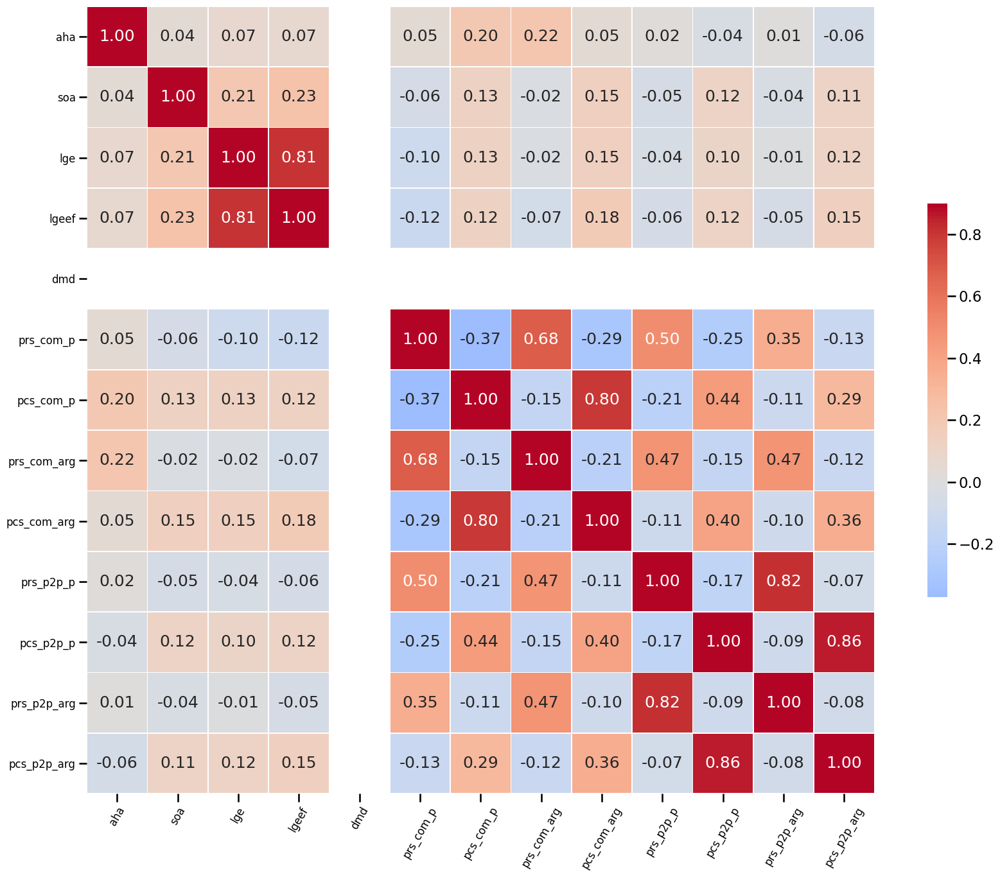

In [52]:
fig, ax = plt.subplots(figsize=(18,14)) 
corr = df_peak.corr(method='pearson')
g = sb.heatmap(corr,  vmax=.9, center=0,ax=ax,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 12)
_ = g.set_xticklabels(g.get_xticklabels(), rotation = 60, fontsize = 12)
plt.tight_layout()
plt.show()

# Strain per phase

Extract one feature Vector per Patient (56 patients times 16 segments times 5 phases times two feature (rs, cs))

- 32 LGE positive patients
- 24 LGE negative patients

## Strain per patient from composed df (56 x 16 x 5 x 2) --> 56, 160

In [13]:
# fit one model per segment
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score
from sklearn.tree import DecisionTreeClassifier
# iterate over the aha segments
# create a sub dataframe of PRS, PCS or comp, p2p
# with the shape: patients, features (56, 2 or 56,psp+com)
# extract x and y for this segment
estimators = []
preds = []
y_tests = []
patients = df_strain_p2p.pat.unique()
X_train, X_test, _, _ = train_test_split(
    patients, patients, test_size=0.2, random_state=42)
# iterate over the segments
for seg in df_strain_p2p.aha.unique():
    print("segment: {}".format(seg))
    # create a temp sub df for only the train patients
    df_strain_p2p_temp = df_strain_p2p[df_strain_p2p['pat'].isin(X_train)]
    df_strain_comp_temp = df_strain_comp[df_strain_comp['pat'].isin(X_train)]
    df_strain_p2p_test = df_strain_p2p[df_strain_p2p['pat'].isin(X_test)]
    df_strain_comp_test = df_strain_comp[df_strain_comp['pat'].isin(X_test)]
    
    # filter the current segment
    seg_of_interest= [seg]
    df_strain_p2p_temp = df_strain_p2p_temp[df_strain_p2p_temp['aha'].isin(seg_of_interest)]
    df_strain_comp_temp = df_strain_comp_temp[df_strain_comp_temp['aha'].isin(seg_of_interest)]
    df_strain_p2p_test = df_strain_p2p_test[df_strain_p2p_test['aha'].isin(seg_of_interest)]
    df_strain_comp_test = df_strain_comp_test[df_strain_comp_test['aha'].isin(seg_of_interest)]
    
    # 280,7 --> 56 patients x 5 phases = 280; and ['pat', 'aha', 'phase', 'our_rs', 'our_cs', 'soa', 'lge']
    cs_p2p = np.stack(df_strain_p2p_temp.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    cs_comp = np.stack(df_strain_comp_temp.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    x_ = cs_comp#np.concatenate([cs_p2p, cs_comp], axis=1)
    y_ = np.stack(df_strain_p2p_temp.groupby(['pat','aha'])['lge'].apply(list).values).astype(np.float32)
    y_ = y_.sum(axis=1)>0
    
    cs_p2p_test = np.stack(df_strain_p2p_test.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    cs_comp_test = np.stack(df_strain_comp_test.groupby(['pat','aha'])['our_cs'].apply(list).values).astype(np.float32)
    x_test = cs_comp_test#np.concatenate([cs_p2p_test, cs_comp_test], axis=1)
    y_test = np.stack(df_strain_p2p_test.groupby(['pat','aha'])['lge'].apply(list).values).astype(np.float32)
    y_test = y_test.sum(axis=1)>0
    if y_.sum()>4:
        clf_ = make_pipeline(MinMaxScaler(), DecisionTreeClassifier(class_weight='balanced'))
        clf_.fit(x_, y_)
        train_preds = clf_.predict(x_)
        estimators.append(('{}'.format(seg), clf_))
        pred_ = clf_.predict(x_test)
        preds.append(pred_)
        y_tests.append(y_test)
        print(accuracy_score(y_, train_preds))
        print(precision_score(y_, train_preds))
        print(accuracy_score(y_test, pred_))
        print(precision_score(y_test, pred_))
        #cross_validate_f1(x_,y_); plt.show()
    else:
        print('only {} pos examples, no splits possible'.format(y_.sum()))

segment: 4
1.0
1.0
0.5
0.0
segment: 5
1.0
1.0
0.75
1.0
segment: 6
1.0
1.0
0.8333333333333334
0.75
segment: 11
1.0
1.0
0.6666666666666666
0.6
segment: 12
1.0
1.0
0.3333333333333333
0.0


In [14]:
preds_stack = np.stack(preds, axis=0)
print(preds_stack.shape)
y_tests_stack = np.stack(y_tests, axis=0)
for p in range(y_tests_stack.shape[1]):
    print('--'*10)
    print(preds_stack[:,p].sum())
    print(y_tests_stack[:,p].sum())

(5, 12)
--------------------
1
0
--------------------
3
5
--------------------
1
3
--------------------
1
0
--------------------
1
0
--------------------
1
0
--------------------
3
0
--------------------
0
0
--------------------
2
5
--------------------
1
2
--------------------
1
3
--------------------
3
5


In [15]:
# check for nan and infinit values
x[~np.isfinite(x)]

array([], dtype=float32)

# Unsupervised Clustering

In [30]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

#temp_2d = TSNE(n_components=2, perplexity=4, learning_rate=50).fit_transform(x)
#temp_2d = PCA(n_components=2).fit_transform(x)
temp_2d = make_pipeline(
    #StandardScaler(),
    MinMaxScaler(),
    #NeighborhoodComponentsAnalysis(n_components=4, random_state=42),
    TSNE(n_components=2, perplexity=2, learning_rate=500, method='exact', init='pca')
    ).fit_transform(x)

NameError: name 'make_pipeline' is not defined

(57, 3)


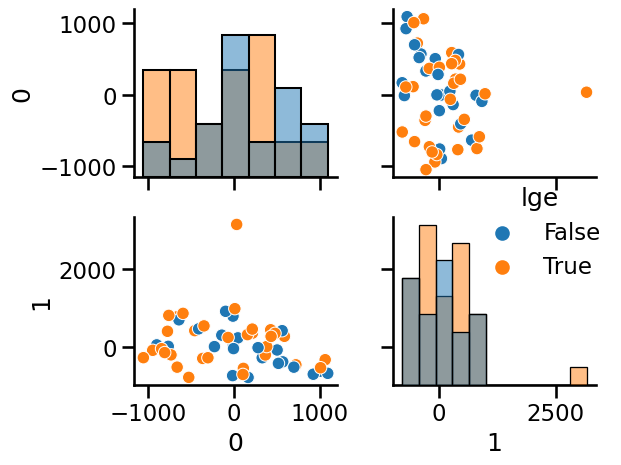

In [172]:
sb.set_context("talk")
df_temp = pd.DataFrame(temp_2d)
df_temp['lge'] = y
print(df_temp.shape)
g = sb.pairplot(data=df_temp,diag_kind="hist", hue='lge')
plt.tight_layout()
plt.show()

In [ ]:
cross_validate_f1(temp_2d,y)

********** Logistic Regression **********
[0.57142857 0.71428571 0.5        0.5        0.42857143]
F1: 0.55 (+/- 0.08) [Logistic Regression]
Recall: 0.54 (+/- 0.10) [Logistic Regression]
Accuracy: 0.48 (+/- 0.11) [Logistic Regression]
********** Random Forest **********
[0.85714286 0.85714286 0.5        0.5        0.71428571]
F1: 0.69 (+/- 0.13) [Random Forest]
Recall: 0.69 (+/- 0.16) [Random Forest]
Accuracy: 0.66 (+/- 0.11) [Random Forest]
********** Naive Bayes **********
[0.85714286 0.85714286 1.         0.83333333 1.        ]
F1: 0.72 (+/- 0.06) [Naive Bayes]
Recall: 0.91 (+/- 0.07) [Naive Bayes]
Accuracy: 0.54 (+/- 0.08) [Naive Bayes]
********** Scaled DecissionTree **********
[0.85714286 0.57142857 0.5        0.5        0.71428571]
F1: 0.67 (+/- 0.13) [Scaled DecissionTree]
Recall: 0.63 (+/- 0.14) [Scaled DecissionTree]
Accuracy: 0.65 (+/- 0.16) [Scaled DecissionTree]
********** KNN **********
[0.71428571 0.42857143 0.5        0.5        0.57142857]
F1: 0.64 (+/- 0.11) [KNN]
Rec

/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/sven/anaconda3/envs/dcmr/lib/python3.8/site-packages/sklearn/met

# Model Essemble according to different metrics


    best_params = results.head(1)['params'].values[0]

--> Here we get a dict with parameters to create a classification pipeline 
--> e.g.: {'clf': SVC(C=1, class_weight='balanced', kernel='poly'), 'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__degree': 3, 'clf__gamma': 'scale', 'clf__kernel': 'poly', 'scaler': None}

    gs.best_estimator_

--> returns a pipeline object, consiting of a scaler and a classifier step, both with preset params for the best pipeline according to the refit score of the gridsearch cv

    gs.best_estimator_.set_params(**best_params)

--> This will overwrite the scaler and classifier steps in the best pipeline

In [218]:
# best balanced accuracy
results.sort_values(by='rank_test_balanced_accuracy', inplace=True, ascending=True)
params_best_ba = results.head(1)['params'].values[0]
print(params_best_ba)
clf_best_ba = gs.best_estimator_.set_params(**params_best_ba)
clf_best_ba

{'clf': LogisticRegression(class_weight='balanced', max_iter=10000, random_state=1), 'clf__C': 10, 'clf__class_weight': None, 'clf__penalty': 'l2', 'clf__solver': 'liblinear', 'scaler': None}


Pipeline(steps=[('scaler', None),
                ('clf',
                 LogisticRegression(C=10, max_iter=10000, random_state=1,
                                    solver='liblinear'))])

In [219]:
# best f1
results.sort_values(by='rank_test_f1', inplace=True,ascending=True)
params_best_f1 = results.head(1)['params'].values[0]
print(params_best_f1)
clf_best_f1 = gs.best_estimator_.set_params(**params_best_f1)
clf_best_f1

{'clf': SVC(C=20, degree=2, gamma=0.001), 'clf__C': 20, 'clf__class_weight': None, 'clf__degree': 3, 'clf__gamma': 0.001, 'clf__kernel': 'rbf', 'scaler': MinMaxScaler()}


Pipeline(steps=[('scaler', MinMaxScaler()), ('clf', SVC(C=20, gamma=0.001))])

In [220]:
# best average precision
results.sort_values(by='rank_test_sens', inplace=True,ascending=True)
params_best_ap = results.head(1)['params'].values[0]
print(params_best_ap)
clf_best_ap = gs.best_estimator_.set_params(**params_best_ap)
clf_best_ap

{'clf': SVC(C=20, gamma=0.001), 'clf__C': 5, 'clf__class_weight': 'balanced', 'clf__degree': 2, 'clf__gamma': 1e-06, 'clf__kernel': 'poly', 'scaler': StandardScaler()}


Pipeline(steps=[('scaler', StandardScaler()),
                ('clf',
                 SVC(C=5, class_weight='balanced', degree=2, gamma=1e-06,
                     kernel='poly'))])

In [221]:
from sklearn.ensemble import VotingClassifier
eclf = VotingClassifier(
        estimators=[
            ('ba', clf_best_ba), 
            ('f1', clf_best_f1),
            ('ap', clf_best_ap)
                   ],
        voting='hard')

Sensitivity: 1.00 (+/- 0.00)
Specifity: 0.00 (+/- 0.00)
params: None
Recall: 1.00 (+/- 0.00)
Accuracy: 0.58 (+/- 0.03)
Precision: 0.58 (+/- 0.03)
Balanced Accuracy: 0.50 (+/- 0.00)
F1: 0.73 (+/- 0.03)
AUC: 0.50 (+/- 0.00)


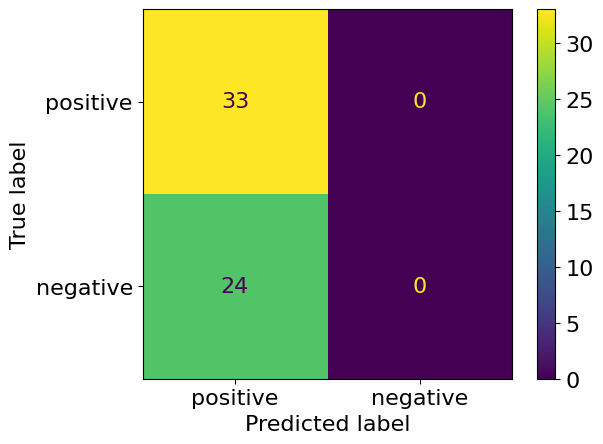

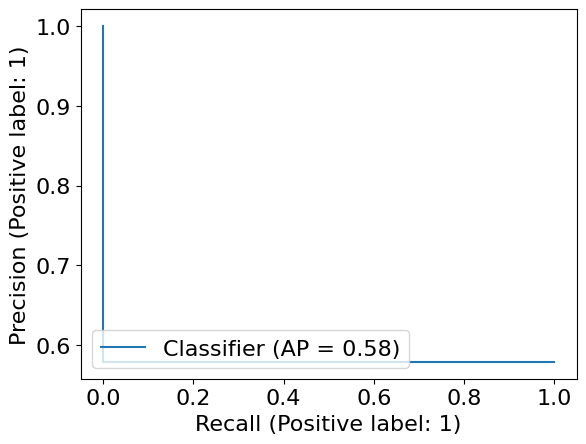

In [222]:
plot_report(eclf, x_train, y_train);plt.show()

In [47]:
# re-calculate the scores of the current best clinical practice
from sklearn.metrics import (precision_recall_curve,
                                 PrecisionRecallDisplay)

def my_spec(gt,pred):
        tn, fp, fn, tp = confusion_matrix(gt, pred).ravel()
        specificity = tn / (tn+fp)
        return specificity
def my_sens(gt,pred):
    tn, fp, fn, tp = confusion_matrix(gt, pred).ravel()
    sensitivity = tp / (tp+fn)
    return sensitivity

TP = 26
FN = 6
FP = 9
TN = 15

tp = [1]*TP
y_pred = tp
y = tp

tn = [0]*TN
y_pred = y_pred + tn
y = y + tn

fp_pred = [1]*FP
fp_y = [0]*FP
y_pred = y_pred + fp_pred
y = y + fp_y

fn_pred = [0]*FN
fn_y = [1]*FN
y_pred = y_pred + fn_pred
y = y + fn_y


import sklearn
CBP_results = sklearn.metrics.precision_recall_fscore_support(y,y_pred, average='binary')
print('specifity: {:.2f}'.format(my_spec(y, y_pred)))
print('sensitivity: {:.2f}'.format(my_sens(y, y_pred)))
print('Precision: {:.2f}\nRecall: {:.2f}'.format(CBP_results[0], CBP_results[1]))
print('F1 Score: {:.2f}'.format(sklearn.metrics.f1_score(y,y_pred)))
print('Accuracy: {:.2f}'.format(sklearn.metrics.accuracy_score(y,y_pred)))
print('Balanced accuracy: {:.2f}'.format(sklearn.metrics.balanced_accuracy_score(y,y_pred)))
print('AUC: {:.2f}'.format(sklearn.metrics.roc_auc_score(y,y_pred)))
disp = ConfusionMatrixDisplay.from_predictions(y, y_pred,labels=[1,0], display_labels=['positive','negative'],colorbar=True)
disp = PrecisionRecallDisplay.from_predictions(y,y_pred)


# calculate the measures for the Current best practice



# Precision = TP / (TP+FP) 


sensitivity: 0.81
specifity: 0.62
Precision: 0.74
Recall: 0.81
F1 Score: 0.78
Accuracy: 0.73
Balanced accuracy: 0.72
AUC: 0.72


# validate Y extraction across sheets

In [80]:
a = pd.read_csv('/mnt/ssd2/data/dmd_circ_81/02_imported_4D_unfiltered/SAx_3D_dicomTags_phase.csv')
a[['lgepos']].applymap(lambda x : x != 'None').values

array([[False],
       [ True],
       [ True],
       [ True],
       [False],
       [ True],
       [ True],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [ True],
       [False],
       [ True],
       [False],
       [False],
       [ True],
       [ True],
       [False],
       [ True],
       [False],
       [ True],
       [ True],
       [False],
       [ True],
       [ True],
       [ True],
       [False],
       [ True],
       [False],
       [False],
       [ True],
       [False],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [False],
       [False],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [False],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [False],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [ True],
       [ True],
       [

In [78]:
b = pd.read_csv('/mnt/sds/sd20i001/sven/code/dynamic-cmr-models/exp/p2p/circulation/dmd57/iso2_5_32_p2p/hist_img05_flow05_msk1/msessim_grad_dice/2023-07-21_21_16_1159219/inf81/df_DMD_time_p2p.csv')
b[['pat','lge']]

,pat,lge
0,aea_20220314,0.0
1,aea_20220314,0.0
2,aea_20220314,0.0
3,aea_20220314,0.0
4,aea_20220314,0.0
...,...,...
6475,zs_20200225,0.0
6476,zs_20200225,0.0
6477,zs_20200225,0.0
6478,zs_20200225,0.0


# Histogram-matching tests

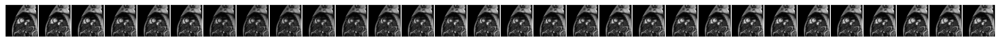

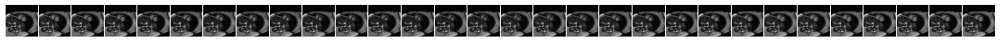

In [72]:
# load some images, test the histogram matching
from src.visualization.Visualize import show_2D_or_3D
from src.data.Dataset import match_hist_any_dim
img_a = sitk.GetArrayFromImage(sitk.ReadImage(sorted(glob.glob('/mnt/ssd2/data/dmd_circ_81/02_imported_4D_unfiltered/sax/*clean.nrrd'))[0]))
img_b = sitk.GetArrayFromImage(sitk.ReadImage(sorted(glob.glob('/mnt/ssd2/data/dmd_circ_57/02_imported_4D_unfiltered/sax/*clean.nrrd'))[12]))
show_2D_or_3D(img_a[:,20]);plt.show()
show_2D_or_3D(img_b[:,20]);plt.show()

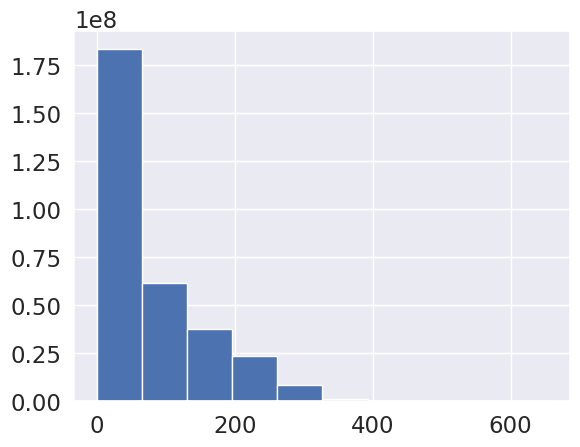

In [73]:
plt.hist(img_a.flatten(),bins=10);plt.show()

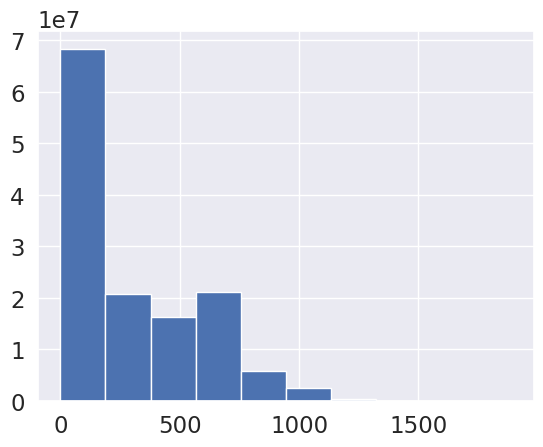

In [74]:
plt.hist(img_b.flatten(),bins=10);plt.show()

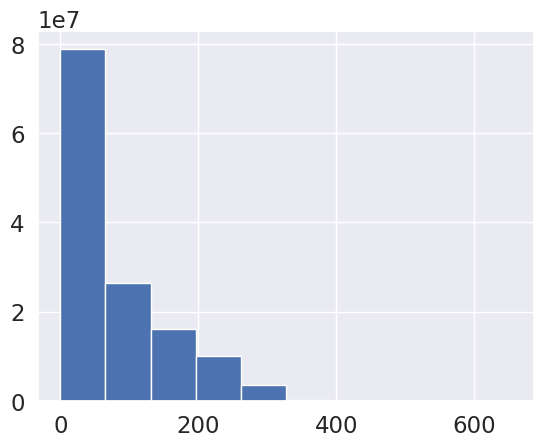

In [75]:
img_b_matched = match_hist_any_dim(img_b,ref=img_a)
plt.hist(img_b_matched.flatten(),bins=10);plt.show()

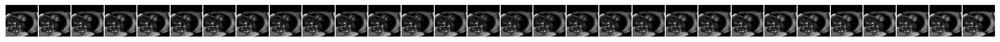

In [79]:
show_2D_or_3D(img_b_matched[:,20]);plt.show()